In [ ]:
import os                                                                    # os library
import numpy as np                                                           # numpy library
import pandas as pd                                                          # pandas library
import matplotlib.pylab as plt                                               # plotting and visualization library
import seaborn as sns                                                        # plotting
import statsmodels.api as sm                                                 # for running regressions
np.random.seed(2018)                                                         # Random seed for replication



# Configure visual settings:
plt.style.use('fivethirtyeight')
sns.set(font_scale=2)
cmap = sns.diverging_palette(220, 10, as_cmap=True) # one of the many color mappings from
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (10.0, 8.0)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [ ]:
pip install numpy pandas matplotlib seaborn statsmodels


[notice] A new release of pip is available: 23.0.1 -> 25.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import os                      # just ensuring the files using as working Directory(pwd)
print(os.listdir())

['ai_powered)_behavioural.ipynb', 'NSDUH_2015-2019 OPIOID.csv', 'AI-Powered Behavioral Analysis on Drug Addiction - Features.docx', '.DS_Store', 'Untitled.ipynb', 'NSDUH_2015-2019.csv', 'OPINMMON_values.txt', 'node_modules', 'package-lock.json', 'package.json', 'open.py', 'complete_opioid_dataset.csv', '.ipynb_checkpoints', 'archive.zip', 'OPINMYR_values.txt', '~$-Powered Behavioral Analysis on Drug Addiction - Features.docx', '2015 NSDUH.pdf', 'inputs']


In [ ]:
# Prescriber related datasets disaggregated by state,county,zip and rate
pres_info_df = pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/prescriber_summary.csv')
Prescriber_state_df =pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/Prescriber_state.csv')
Prescriber_county_df =pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/Prescriber_county.csv')
Prescriber_zip_df =pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/Prescriber_zip.csv')
psr_df= pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/prescriber_state_rate.csv')
pcr_df = pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/prescriber_county_rate.csv')
pzr_df= pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/prescriber_zip_rate.csv')
# Drugs, Mental health and Deaths datasets different datasources
KFFMentalHealthspendState_df =pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/KFFMentalHealthspendState.csv')
pop_urban_df =pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/pop-urban-pct-historical_cleaned_up.csv')
rawdataKFFopioiddeath_df = pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/rawdataKFFopioiddeath.csv', engine ="python", encoding='latin1')
Wonder_Drug_Death_Data1_df = pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/Wonder_Drug_Death_Data_1.csv')
Wonder_Drug_Death_Data2_df = pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/Wonder_Drug_Death_Data_2.csv')
drugs_df = pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/list_opioids.csv')
# crime related data both property and nonviolent
violentcrime_df =pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/violentcrime19992014.csv')
propertycrime_df=pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/propertycrime19992014.csv')
tcrime_df =pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/TotalVncrime.csv')

# National Health Expenditure from 2009-2016
NHE2016_df = pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/NHE2016.csv',engine='python')

In [ ]:
pres_info_df.head()[:2]  # the data is about the Medicare part D prescriber summary extracted from cms

,Prscrbr_NPI,Prscrbr_Last_Org_Name,Prscrbr_First_Name,Prscrbr_MI,Prscrbr_Crdntls,Prscrbr_Gndr,Prscrbr_Ent_Cd,Prscrbr_St1,Prscrbr_St2,Prscrbr_City,...,Bene_Male_Cnt,Bene_Race_Wht_Cnt,Bene_Race_Black_Cnt,Bene_Race_Api_Cnt,Bene_Race_Hspnc_Cnt,Bene_Race_Natind_Cnt,Bene_Race_Othr_Cnt,Bene_Dual_Cnt,Bene_Ndual_Cnt,Bene_Avg_Risk_Scre
0,1003000126,Enkeshafi,Ardalan,NaN,M.D.,M,I,6410 Rockledge Dr Ste 304,NaN,Bethesda,...,51.0,99.0,20.0,21.0,NaN,0.0,NaN,62.0,93.0,2.059633
1,1003000142,Khalil,Rashid,NaN,M.D.,M,I,4126 N Holland Sylvania Rd,Suite 220,Toledo,...,183.0,277.0,184.0,NaN,26.0,NaN,12.0,289.0,213.0,1.903775


In [ ]:
#  extracted from from CMS Medicare Part D Opioid Prescribing Geographic 2013-2016 Excel file and
# created CSV files for the three taps 1) state 2) county and 3) zip
# Stored presciber-state file in a variable(df2)
Prescriber_state_df.fillna('National')[:2]   # the data is about the prescriber/Physician_Locator

,State_Name,State_Abbreviation,State_FIPS,2013_Part_ D_Prescribers,2013_Part_Opioid_Prescribers,2013_Opioid Claims,2013_Extended_Release_Opioid_Claims,2013_Overall_Claims,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,...,2016_Part D Opioid Prescribers,2016_Opioid Claims,2016_Extended Release Opioid Claims,2016_Overall_Claims,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate,2013_2015_Change_in_Opioid_Prescribing_Rate,2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate
0,National,National,National,"1,037,770","491,500","78,045,683","4,773,286","1,342,096,654",5.82,6.12,...,496350,77716608,5381275,1452978228,5.34,6.92,-0.47,0.80,-0.30,0.59
1,Alabama,AL,1.0,"12,820","7,422","2,260,284","118,523","29,160,952",7.75,5.24,...,"7,004","2,156,504","120,579","28,882,148",7.47,5.59,-0.28,0.35,-0.21,0.31


In [ ]:
# here just filling the NaN value due to the columns mismatach as there is no need fo data on
# state abrevation and state state FIPs
Prescriber_state_df.fillna("National")[:5]

,State_Name,State_Abbreviation,State_FIPS,2013_Part_ D_Prescribers,2013_Part_Opioid_Prescribers,2013_Opioid Claims,2013_Extended_Release_Opioid_Claims,2013_Overall_Claims,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,...,2016_Part D Opioid Prescribers,2016_Opioid Claims,2016_Extended Release Opioid Claims,2016_Overall_Claims,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate,2013_2015_Change_in_Opioid_Prescribing_Rate,2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate
0,National,National,National,"1,037,770","491,500","78,045,683","4,773,286","1,342,096,654",5.82,6.12,...,496350,77716608,5381275,1452978228,5.34,6.92,-0.47,0.80,-0.30,0.59
1,Alabama,AL,1.0,"12,820","7,422","2,260,284","118,523","29,160,952",7.75,5.24,...,"7,004","2,156,504","120,579","28,882,148",7.47,5.59,-0.28,0.35,-0.21,0.31
2,Alaska,AK,2.0,"2,275","1,099","86,517","8,602","1,281,057",6.75,9.94,...,"1,043","82,557","9,074","1,225,327",6.74,10.99,-0.01,1.05,-0.09,0.71
3,Arizona,AZ,4.0,"20,542","10,510","1,545,138","151,086","22,126,421",6.98,9.78,...,"11,026","1,621,223","173,171","24,891,001",6.51,10.68,-0.47,0.90,-0.20,0.48
4,Arkansas,AR,5.0,"7,909","4,700","1,128,356","57,519","16,759,116",6.73,5.10,...,"4,854","1,155,171","65,819","18,139,502",6.37,5.70,-0.36,0.60,-0.36,0.49


In [ ]:
#Selected the opioid prescribe rate columsn for years 2013-2016 by prescriber state(psr)
# this was extracted from df2 so that it will be important to see for features in the next stages
psr_df.head()[:2]
psr_df.fillna("National")[:2]

,State_Name,State_Abbreviation,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,National,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.80
1,Alabama,AL,7.75,5.24,7.86,5.24,7.54,5.55,7.47,5.59,-0.28,0.35


In [ ]:
psr_df.fillna("National")
psr_df.head()[:2]

,State_Name,State_Abbreviation,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,NaN,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.80
1,Alabama,AL,7.75,5.24,7.86,5.24,7.54,5.55,7.47,5.59,-0.28,0.35


In [ ]:
psr_changeex_df = psr_df[['State_Name','2013_2016_Change in Opioid Prescribing Rate', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
psr_changeex_df .head()[:2]

,State_Name,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,-0.47,0.80
1,Alabama,-0.28,0.35


In [ ]:
#Selected the opioid prescribe rate columsn for years 2013-2016 by prescriber county
# pcr_df.head()[:2]
psr_df.fillna("National")[:2]

,State_Name,State_Abbreviation,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,National,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.80
1,Alabama,AL,7.75,5.24,7.86,5.24,7.54,5.55,7.47,5.59,-0.28,0.35


In [ ]:
pcr_df.fillna("National")[:2]
# pcr_df.head()[:2]

,State_Name,State_Abbreviation,County Name,State_FIPS,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,National,National,National,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.8
1,Alabama,AL,Autauga,1001.0,9.8,4.78,9.72,5.85,8.07,7.24,11.47,9.39,1.67,4.61


In [ ]:
pcr_changeex_df = pcr_df[['State_Name','2013_2016_Change in Opioid Prescribing Rate', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
pcr_changeex_df .head()[:2]

,State_Name,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,-0.47,0.80
1,Alabama,1.67,4.61


In [ ]:
Prescriber_county_df.head()[:2]

,State_Name,State_Abbreviation,County Name,State_FIPS,2013_Part_ D_Prescribers,2013_Part_Opioid_Prescribers,2013_Opioid Claims,2013_Extended_Release_Opioid_Claims,2013_Overall_Claims,2013_Opioid_Prescribing_Rate,...,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Part D Prescribers,2015_Part D Opioid Prescribers,2015_Opioid Claims,2015_Extended Release Opioid Claims,2015_Overall_Claims,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2013_2015_Change_in_Opioid_Prescribing_Rate,2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate
0,National,NaN,NaN,NaN,"1,037,770","491,500","78,045,683","4,773,286","1,342,096,654",5.82,...,6.27,"1,090,979","496,383","78,372,855","5,257,481","1,418,618,875",5.52,6.71,-0.30,0.59
1,Alabama,AL,Autauga,1001.0,67,44,"20,482",979,"208,936",9.80,...,5.85,68,43,"15,998","1,159","198,347",8.07,7.24,-1.73,2.46


In [ ]:
Prescriber_zip_df.head()[:2] # this is the dataset for the prescriber zip which is one of the dataclassifications by cms

,State_Name,State_Abbreviation,State_FIPS,2013_Part_ D_Prescribers,2013_Part_Opioid_Prescribers,2013_Opioid Claims,2013_Extended_Release_Opioid_Claims,2013_Overall_Claims,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,...,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Part D Prescribers,2015_Part D Opioid Prescribers,2015_Opioid Claims,2015_Extended Release Opioid Claims,2015_Overall_Claims,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2013_2015_Change_in_Opioid_Prescribing_Rate,2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate
0,National,NaN,NaN,"1,037,770","491,500","78,045,683","4,773,286","1,342,096,654",5.82,6.12,...,6.27,"1,090,979","496,383","78,372,855","5,257,481","1,418,618,875",5.52,6.71,-0.30,0.59
1,Alabama,AL,35004.0,18,9,"1,340",19,"18,632",7.19,1.42,...,6.30,17,7,"1,340",39,"16,830",7.96,2.91,0.77,1.49


In [ ]:
#Selected the opioid prescribe rate columsn for years 2013-2016 by prescriber county_rate
# pcr_df.head()[:2]
pcr_df.fillna("National")[:2]

,State_Name,State_Abbreviation,County Name,State_FIPS,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,National,National,National,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.8
1,Alabama,AL,Autauga,1001.0,9.8,4.78,9.72,5.85,8.07,7.24,11.47,9.39,1.67,4.61


In [ ]:
pcr_changeex_df = pcr_df[['State_Name','2013_2016_Change in Opioid Prescribing Rate', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
pcr_changeex_df .head()[:2]

,State_Name,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,-0.47,0.80
1,Alabama,1.67,4.61


In [ ]:
pzr_df.fillna("National")[:2]
# pzr_df.head()[:2] here the data is by the prescriber zib which is prescriber zip rate
# flling the NaN values under the stateabbrevation and stateFips with National

,State_Name,State_Abbreviation,State_FIPS,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid Prescribing Rate,2016_Extended Release Opioid Prescribing Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,National,National,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.8
1,Alabama,AL,35004.0,7.19,1.42,9.71,6.3,7.96,2.91,7.47,5.61,0.28,4.19


In [ ]:
pzr_changeex_df = pzr_df[['State_Name','2013_2016_Change in Opioid Prescribing Rate', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
pzr_changeex_df .head()[:2]

,State_Name,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,-0.47,0.80
1,Alabama,0.28,4.19


In [ ]:
KFFMentalHealthspendState_df.head()[:2]

,Location,FY2004__SMHA Expenditures Per Capita,FY2005__SMHA Expenditures Per Capita,FY2006__SMHA Expenditures Per Capita,FY2007__SMHA Expenditures Per Capita,FY2008__SMHA Expenditures Per Capita,FY2009__SMHA Expenditures Per Capita,FY2010__SMHA Expenditures Per Capita,FY2011__SMHA Expenditures Per Capita,FY2012__SMHA Expenditures Per Capita,FY2013__SMHA Expenditures Per Capita,Footnotes
0,United States,93.04,99.55,103.53,113.27,121.13,122.90,120.56,123.93,124.99,119.62,NaN
1,Alabama,58.78,60.31,64.43,74.03,79.39,77.89,78.19,78.33,76.27,72.64,NaN


In [ ]:
pop_urban_df.head()[:2]

,FIPS,Area Name,1900,1910,1920,1930,1940,1950,1960,1970,1980,1990,2000,2010
0,0,United States,39.6,45.6,51.2,56.1,56.5,64.0,69.9,73.6,73.7,75.2,79.0,80.7
1,1,Alabama,11.9,17.3,21.7,28.1,30.2,43.8,54.8,58.6,60.0,60.4,55.4,59.0


In [ ]:
Wonder_Drug_Death_Data1_df.head()[:2]  # looking on the first two rows of the Dataframe

,Notes,State,State Code,Year,Year Code,Gender,Gender Code,Deaths,Population,Crude Rate
0,Verified source,Alabama,1,1999,1999,Female,F,84,2293259,3.7
1,Verified source,Alabama,1,1999,1999,Male,M,111,2136882,5.2


In [ ]:
Wonder_Drug_Death_Data1_df.head()[:2]

,Notes,State,State Code,Year,Year Code,Gender,Gender Code,Deaths,Population,Crude Rate
0,Verified source,Alabama,1,1999,1999,Female,F,84,2293259,3.7
1,Verified source,Alabama,1,1999,1999,Male,M,111,2136882,5.2


In [ ]:
NHE2016_df.head()[:2]   # USD in millions

,Expenditure Amount (Millions),1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Total National Health Expenditures,"27,214","29,138","31,842","34,595","38,394","41,852","46,081","51,565","58,402",...,"2,295,307","2,399,121","2,495,414","2,598,823","2,689,349","2,797,260","2,879,008","3,026,157","3,200,815","3,337,248"
1,Out of pocket,"12,949","13,357","14,255","15,311","16,928","18,209","18,594","18,537","20,500",...,"290,000","295,184","293,723","299,742","309,973","318,330","325,189","330,068","339,315","352,537"


In [ ]:
violentcrime_df.head()[:2]

,Unnamed: 0,State,Population_1999,Violent Crime rate_1999,Murder and nonnegligent manslaughter rate_1999,Legacy rape rate /1_1999,Revised rape rate /2_1999,Robbery rate_1999,Aggravated assault rate_1999,Unnamed: 8_1999,Population_2014,Violent Crime rate_2014,Murder and nonnegligent manslaughter rate_2014,Legacy rape rate /1_2014,Revised rape rate /2_2014,Robbery rate_2014,Aggravated assault rate_2014,Unnamed: 8_2014,Violent Crime rate_change,Robbery rate_change
0,0,Alabama,4369862,490.2,7.9,34.6,NaN,121.2,326.5,NaN,4849377,427.4,5.7,29.6,41.3,96.9,283.4,NaN,-62.8,-24.3
1,1,Alaska,619500,630.8,8.4,83.5,NaN,91.4,447.6,NaN,736732,635.8,5.6,75.3,104.7,85.4,440.2,NaN,5.0,-6.0


In [ ]:
violentcrime_df.columns

Index(['Unnamed: 0', 'State', 'Population_1999', 'Violent Crime rate_1999',
       'Murder and nonnegligent manslaughter rate_1999',
       'Legacy rape rate /1_1999', 'Revised rape rate /2_1999',
       'Robbery rate_1999', 'Aggravated assault rate_1999', 'Unnamed: 8_1999',
       'Population_2014', 'Violent Crime rate_2014',
       'Murder and nonnegligent manslaughter rate_2014',
       'Legacy rape rate /1_2014', 'Revised rape rate /2_2014',
       'Robbery rate_2014', 'Aggravated assault rate_2014', 'Unnamed: 8_2014',
       'Violent Crime rate_change', 'Robbery rate_change'],
      dtype='object')

In [ ]:
violentcrime_df.head()[:2]

,Unnamed: 0,State,Population_1999,Violent Crime rate_1999,Murder and nonnegligent manslaughter rate_1999,Legacy rape rate /1_1999,Revised rape rate /2_1999,Robbery rate_1999,Aggravated assault rate_1999,Unnamed: 8_1999,Population_2014,Violent Crime rate_2014,Murder and nonnegligent manslaughter rate_2014,Legacy rape rate /1_2014,Revised rape rate /2_2014,Robbery rate_2014,Aggravated assault rate_2014,Unnamed: 8_2014,Violent Crime rate_change,Robbery rate_change
0,0,Alabama,4369862,490.2,7.9,34.6,NaN,121.2,326.5,NaN,4849377,427.4,5.7,29.6,41.3,96.9,283.4,NaN,-62.8,-24.3
1,1,Alaska,619500,630.8,8.4,83.5,NaN,91.4,447.6,NaN,736732,635.8,5.6,75.3,104.7,85.4,440.2,NaN,5.0,-6.0


In [ ]:
propertycrime_df.head()[:2]

,Unnamed: 0,State,Population_1999,Property crime rate_1999,Burglary rate_1999,Larceny-theft rate_1999,Motor vehicle theft rate_1999,Unnamed: 6_1999,Population_2014,Property crime rate_2014,Burglary rate_2014,Larceny-theft rate_2014,Motor vehicle theft rate_2014
0,0,Alabama,4369862,3922.3,884.4,2737.3,300.6,NaN,4849377,3177.6,819.0,2149.5,209.1
1,1,Alaska,619500,3728.7,611.3,2688.3,429.1,NaN,736732,2760.0,427.6,2096.4,236.0


In [ ]:
propertycrime_df.columns

Index(['Unnamed: 0', 'State', 'Population_1999', 'Property crime rate_1999',
       'Burglary rate_1999', 'Larceny-theft rate_1999',
       'Motor vehicle theft rate_1999', 'Unnamed: 6_1999', 'Population_2014',
       'Property crime rate_2014', 'Burglary rate_2014',
       'Larceny-theft rate_2014', 'Motor vehicle theft rate_2014'],
      dtype='object')

In [ ]:
propertycrime_df.head()[:2]

,Unnamed: 0,State,Population_1999,Property crime rate_1999,Burglary rate_1999,Larceny-theft rate_1999,Motor vehicle theft rate_1999,Unnamed: 6_1999,Population_2014,Property crime rate_2014,Burglary rate_2014,Larceny-theft rate_2014,Motor vehicle theft rate_2014
0,0,Alabama,4369862,3922.3,884.4,2737.3,300.6,NaN,4849377,3177.6,819.0,2149.5,209.1
1,1,Alaska,619500,3728.7,611.3,2688.3,429.1,NaN,736732,2760.0,427.6,2096.4,236.0


In [ ]:
tcrime_df.head()[:2]

,Unnamed: 0,State,Population_1999_x,Violent Crime rate_1999,Murder and nonnegligent manslaughter rate_1999,Legacy rape rate /1_1999,Revised rape rate /2_1999,Robbery rate_1999,Aggravated assault rate_1999,Unnamed: 8_1999,...,Burglary rate_1999,Larceny-theft rate_1999,Motor vehicle theft rate_1999,Unnamed: 6_1999,Population_2014_y,Property crime rate_2014,Burglary rate_2014,Larceny-theft rate_2014,Motor vehicle theft rate_2014,Property crime rate_change
0,0,Alabama,4369862,490.2,7.9,34.6,NaN,121.2,326.5,NaN,...,884.4,2737.3,300.6,NaN,4849377,3177.6,819.0,2149.5,209.1,-744.7
1,1,Alaska,619500,630.8,8.4,83.5,NaN,91.4,447.6,NaN,...,611.3,2688.3,429.1,NaN,736732,2760.0,427.6,2096.4,236.0,-968.7


In [ ]:
tcrime_df.head()[:2]

,Unnamed: 0,State,Population_1999_x,Violent Crime rate_1999,Murder and nonnegligent manslaughter rate_1999,Legacy rape rate /1_1999,Revised rape rate /2_1999,Robbery rate_1999,Aggravated assault rate_1999,Unnamed: 8_1999,...,Burglary rate_1999,Larceny-theft rate_1999,Motor vehicle theft rate_1999,Unnamed: 6_1999,Population_2014_y,Property crime rate_2014,Burglary rate_2014,Larceny-theft rate_2014,Motor vehicle theft rate_2014,Property crime rate_change
0,0,Alabama,4369862,490.2,7.9,34.6,NaN,121.2,326.5,NaN,...,884.4,2737.3,300.6,NaN,4849377,3177.6,819.0,2149.5,209.1,-744.7
1,1,Alaska,619500,630.8,8.4,83.5,NaN,91.4,447.6,NaN,...,611.3,2688.3,429.1,NaN,736732,2760.0,427.6,2096.4,236.0,-968.7


Data Cleaning

In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((pres_info_df.isnull().sum()/pres_info_df.shape[0]).sort_values(ascending=False) )
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
Gnrc_Sprsn_Flag         0.971109
PDP_Sprsn_Flag          0.827030
MAPD_Sprsn_Flag         0.827030
LIS_Sprsn_Flag          0.792749
NonLIS_Sprsn_Flag       0.792749
                          ...   
Prscrbr_Type_Src        0.000000
Prscrbr_Cntry           0.000000
Prscrbr_State_Abrvtn    0.000000
Prscrbr_Ent_Cd          0.000000
Prscrbr_NPI             0.000000
Length: 85, dtype: float64
----------------------------< For better display of the missiing values>-----------------------------


In [ ]:
list(pres_info_df)

['Prscrbr_NPI',
 'Prscrbr_Last_Org_Name',
 'Prscrbr_First_Name',
 'Prscrbr_MI',
 'Prscrbr_Crdntls',
 'Prscrbr_Gndr',
 'Prscrbr_Ent_Cd',
 'Prscrbr_St1',
 'Prscrbr_St2',
 'Prscrbr_City',
 'Prscrbr_State_Abrvtn',
 'Prscrbr_State_FIPS',
 'Prscrbr_zip5',
 'Prscrbr_RUCA',
 'Prscrbr_RUCA_Desc',
 'Prscrbr_Cntry',
 'Prscrbr_Type',
 'Prscrbr_Type_Src',
 'Tot_Clms',
 'Tot_30day_Fills',
 'Tot_Drug_Cst',
 'Tot_Day_Suply',
 'Tot_Benes',
 'GE65_Sprsn_Flag',
 'GE65_Tot_Clms',
 'GE65_Tot_30day_Fills',
 'GE65_Tot_Drug_Cst',
 'GE65_Tot_Day_Suply',
 'GE65_Bene_Sprsn_Flag',
 'GE65_Tot_Benes',
 'Brnd_Sprsn_Flag',
 'Brnd_Tot_Clms',
 'Brnd_Tot_Drug_Cst',
 'Gnrc_Sprsn_Flag',
 'Gnrc_Tot_Clms',
 'Gnrc_Tot_Drug_Cst',
 'Othr_Sprsn_Flag',
 'Othr_Tot_Clms',
 'Othr_Tot_Drug_Cst',
 'MAPD_Sprsn_Flag',
 'MAPD_Tot_Clms',
 'MAPD_Tot_Drug_Cst',
 'PDP_Sprsn_Flag',
 'PDP_Tot_Clms',
 'PDP_Tot_Drug_Cst',
 'LIS_Sprsn_Flag',
 'LIS_Tot_Clms',
 'LIS_Drug_Cst',
 'NonLIS_Sprsn_Flag',
 'NonLIS_Tot_Clms',
 'NonLIS_Drug_Cst',
 'Opioid_

In [ ]:
print("============<Speciality description: this shows the licensed specialities count======================")
print(pres_info_df['Prscrbr_RUCA_Desc'].value_counts(normalize =True))
print("-----------------< total instance count of speciality description normalized>-------------------------")

============<Speciality description: this shows the licensed specialities count======================
Prscrbr_RUCA_Desc
Metropolitan area core: primary flow within an urbanized area of 50,000 and greater                     0.852797
Micropolitan area core: primary flow within an urban cluster of 10,000 to 49,999                        0.059253
Metropolitan area high commuting: primary flow 30% or more to a urbanized area of 50,000 and greater    0.024956
Small town core: primary flow within an urban cluster of 2,500 to 9,999                                 0.023838
Secondary flow 30% to <50% to a larger urbanized area of 50,000 and greater                             0.013928
Rural areas: primary flow to a tract outside a urbanized area of 50,000 and greater or UC               0.009939
Secondary flow 30% to <50% to a urbanized area of 50,000 and greater                                    0.005357
Micropolitan high commuting: primary flow 30% or more to a urban cluster of 10,000 to 49,

In [ ]:
pres_info_df.isnull().sum()

Prscrbr_NPI                   0
Prscrbr_Last_Org_Name         0
Prscrbr_First_Name            2
Prscrbr_MI               457340
Prscrbr_Crdntls          121186
                          ...  
Bene_Race_Natind_Cnt     385135
Bene_Race_Othr_Cnt       928813
Bene_Dual_Cnt            546106
Bene_Ndual_Cnt           546106
Bene_Avg_Risk_Scre           13
Length: 85, dtype: int64

In [ ]:
pres_info_df.fillna(0,inplace=True)

In [ ]:
pres_info_df.isnull().sum().any()

False

In [ ]:
pres_info_df['zipcode'] = pres_info_df['Prscrbr_zip5'].fillna(0).astype('int').astype('category')

In [ ]:
tmp =pres_info_df['Prscrbr_RUCA_Desc'].value_counts()
misc_spec =tmp[tmp<100].index

In [ ]:
misc_spec

Index([], dtype='object', name='Prscrbr_RUCA_Desc')

In [ ]:
pres_info_df.describe()[:5].T

,count,mean,std,min,25%
Prscrbr_NPI,1332309.0,1.499500e+09,2.878839e+08,1.003000e+09,1.245895e+09
Prscrbr_State_FIPS,1332309.0,2.823103e+01,1.615083e+01,0.000000e+00,1.200000e+01
Prscrbr_zip5,1332309.0,4.851522e+04,3.009321e+04,0.000000e+00,2.230100e+04
Prscrbr_RUCA,1332309.0,1.582297e+00,3.202665e+00,0.000000e+00,1.000000e+00
Tot_Clms,1332309.0,1.157859e+03,2.777329e+03,1.100000e+01,5.500000e+01
Tot_30day_Fills,1332309.0,2.105277e+03,4.964330e+03,1.100000e+01,6.700000e+01
Tot_Drug_Cst,1332309.0,1.803039e+05,5.313734e+05,0.000000e+00,1.731090e+03
Tot_Day_Suply,1332309.0,5.905634e+04,1.410766e+05,1.100000e+01,1.045000e+03
Tot_Benes,1332309.0,1.505924e+02,3.745926e+02,0.000000e+00,2.400000e+01
GE65_Tot_Clms,1332309.0,9.288345e+02,2.378434e+03,0.000000e+00,1.100000e+01


In [ ]:
pres_info_df.corr(numeric_only=True)

,Prscrbr_NPI,Prscrbr_State_FIPS,Prscrbr_zip5,Prscrbr_RUCA,Tot_Clms,Tot_30day_Fills,Tot_Drug_Cst,Tot_Day_Suply,Tot_Benes,GE65_Tot_Clms,...,Bene_Male_Cnt,Bene_Race_Wht_Cnt,Bene_Race_Black_Cnt,Bene_Race_Api_Cnt,Bene_Race_Hspnc_Cnt,Bene_Race_Natind_Cnt,Bene_Race_Othr_Cnt,Bene_Dual_Cnt,Bene_Ndual_Cnt,Bene_Avg_Risk_Scre
Prscrbr_NPI,1.000000,-0.000813,0.000267,-0.000519,-0.000977,-0.000550,0.000243,-0.000367,0.000150,-0.000866,...,0.000192,0.000169,0.000029,0.000493,-0.000108,-0.000064,-0.000569,0.000007,0.000421,0.000268
Prscrbr_State_FIPS,-0.000813,1.000000,-0.228517,0.028996,0.010827,0.003900,-0.001255,0.003863,-0.004191,0.006588,...,-0.005382,0.001337,-0.011114,-0.039402,0.009155,0.006047,-0.017001,-0.032096,-0.000642,0.006133
Prscrbr_zip5,0.000267,-0.228517,1.000000,0.010808,-0.015318,-0.007329,-0.018429,-0.006577,-0.006727,-0.010921,...,-0.004075,-0.012842,-0.062681,0.047563,0.019914,0.043108,-0.012400,-0.008955,-0.002650,-0.029097
Prscrbr_RUCA,-0.000519,0.028996,0.010808,1.000000,0.040161,0.035754,0.004238,0.034787,0.010408,0.035260,...,0.010354,0.023712,-0.000328,-0.011179,-0.018004,0.035490,-0.008636,0.017304,0.008889,-0.042324
Tot_Clms,-0.000977,0.010827,-0.015318,0.040161,1.000000,0.949592,0.526796,0.912547,0.522892,0.983288,...,0.515490,0.518489,0.366142,0.218729,0.302241,0.055752,0.335271,0.533371,0.481607,-0.014309
Tot_30day_Fills,-0.000550,0.003900,-0.007329,0.035754,0.949592,1.000000,0.507659,0.990917,0.496081,0.950718,...,0.496143,0.505965,0.334345,0.190371,0.261504,0.035415,0.312663,0.449275,0.478721,-0.044358
Tot_Drug_Cst,0.000243,-0.001255,-0.018429,0.004238,0.526796,0.507659,1.000000,0.496780,0.372519,0.507151,...,0.366275,0.362658,0.267497,0.190085,0.210640,0.034209,0.261683,0.380439,0.346012,0.065129
Tot_Day_Suply,-0.000367,0.003863,-0.006577,0.034787,0.912547,0.990917,0.496780,1.000000,0.427806,0.913676,...,0.430996,0.443488,0.288305,0.150142,0.212583,0.028889,0.249520,0.380881,0.415883,-0.049285
Tot_Benes,0.000150,-0.004191,-0.006727,0.010408,0.522892,0.496081,0.372519,0.427806,1.000000,0.532936,...,0.983770,0.949900,0.630389,0.525115,0.671531,0.073729,0.853831,0.855541,0.977737,-0.024900
GE65_Tot_Clms,-0.000866,0.006588,-0.010921,0.035260,0.983288,0.950718,0.507151,0.913676,0.532936,1.000000,...,0.526843,0.529963,0.350224,0.241721,0.306881,0.049875,0.358353,0.515598,0.501286,-0.018993


In [ ]:
pres_info_df.columns

Index(['Prscrbr_NPI', 'Prscrbr_Last_Org_Name', 'Prscrbr_First_Name',
       'Prscrbr_MI', 'Prscrbr_Crdntls', 'Prscrbr_Gndr', 'Prscrbr_Ent_Cd',
       'Prscrbr_St1', 'Prscrbr_St2', 'Prscrbr_City', 'Prscrbr_State_Abrvtn',
       'Prscrbr_State_FIPS', 'Prscrbr_zip5', 'Prscrbr_RUCA',
       'Prscrbr_RUCA_Desc', 'Prscrbr_Cntry', 'Prscrbr_Type',
       'Prscrbr_Type_Src', 'Tot_Clms', 'Tot_30day_Fills', 'Tot_Drug_Cst',
       'Tot_Day_Suply', 'Tot_Benes', 'GE65_Sprsn_Flag', 'GE65_Tot_Clms',
       'GE65_Tot_30day_Fills', 'GE65_Tot_Drug_Cst', 'GE65_Tot_Day_Suply',
       'GE65_Bene_Sprsn_Flag', 'GE65_Tot_Benes', 'Brnd_Sprsn_Flag',
       'Brnd_Tot_Clms', 'Brnd_Tot_Drug_Cst', 'Gnrc_Sprsn_Flag',
       'Gnrc_Tot_Clms', 'Gnrc_Tot_Drug_Cst', 'Othr_Sprsn_Flag',
       'Othr_Tot_Clms', 'Othr_Tot_Drug_Cst', 'MAPD_Sprsn_Flag',
       'MAPD_Tot_Clms', 'MAPD_Tot_Drug_Cst', 'PDP_Sprsn_Flag', 'PDP_Tot_Clms',
       'PDP_Tot_Drug_Cst', 'LIS_Sprsn_Flag', 'LIS_Tot_Clms', 'LIS_Drug_Cst',
       'NonLIS_Sprsn_

In [ ]:
pres_info_df.dtypes

Prscrbr_NPI                 int64
Prscrbr_Last_Org_Name      object
Prscrbr_First_Name         object
Prscrbr_MI                 object
Prscrbr_Crdntls            object
                           ...   
Bene_Race_Othr_Cnt        float64
Bene_Dual_Cnt             float64
Bene_Ndual_Cnt            float64
Bene_Avg_Risk_Scre        float64
zipcode                  category
Length: 86, dtype: object

In [ ]:
tmp =pres_info_df['Tot_Clms'].groupby(pres_info_df['Prscrbr_RUCA_Desc']).describe().unstack()
# misc =tmp.loc[pres_info_df['Total Claim Count']<10,:].index
pres_info_df=pres_info_df.loc[-pres_info_df['Prscrbr_RUCA_Desc'].isin(tmp),:]
grouped_spec =pres_info_df['Tot_Clms'].groupby(pres_info_df['Prscrbr_RUCA_Desc'])
grouped_spec_mean =grouped_spec.mean().sort_values(ascending=False)
top20=grouped_spec_mean.index[:20]
top40 = grouped_spec_mean.index[:40]
top60 =grouped_spec_mean.index[:60]

In [ ]:
total_spec =pres_info_df['Tot_Clms'].groupby(pres_info_df['Prscrbr_RUCA_Desc']).sum().sort_values(ascending= False)
# total_spec/total_spec.sum()

In [ ]:
import pandas as pd
Prescription=pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/prescriber-info.csv',index_col=0, parse_dates=True)

#Reading the csv file that contains the prescriber's info

/var/folders/b7/cx8d0sxx3zqdm7j6rd9fl51c0000gn/T/ipykernel_906/1497071346.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  Prescription=pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/prescriber-info.csv',index_col=0, parse_dates=True)


In [ ]:
Prescription.head()[:2]

,Gender,State,Credentials,Specialty,ABILIFY,ACETAMINOPHEN.CODEINE,ACYCLOVIR,ADVAIR.DISKUS,AGGRENOX,ALENDRONATE.SODIUM,...,VERAPAMIL.ER,VESICARE,VOLTAREN,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,Opioid.Prescriber
NPI,,,,,,,,,,,,,,,,,,,,,
1710982582,M,TX,DDS,Dentist,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1245278100,F,AL,MD,General Surgery,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,35,1


In [ ]:
Prescription.shape

(25000, 255)

In [ ]:
s='.'
NewColumn=list()
for i in Prescription.columns:
    NewColumn.append(i.split(s,1)[0])

# Rename the columns by eliminating periods from the original column names

Prescription.columns=NewColumn

#displaying the column names

In [ ]:
print (Prescription.columns)

Index(['Gender', 'State', 'Credentials', 'Specialty', 'ABILIFY',
       'ACETAMINOPHEN', 'ACYCLOVIR', 'ADVAIR', 'AGGRENOX', 'ALENDRONATE',
       ...
       'VERAPAMIL', 'VESICARE', 'VOLTAREN', 'VYTORIN', 'WARFARIN', 'XARELTO',
       'ZETIA', 'ZIPRASIDONE', 'ZOLPIDEM', 'Opioid'],
      dtype='object', length=255)


In [ ]:
# %matplotlib inline # command for plotting graphs

opName=list()

import csv
with open('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/list_opioids.csv', newline='') as f:
    reader = csv.reader(f)
    for row in reader:
        opName.append(row[0])

#creating a list and adding durg names from the fie opioids.csv

opName.pop(0)

#Removing the first element i.e. a lablel

opName

#display the list

['ABSTRAL',
 'ACETAMINOPHEN-CODEINE',
 'ACTIQ',
 'ASA-BUTALB-CAFFEINE-CODEINE',
 'ASCOMP WITH CODEINE',
 'ASPIRIN-CAFFEINE-DIHYDROCODEIN',
 'AVINZA',
 'BELLADONNA-OPIUM',
 'BUPRENORPHINE HCL',
 'BUTALB-ACETAMINOPH-CAFF-CODEIN',
 'BUTALB-CAFF-ACETAMINOPH-CODEIN',
 'BUTALBITAL COMPOUND-CODEINE',
 'BUTORPHANOL TARTRATE',
 'BUTRANS',
 'CAPITAL W-CODEINE',
 'CARISOPRODOL COMPOUND-CODEINE',
 'CARISOPRODOL-ASPIRIN-CODEINE',
 'CODEINE SULFATE',
 'CO-GESIC',
 'CONZIP',
 'DEMEROL',
 'DEMEROL',
 'DILAUDID',
 'DILAUDID',
 'DILAUDID-HP',
 'DISKETS',
 'DOLOPHINE HCL',
 'DURAGESIC',
 'DURAMORPH',
 'ENDOCET',
 'ENDODAN',
 'EXALGO',
 'FENTANYL',
 'FENTANYL CITRATE',
 'FENTORA',
 'FIORICET WITH CODEINE',
 'FIORINAL WITH CODEINE #3',
 'HYCET',
 'HYDROCODONE-ACETAMINOPHEN',
 'HYDROCODONE-IBUPROFEN',
 'HYDROMORPHONE ER',
 'HYDROMORPHONE HCL',
 'HYDROMORPHONE HCL',
 'IBUDONE',
 'INFUMORPH',
 'KADIAN',
 'LAZANDA',
 'LEVORPHANOL TARTRATE',
 'LORCET',
 'LORCET 10-650',
 'LORCET HD',
 'LORCET PLUS',
 'LORTAB',


In [ ]:
Opioids=list()

#creating a new list

import re
for i in opName:
    j=re.split(' ',i)[0]
    Opioids.append(j.split('-')[0])

#Selecting the first element from every drug in the opName list

print(Opioids)

#Display the list

['ABSTRAL', 'ACETAMINOPHEN', 'ACTIQ', 'ASA', 'ASCOMP', 'ASPIRIN', 'AVINZA', 'BELLADONNA', 'BUPRENORPHINE', 'BUTALB', 'BUTALB', 'BUTALBITAL', 'BUTORPHANOL', 'BUTRANS', 'CAPITAL', 'CARISOPRODOL', 'CARISOPRODOL', 'CODEINE', 'CO', 'CONZIP', 'DEMEROL', 'DEMEROL', 'DILAUDID', 'DILAUDID', 'DILAUDID', 'DISKETS', 'DOLOPHINE', 'DURAGESIC', 'DURAMORPH', 'ENDOCET', 'ENDODAN', 'EXALGO', 'FENTANYL', 'FENTANYL', 'FENTORA', 'FIORICET', 'FIORINAL', 'HYCET', 'HYDROCODONE', 'HYDROCODONE', 'HYDROMORPHONE', 'HYDROMORPHONE', 'HYDROMORPHONE', 'IBUDONE', 'INFUMORPH', 'KADIAN', 'LAZANDA', 'LEVORPHANOL', 'LORCET', 'LORCET', 'LORCET', 'LORCET', 'LORTAB', 'MAGNACET', 'MEPERIDINE', 'MEPERIDINE', 'MEPERITAB', 'METHADONE', 'METHADONE', 'METHADOSE', 'MORPHINE', 'MORPHINE', 'MORPHINE', 'MS', 'NALBUPHINE', 'NORCO', 'NUCYNTA', 'NUCYNTA', 'OPANA', 'OPANA', 'OPIUM', 'OXECTA', 'OXYCODONE', 'OXYCODONE', 'OXYCODONE', 'OXYCODONE', 'OXYCODONE', 'OXYCONTIN', 'OXYMORPHONE', 'OXYMORPHONE', 'PENTAZOCINE', 'PENTAZOCINE', 'PERCOCET'

In [ ]:
RemoveCol=list()

#Creating a list

for Pcol in Prescription.columns[4:254]:
    if Pcol not in Opioids:
        RemoveCol.append(Pcol)

# Adding the drug names in the list which are not opioid drugs

len(RemoveCol)

#Displaying the number of drigs that are not an opioid drug

238

In [ ]:
Prescription_opioid=Prescription.drop(RemoveCol, axis=1)

#Removing the column of drug names that are not opioids because they are not relevant to be considered

Prescription_opioid = Prescription_opioid[Prescription_opioid.Opioid == 1]

#Selecting a subset that has entries for which the prsecriber or specialist prescribed opioids
# all pysicians are not entitled to prescribe abd those who will prescribe will get NPI from FDA as well as the DEA

Prescription_opioid.head()[:5]

#Displaying the subset as follows of sepecialists that are entitled  to prescribe  the listed opiods by the DEA

,Gender,State,Credentials,Specialty,ACETAMINOPHEN,CARISOPRODOL,FENTANYL,HYDROCODONE,HYDROMORPHONE,METHADONE,MORPHINE,MORPHINE,OXYCODONE,OXYCODONE,OXYCONTIN,TRAMADOL,Opioid
NPI,,,,,,,,,,,,,,,,,
1710982582,M,TX,DDS,Dentist,0,0,0,17,0,0,0,0,0,0,0,0,1
1245278100,F,AL,MD,General Surgery,0,45,0,182,0,0,0,24,33,87,0,36,1
1669567541,M,AZ,MD,Internal Medicine,43,0,0,0,0,0,22,146,229,29,0,90,1
1679650949,M,NV,M.D.,Hematology/Oncology,0,0,22,22,0,0,0,0,0,22,0,0,1
1548580897,M,PA,DO,General Surgery,0,0,0,0,0,0,0,0,25,0,0,0,1


In [ ]:
Prescription_notopioid = Prescription[Prescription.Opioid == 0]

#Selecting a subset that has entries for which the prsecriber did not prescribed opioids

Prescription_notopioid.head()[:5]

# Displaying the subset

,Gender,State,Credentials,Specialty,ABILIFY,ACETAMINOPHEN,ACYCLOVIR,ADVAIR,AGGRENOX,ALENDRONATE,...,VERAPAMIL,VESICARE,VOLTAREN,VYTORIN,WARFARIN,XARELTO,ZETIA,ZIPRASIDONE,ZOLPIDEM,Opioid
NPI,,,,,,,,,,,,,,,,,,,,,
1427182161,F,NY,M.D.,General Practice,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,25,0
1407113988,F,PA,"RN, MSN, ANP-BC",Nurse Practitioner,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1023260569,M,TX,O.D.,Optometry,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1548275050,M,OH,MD,Cardiology,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1356388011,F,MA,M.D.,Internal Medicine,0,0,0,0,0,14,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
len(Prescription_opioid)

#The number of entries pertaining to the prescriber specialist prescribing opioids across all the 52 states and
# other US locations including military facilities that people are entitled to get the medications from the  center for
# medical services.

14688

In [ ]:
len(Prescription_notopioid)

#The number of entries pertaining to the specialist or prescriber not entitled to prescribing opioids by the DEA and
# these pysicians or specialists are not entitled to prescribe any opiods for the patient for the maximum 84 days
# according to the DEA and FDA narcotics control and prescription guidelines

10312

In [ ]:
Prescription= Prescription_opioid

#Make a copy of the Prescription_opioid dataframe which will help to work on little data

In [ ]:
Prescription['Credentials'] = Prescription['Credentials'].str.replace('[^\w\s]','')
Prescription['Credentials']=Prescription['Credentials'].str.replace(' ','')
Prescription['Credentials']

#Cleaning the Speciality column in the dataframe by removing the punctuations as some have white spaces

NPI
1710982582     DDS
1245278100      MD
1669567541      MD
1679650949    M.D.
1548580897      DO
              ... 
1427008374      MD
1619019353    M.D.
1780693671      DO
1346270956      MD
1023116514    M.D.
Name: Credentials, Length: 14688, dtype: object

In [ ]:
Prescription
df=Prescription

#Make a copy of the Prescription dataframe

In [ ]:
df['Total_Opioids']=pd.DataFrame({'Total_Opioids': [] })

#Adding a new column that shows the total opiods prescribed by the specialists who are entitled to practice
df['Total_Opioids'][:5]

NPI
1710982582   NaN
1245278100   NaN
1669567541   NaN
1679650949   NaN
1548580897   NaN
Name: Total_Opioids, dtype: float64

In [ ]:
b=list()
for i in range(0, len(df)):
    a=list(df.iloc[i,4:16])
    df.iloc[i,17]=sum(a)

#Adding number of opioids prescribed by the Speciality for any opioid drugs
# and assigning it to the new variable 'Total opioids' so that it will be easy
# to work on with out refering back to the  previous version of the Dataframe

In [ ]:
df #Displaying the dataframe

,Gender,State,Credentials,Specialty,ACETAMINOPHEN,CARISOPRODOL,FENTANYL,HYDROCODONE,HYDROMORPHONE,METHADONE,MORPHINE,MORPHINE,OXYCODONE,OXYCODONE,OXYCONTIN,TRAMADOL,Opioid,Total_Opioids
NPI,,,,,,,,,,,,,,,,,,
1710982582,M,TX,DDS,Dentist,0,0,0,17,0,0,0,0,0,0,0,0,1,17.0
1245278100,F,AL,MD,General Surgery,0,45,0,182,0,0,0,24,33,87,0,36,1,407.0
1669567541,M,AZ,MD,Internal Medicine,43,0,0,0,0,0,22,146,229,29,0,90,1,559.0
1679650949,M,NV,M.D.,Hematology/Oncology,0,0,22,22,0,0,0,0,0,22,0,0,1,66.0
1548580897,M,PA,DO,General Surgery,0,0,0,0,0,0,0,0,25,0,0,0,1,25.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1427008374,M,NC,MD,General Surgery,0,0,0,46,0,0,0,0,23,0,0,0,1,69.0
1619019353,F,WA,M.D.,Family Practice,12,0,0,40,0,0,0,0,19,21,0,0,1,92.0
1780693671,F,MI,DO,Internal Medicine,15,0,0,58,0,0,0,0,0,0,0,29,1,102.0


In [ ]:
clean_df = pd.read_csv('/Users/davidlivingston/Documents/AI-Powered Behavioral Analysis on Drug (Opioid) Addiction/inputs/prescribers_clean832.csv')

In [ ]:
clean_df.head()[:2]  # the total deaths by state merged with the opiods by speciality

,Unnamed: 0,ABILIFY,ACETAMINOPHEN.CODEINE,ACYCLOVIR,ADVAIR.DISKUS,AGGRENOX,ALENDRONATE.SODIUM,ALLOPURINOL,ALPRAZOLAM,AMIODARONE.HCL,...,State_TX,State_UT,State_VA,State_VI,State_VT,State_WA,State_WI,State_WV,State_WY,State_ZZ
0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,134,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
print(clean_df.columns)

Index(['Unnamed: 0', 'ABILIFY', 'ACETAMINOPHEN.CODEINE', 'ACYCLOVIR',
       'ADVAIR.DISKUS', 'AGGRENOX', 'ALENDRONATE.SODIUM', 'ALLOPURINOL',
       'ALPRAZOLAM', 'AMIODARONE.HCL',
       ...
       'State_TX', 'State_UT', 'State_VA', 'State_VI', 'State_VT', 'State_WA',
       'State_WI', 'State_WV', 'State_WY', 'State_ZZ'],
      dtype='object', length=355)


In [ ]:
clean_df = clean_df.loc[:, ~clean_df.columns.str.contains('^Unnamed')]

In [ ]:
#  extracted from from CMS Medicare Part D Opioid Prescribing Geographic 2013-2016 Excel file and
# created CSV files for the three taps 1) state 2) county and 3) zip
# Stored presciber-state file in a variable(df2)
Prescriber_state_df.fillna('National')[:2]   # the data is about the prescriber/Physician_Locator

,State_Name,State_Abbreviation,State_FIPS,2013_Part_ D_Prescribers,2013_Part_Opioid_Prescribers,2013_Opioid Claims,2013_Extended_Release_Opioid_Claims,2013_Overall_Claims,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,...,2016_Part D Opioid Prescribers,2016_Opioid Claims,2016_Extended Release Opioid Claims,2016_Overall_Claims,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate,2013_2015_Change_in_Opioid_Prescribing_Rate,2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate
0,National,National,National,"1,037,770","491,500","78,045,683","4,773,286","1,342,096,654",5.82,6.12,...,496350,77716608,5381275,1452978228,5.34,6.92,-0.47,0.80,-0.30,0.59
1,Alabama,AL,1.0,"12,820","7,422","2,260,284","118,523","29,160,952",7.75,5.24,...,"7,004","2,156,504","120,579","28,882,148",7.47,5.59,-0.28,0.35,-0.21,0.31


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((Prescriber_state_df.isnull().sum()/Prescriber_state_df.shape[0]).sort_values(ascending=False) )
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
State_Abbreviation                                               0.019231
State_FIPS                                                       0.019231
2016_Opioid Claims                                               0.000000
2015_Extended Release Opioid Claims                              0.000000
2015_Overall_Claims                                              0.000000
2015_Opioid_Prescribing_Rate                                     0.000000
2015_Extended_Release_Opioid_Prescribing_ Rate                   0.000000
2016_Part D Prescribers                                          0.000000
2016_Part D Opioid Prescribers                                   0.000000
State_Name                                                       0.000000
2015_Opioid Claims                                               0.000000
2016_Overall_Claims                                              0.000000
2016_Opioi

In [ ]:
# here just filling the NaN value due to the columns mismatach as there is no need fo data on
# state abrevation and state state FIPs
Prescriber_state_df.fillna("National")[:5]

,State_Name,State_Abbreviation,State_FIPS,2013_Part_ D_Prescribers,2013_Part_Opioid_Prescribers,2013_Opioid Claims,2013_Extended_Release_Opioid_Claims,2013_Overall_Claims,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,...,2016_Part D Opioid Prescribers,2016_Opioid Claims,2016_Extended Release Opioid Claims,2016_Overall_Claims,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate,2013_2015_Change_in_Opioid_Prescribing_Rate,2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate
0,National,National,National,"1,037,770","491,500","78,045,683","4,773,286","1,342,096,654",5.82,6.12,...,496350,77716608,5381275,1452978228,5.34,6.92,-0.47,0.80,-0.30,0.59
1,Alabama,AL,1.0,"12,820","7,422","2,260,284","118,523","29,160,952",7.75,5.24,...,"7,004","2,156,504","120,579","28,882,148",7.47,5.59,-0.28,0.35,-0.21,0.31
2,Alaska,AK,2.0,"2,275","1,099","86,517","8,602","1,281,057",6.75,9.94,...,"1,043","82,557","9,074","1,225,327",6.74,10.99,-0.01,1.05,-0.09,0.71
3,Arizona,AZ,4.0,"20,542","10,510","1,545,138","151,086","22,126,421",6.98,9.78,...,"11,026","1,621,223","173,171","24,891,001",6.51,10.68,-0.47,0.90,-0.20,0.48
4,Arkansas,AR,5.0,"7,909","4,700","1,128,356","57,519","16,759,116",6.73,5.10,...,"4,854","1,155,171","65,819","18,139,502",6.37,5.70,-0.36,0.60,-0.36,0.49


In [ ]:
list(Prescriber_state_df)

['State_Name',
 'State_Abbreviation',
 'State_FIPS',
 '2013_Part_ D_Prescribers',
 '2013_Part_Opioid_Prescribers',
 '2013_Opioid Claims',
 '2013_Extended_Release_Opioid_Claims',
 '2013_Overall_Claims',
 '2013_Opioid_Prescribing_Rate',
 '2013_Extended_Release_Opioid_Prescribing_Rate',
 '2014_Part_ D_Prescribers',
 '2014_Part D_Opioid_Prescribers',
 '2014_Opioid_Claims',
 '2014_Extended_Release_Opioid_Claims',
 '2014_Overall_Claims',
 '2014_Opioid_Prescribing_Rate',
 '2014_Extended_Release_Opioid_Prescribing_Rate',
 '2015_Part D Prescribers',
 '2015_Part D Opioid Prescribers',
 '2015_Opioid Claims',
 '2015_Extended Release Opioid Claims',
 '2015_Overall_Claims',
 '2015_Opioid_Prescribing_Rate',
 '2015_Extended_Release_Opioid_Prescribing_ Rate',
 '2016_Part D Prescribers',
 '2016_Part D Opioid Prescribers',
 '2016_Opioid Claims',
 '2016_Extended Release Opioid Claims',
 '2016_Overall_Claims',
 '2016_Opioid_Prescribing_Rate',
 '2016_Extended_Release_Opioid_Prescribing_ Rate',
 '2013_2016_C

In [ ]:
#Selected the opioid prescribe rate columsn for years 2013-2016 by prescriber state(psr)
# this was extracted from df2 so that it will be important to see for features in the next stages
psr_df.head()[:2]
psr_df.fillna("National")[:2]

,State_Name,State_Abbreviation,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,National,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.80
1,Alabama,AL,7.75,5.24,7.86,5.24,7.54,5.55,7.47,5.59,-0.28,0.35


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((psr_df.isnull().sum()/psr_df.shape[0]).sort_values(ascending=False))
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
State_Abbreviation                                               0.019231
State_Name                                                       0.000000
2013_Opioid_Prescribing_Rate                                     0.000000
2013_Extended_Release_Opioid_Prescribing_Rate                    0.000000
2014_Opioid_Prescribing_Rate                                     0.000000
2014_Extended_Release_Opioid_Prescribing_Rate                    0.000000
2015_Opioid_Prescribing_Rate                                     0.000000
2015_Extended_Release_Opioid_Prescribing_ Rate                   0.000000
2016_Opioid_Prescribing_Rate                                     0.000000
2016_Extended_Release_Opioid_Prescribing_ Rate                   0.000000
2013_2016_Change in Opioid Prescribing Rate                      0.000000
2013_2016_Change in Extended Release Opioid Prescribing Rate     0.000000
dtype: flo

In [ ]:
psr_df.fillna("National")
psr_df.head()[:2]

,State_Name,State_Abbreviation,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,NaN,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.80
1,Alabama,AL,7.75,5.24,7.86,5.24,7.54,5.55,7.47,5.59,-0.28,0.35


In [ ]:
psr_changeex_df = psr_df[['State_Name','2013_2016_Change in Opioid Prescribing Rate', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
psr_changeex_df .head()[:2]

,State_Name,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,-0.47,0.80
1,Alabama,-0.28,0.35


In [ ]:
#Selected the opioid prescribe rate columsn for years 2013-2016 by prescriber county
# pcr_df.head()[:2]
psr_df.fillna("National")[:2]

,State_Name,State_Abbreviation,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,National,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.80
1,Alabama,AL,7.75,5.24,7.86,5.24,7.54,5.55,7.47,5.59,-0.28,0.35


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((pcr_df.isnull().sum()/pcr_df.shape[0]).sort_values(ascending=False)  )
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
2013_2016_Change in Opioid Prescribing Rate                      0.005509
2013_2016_Change in Extended Release Opioid Prescribing Rate     0.005509
2015_Opioid_Prescribing_Rate                                     0.002592
2015_Extended_Release_Opioid_Prescribing_ Rate                   0.002592
2016_Opioid_Prescribing_Rate                                     0.002268
2016_Extended_Release_Opioid_Prescribing_ Rate                   0.002268
2013_Opioid_Prescribing_Rate                                     0.001944
2013_Extended_Release_Opioid_Prescribing_Rate                    0.001944
2014_Opioid_Prescribing_Rate                                     0.001944
2014_Extended_Release_Opioid_Prescribing_Rate                    0.001944
State_Abbreviation                                               0.000324
County Name                                                      0.000324
State_FIPS

In [ ]:
pcr_df.fillna("National")[:2]
# pcr_df.head()[:2]

,State_Name,State_Abbreviation,County Name,State_FIPS,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,National,National,National,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.8
1,Alabama,AL,Autauga,1001.0,9.8,4.78,9.72,5.85,8.07,7.24,11.47,9.39,1.67,4.61


In [ ]:
list(pcr_df)

['State_Name',
 'State_Abbreviation',
 'County Name',
 'State_FIPS',
 '2013_Opioid_Prescribing_Rate',
 '2013_Extended_Release_Opioid_Prescribing_Rate',
 '2014_Opioid_Prescribing_Rate',
 '2014_Extended_Release_Opioid_Prescribing_Rate',
 '2015_Opioid_Prescribing_Rate',
 '2015_Extended_Release_Opioid_Prescribing_ Rate',
 '2016_Opioid_Prescribing_Rate',
 '2016_Extended_Release_Opioid_Prescribing_ Rate',
 '2013_2016_Change in Opioid Prescribing Rate',
 '2013_2016_Change in Extended Release Opioid Prescribing Rate ']

In [ ]:
pcr_changeex_df = pcr_df[['State_Name','2013_2016_Change in Opioid Prescribing Rate', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
pcr_changeex_df .head()[:2]

,State_Name,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,-0.47,0.80
1,Alabama,1.67,4.61


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((Prescriber_county_df.isnull().sum()/Prescriber_county_df.shape[0]).sort_values(ascending=False)   )
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate     0.004537
2013_2015_Change_in_Opioid_Prescribing_Rate                      0.004537
2015_Extended_Release_Opioid_Prescribing_ Rate                   0.002592
2015_Opioid_Prescribing_Rate                                     0.002592
2015_Overall_Claims                                              0.002592
2015_Extended Release Opioid Claims                              0.002592
2015_Opioid Claims                                               0.002592
2015_Part D Opioid Prescribers                                   0.002592
2015_Part D Prescribers                                          0.002592
2014_Extended_Release_Opioid_Claims                              0.001944
2014_Extended_Release_Opioid_Prescribing_Rate                    0.001944
2014_Opioid_Prescribing_Rate                                     0.001944
2014_Overa

In [ ]:
list(Prescriber_county_df)

['State_Name',
 'State_Abbreviation',
 'County Name',
 'State_FIPS',
 '2013_Part_ D_Prescribers',
 '2013_Part_Opioid_Prescribers',
 '2013_Opioid Claims',
 '2013_Extended_Release_Opioid_Claims',
 '2013_Overall_Claims',
 '2013_Opioid_Prescribing_Rate',
 '2013_Extended_Release_Opioid_Prescribing_Rate',
 '2014_Part_ D_Prescribers',
 '2014_Part D_Opioid_Prescribers',
 '2014_Opioid_Claims',
 '2014_Extended_Release_Opioid_Claims',
 '2014_Overall_Claims',
 '2014_Opioid_Prescribing_Rate',
 '2014_Extended_Release_Opioid_Prescribing_Rate',
 '2015_Part D Prescribers',
 '2015_Part D Opioid Prescribers',
 '2015_Opioid Claims',
 '2015_Extended Release Opioid Claims',
 '2015_Overall_Claims',
 '2015_Opioid_Prescribing_Rate',
 '2015_Extended_Release_Opioid_Prescribing_ Rate',
 '2013_2015_Change_in_Opioid_Prescribing_Rate',
 '2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate ']

In [ ]:
Prescriber_county_df.head()[:2]

,State_Name,State_Abbreviation,County Name,State_FIPS,2013_Part_ D_Prescribers,2013_Part_Opioid_Prescribers,2013_Opioid Claims,2013_Extended_Release_Opioid_Claims,2013_Overall_Claims,2013_Opioid_Prescribing_Rate,...,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Part D Prescribers,2015_Part D Opioid Prescribers,2015_Opioid Claims,2015_Extended Release Opioid Claims,2015_Overall_Claims,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2013_2015_Change_in_Opioid_Prescribing_Rate,2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate
0,National,NaN,NaN,NaN,"1,037,770","491,500","78,045,683","4,773,286","1,342,096,654",5.82,...,6.27,"1,090,979","496,383","78,372,855","5,257,481","1,418,618,875",5.52,6.71,-0.30,0.59
1,Alabama,AL,Autauga,1001.0,67,44,"20,482",979,"208,936",9.80,...,5.85,68,43,"15,998","1,159","198,347",8.07,7.24,-1.73,2.46


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((Prescriber_county_df.isnull().sum()/Prescriber_county_df.shape[0]).sort_values(ascending=False))
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate     0.004537
2013_2015_Change_in_Opioid_Prescribing_Rate                      0.004537
2015_Extended_Release_Opioid_Prescribing_ Rate                   0.002592
2015_Opioid_Prescribing_Rate                                     0.002592
2015_Overall_Claims                                              0.002592
2015_Extended Release Opioid Claims                              0.002592
2015_Opioid Claims                                               0.002592
2015_Part D Opioid Prescribers                                   0.002592
2015_Part D Prescribers                                          0.002592
2014_Extended_Release_Opioid_Claims                              0.001944
2014_Extended_Release_Opioid_Prescribing_Rate                    0.001944
2014_Opioid_Prescribing_Rate                                     0.001944
2014_Overa

In [ ]:
list(Prescriber_county_df)   # this list is for prescriber county information based on cms datasets

['State_Name',
 'State_Abbreviation',
 'County Name',
 'State_FIPS',
 '2013_Part_ D_Prescribers',
 '2013_Part_Opioid_Prescribers',
 '2013_Opioid Claims',
 '2013_Extended_Release_Opioid_Claims',
 '2013_Overall_Claims',
 '2013_Opioid_Prescribing_Rate',
 '2013_Extended_Release_Opioid_Prescribing_Rate',
 '2014_Part_ D_Prescribers',
 '2014_Part D_Opioid_Prescribers',
 '2014_Opioid_Claims',
 '2014_Extended_Release_Opioid_Claims',
 '2014_Overall_Claims',
 '2014_Opioid_Prescribing_Rate',
 '2014_Extended_Release_Opioid_Prescribing_Rate',
 '2015_Part D Prescribers',
 '2015_Part D Opioid Prescribers',
 '2015_Opioid Claims',
 '2015_Extended Release Opioid Claims',
 '2015_Overall_Claims',
 '2015_Opioid_Prescribing_Rate',
 '2015_Extended_Release_Opioid_Prescribing_ Rate',
 '2013_2015_Change_in_Opioid_Prescribing_Rate',
 '2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate ']

In [ ]:
Prescriber_zip_df.head()[:2] # this is the dataset for the prescriber zip which is one of the dataclassifications by cms

,State_Name,State_Abbreviation,State_FIPS,2013_Part_ D_Prescribers,2013_Part_Opioid_Prescribers,2013_Opioid Claims,2013_Extended_Release_Opioid_Claims,2013_Overall_Claims,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,...,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Part D Prescribers,2015_Part D Opioid Prescribers,2015_Opioid Claims,2015_Extended Release Opioid Claims,2015_Overall_Claims,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2013_2015_Change_in_Opioid_Prescribing_Rate,2013_2015_Change_in_Extended_Release_Opioid_Prescribing_Rate
0,National,NaN,NaN,"1,037,770","491,500","78,045,683","4,773,286","1,342,096,654",5.82,6.12,...,6.27,"1,090,979","496,383","78,372,855","5,257,481","1,418,618,875",5.52,6.71,-0.30,0.59
1,Alabama,AL,35004.0,18,9,"1,340",19,"18,632",7.19,1.42,...,6.30,17,7,"1,340",39,"16,830",7.96,2.91,0.77,1.49


In [ ]:
#Selected the opioid prescribe rate columsn for years 2013-2016 by prescriber county_rate
# pcr_df.head()[:2]
pcr_df.fillna("National")[:2]

,State_Name,State_Abbreviation,County Name,State_FIPS,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,National,National,National,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.8
1,Alabama,AL,Autauga,1001.0,9.8,4.78,9.72,5.85,8.07,7.24,11.47,9.39,1.67,4.61


In [ ]:
pcr_changeex_df = pcr_df[['State_Name','2013_2016_Change in Opioid Prescribing Rate', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
pcr_changeex_df .head()[:2]

,State_Name,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,-0.47,0.80
1,Alabama,1.67,4.61


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((pzr_df.isnull().sum()/pzr_df.shape[0]).sort_values(ascending=False) )
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
2013_2016_Change in Opioid Prescribing Rate                      0.060631
2013_2016_Change in Extended Release Opioid Prescribing Rate     0.060631
2015_Opioid_Prescribing_Rate                                     0.029482
2015_Extended_Release_Opioid_Prescribing_ Rate                   0.029482
2016_Opioid Prescribing Rate                                     0.029013
2016_Extended Release Opioid Prescribing Rate                    0.029013
2014_Opioid_Prescribing_Rate                                     0.028597
2014_Extended_Release_Opioid_Prescribing_Rate                    0.028597
2013_Opioid_Prescribing_Rate                                     0.027659
2013_Extended_Release_Opioid_Prescribing_Rate                    0.027659
State_Abbreviation                                               0.000052
State_FIPS                                                       0.000052
State_Name

In [ ]:
pzr_df.fillna("National")[:2]
# pzr_df.head()[:2] here the data is by the prescriber zib which is prescriber zip rate
# flling the NaN values under the stateabbrevation and stateFips with National

,State_Name,State_Abbreviation,State_FIPS,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid Prescribing Rate,2016_Extended Release Opioid Prescribing Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,National,National,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.8
1,Alabama,AL,35004.0,7.19,1.42,9.71,6.3,7.96,2.91,7.47,5.61,0.28,4.19


In [ ]:
list(pzr_df)

['State_Name',
 'State_Abbreviation',
 'State_FIPS',
 '2013_Opioid_Prescribing_Rate',
 '2013_Extended_Release_Opioid_Prescribing_Rate',
 '2014_Opioid_Prescribing_Rate',
 '2014_Extended_Release_Opioid_Prescribing_Rate',
 '2015_Opioid_Prescribing_Rate',
 '2015_Extended_Release_Opioid_Prescribing_ Rate',
 '2016_Opioid Prescribing Rate',
 '2016_Extended Release Opioid Prescribing Rate',
 '2013_2016_Change in Opioid Prescribing Rate',
 '2013_2016_Change in Extended Release Opioid Prescribing Rate ']

In [ ]:
pzr_changeex_df = pzr_df[['State_Name','2013_2016_Change in Opioid Prescribing Rate', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
pzr_changeex_df .head()[:2]

,State_Name,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,-0.47,0.80
1,Alabama,0.28,4.19


In [ ]:
KFFMentalHealthspendState_df.head()[:2]  # this is the mental health state data collected from KFF

,Location,FY2004__SMHA Expenditures Per Capita,FY2005__SMHA Expenditures Per Capita,FY2006__SMHA Expenditures Per Capita,FY2007__SMHA Expenditures Per Capita,FY2008__SMHA Expenditures Per Capita,FY2009__SMHA Expenditures Per Capita,FY2010__SMHA Expenditures Per Capita,FY2011__SMHA Expenditures Per Capita,FY2012__SMHA Expenditures Per Capita,FY2013__SMHA Expenditures Per Capita,Footnotes
0,United States,93.04,99.55,103.53,113.27,121.13,122.90,120.56,123.93,124.99,119.62,NaN
1,Alabama,58.78,60.31,64.43,74.03,79.39,77.89,78.19,78.33,76.27,72.64,NaN


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((KFFMentalHealthspendState_df.isnull().sum()/KFFMentalHealthspendState_df.shape[0]).sort_values(ascending=False))
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
Footnotes                               0.584416
FY2007__SMHA Expenditures Per Capita    0.337662
FY2004__SMHA Expenditures Per Capita    0.324675
FY2005__SMHA Expenditures Per Capita    0.324675
FY2006__SMHA Expenditures Per Capita    0.324675
FY2008__SMHA Expenditures Per Capita    0.324675
FY2009__SMHA Expenditures Per Capita    0.324675
FY2010__SMHA Expenditures Per Capita    0.324675
FY2011__SMHA Expenditures Per Capita    0.311688
FY2012__SMHA Expenditures Per Capita    0.311688
FY2013__SMHA Expenditures Per Capita    0.311688
Location                                0.103896
dtype: float64
----------------------------< For better display of the missiing values>-----------------------------


In [ ]:
list(KFFMentalHealthspendState_df)

['Location',
 'FY2004__SMHA Expenditures Per Capita',
 'FY2005__SMHA Expenditures Per Capita',
 'FY2006__SMHA Expenditures Per Capita',
 'FY2007__SMHA Expenditures Per Capita',
 'FY2008__SMHA Expenditures Per Capita',
 'FY2009__SMHA Expenditures Per Capita',
 'FY2010__SMHA Expenditures Per Capita',
 'FY2011__SMHA Expenditures Per Capita',
 'FY2012__SMHA Expenditures Per Capita',
 'FY2013__SMHA Expenditures Per Capita',
 'Footnotes']

In [ ]:
pop_urban_df.head()[:2]

,FIPS,Area Name,1900,1910,1920,1930,1940,1950,1960,1970,1980,1990,2000,2010
0,0,United States,39.6,45.6,51.2,56.1,56.5,64.0,69.9,73.6,73.7,75.2,79.0,80.7
1,1,Alabama,11.9,17.3,21.7,28.1,30.2,43.8,54.8,58.6,60.0,60.4,55.4,59.0


In [ ]:
list(pop_urban_df)

['FIPS',
 'Area Name',
 '1900',
 '1910',
 '1920',
 '1930',
 '1940',
 '1950',
 '1960',
 '1970',
 '1980',
 '1990',
 '2000',
 '2010']

In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((pop_urban_df.isnull().sum()/pop_urban_df.shape[0]).sort_values(ascending=False) )
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
Area Name    0.118644
1900         0.118644
1910         0.118644
1920         0.118644
1930         0.118644
1940         0.118644
1950         0.118644
1960         0.118644
1970         0.118644
1980         0.118644
1990         0.118644
2000         0.118644
2010         0.118644
FIPS         0.033898
dtype: float64
----------------------------< For better display of the missiing values>-----------------------------


In [ ]:
list(pop_urban_df)

['FIPS',
 'Area Name',
 '1900',
 '1910',
 '1920',
 '1930',
 '1940',
 '1950',
 '1960',
 '1970',
 '1980',
 '1990',
 '2000',
 '2010']

In [ ]:
Wonder_Drug_Death_Data1_df.head()[:2]  # looking on the first two rows of the Dataframe

,Notes,State,State Code,Year,Year Code,Gender,Gender Code,Deaths,Population,Crude Rate
0,Verified source,Alabama,1,1999,1999,Female,F,84,2293259,3.7
1,Verified source,Alabama,1,1999,1999,Male,M,111,2136882,5.2


In [ ]:
Wonder_Drug_Death_Data1_df.head()[:2]

,Notes,State,State Code,Year,Year Code,Gender,Gender Code,Deaths,Population,Crude Rate
0,Verified source,Alabama,1,1999,1999,Female,F,84,2293259,3.7
1,Verified source,Alabama,1,1999,1999,Male,M,111,2136882,5.2


In [ ]:
Wonder_Drug_Death_Data1_df.columns

Index(['Notes', 'State', 'State Code', 'Year', 'Year Code', 'Gender',
       'Gender Code', 'Deaths', 'Population', 'Crude Rate'],
      dtype='object')

In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((Wonder_Drug_Death_Data1_df.isnull().sum()/Wonder_Drug_Death_Data1_df.shape[0]).sort_values(ascending=False))
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
Crude Rate     0.026209
Notes          0.000000
State          0.000000
State Code     0.000000
Year           0.000000
Year Code      0.000000
Gender         0.000000
Gender Code    0.000000
Deaths         0.000000
Population     0.000000
dtype: float64
----------------------------< For better display of the missiing values>-----------------------------


In [ ]:
Wonder_Drug_Death_Data1_df.drop(['Notes'], axis=1, inplace=True)         # drops Notes column
Wonder_Drug_Death_Data1_df.dropna(axis=0, how='any', inplace=True)      # drops rows with NaN
Wonder_Drug_Death_Data1_df['Year'] = Wonder_Drug_Death_Data1_df['Year'].astype(int)     # casts datatypes for columns
Wonder_Drug_Death_Data1_df['Year Code'] = Wonder_Drug_Death_Data1_df['Year Code'].astype(int)
Wonder_Drug_Death_Data1_df['Year Code'] = Wonder_Drug_Death_Data1_df['Year Code'].astype(str)
Wonder_Drug_Death_Data1_df['Deaths'] = Wonder_Drug_Death_Data1_df['Deaths'].astype(int)
Wonder_Drug_Death_Data1_df['Population'] = Wonder_Drug_Death_Data1_df['Population'].astype(int)

# Calculates death rate per 100,000 of population (Deaths / Population) * 100,000
Wonder_Drug_Death_Data1_df['Death Rate'] = Wonder_Drug_Death_Data1_df['Deaths'] / Wonder_Drug_Death_Data1_df['Population'] * 100000
Wonder_Drug_Death_Data1_df.drop('Crude Rate', axis=1, inplace=True)             # drops Crude Rate column
Wonder_Drug_Death_Data1_df.set_index('Year', inplace=True)

In [ ]:
Wonder_Drug_Death_Data1_df.head()[:2]

,State,State Code,Year Code,Gender,Gender Code,Deaths,Population,Death Rate
Year,,,,,,,,
1999,Alabama,1,1999,Female,F,84,2293259,3.662909
1999,Alabama,1,1999,Male,M,111,2136882,5.194484


In [ ]:
Wonder_Drug_Death_Data1_df.to_csv('./inputs/Wonder_Drug_Death_Data1V_df.csv')

In [ ]:
Wonder_Drug_Death_Data2_df.head()[:2]

,Notes,Year,Year Code,State,State Code,Gender,Gender Code,Ten-Year Age Groups,Ten-Year Age Groups Code,Deaths,Population,Crude Rate,Crude Rate Standard Error,% of Total Deaths
0,Verified source,1999.0,1999.0,Alabama,1.0,Female,F,NaN,NaN,21,2293259,0.9,0.2,0.0
1,Verified source,1999.0,1999.0,Alabama,1.0,Male,M,25-34 years,25-34,11,300073,Unreliable,1.1,0.0


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((Wonder_Drug_Death_Data2_df.isnull().sum()/Wonder_Drug_Death_Data2_df.shape[0]).sort_values(ascending=False))
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
Ten-Year Age Groups          0.299501
Ten-Year Age Groups Code     0.299501
Gender                       0.103514
Gender Code                  0.103514
State                        0.002137
State Code                   0.002137
Notes                        0.000119
Year                         0.000119
Year Code                    0.000119
Deaths                       0.000000
Population                   0.000000
Crude Rate                   0.000000
Crude Rate Standard Error    0.000000
% of Total Deaths            0.000000
dtype: float64
----------------------------< For better display of the missiing values>-----------------------------


In [ ]:
Wonder_Drug_Death_Data2_df.columns

Index(['Notes', 'Year', 'Year Code', 'State', 'State Code', 'Gender',
       'Gender Code', 'Ten-Year Age Groups', 'Ten-Year Age Groups Code',
       'Deaths', 'Population', 'Crude Rate', 'Crude Rate Standard Error',
       '% of Total Deaths'],
      dtype='object')

In [ ]:
Wonder_Drug_Death_Data2_df.drop(['Notes'], axis=1, inplace=True)                          # drops Notes column
Wonder_Drug_Death_Data2_df.dropna(axis=0, how='any', inplace=True)                          # drops rows with NaN
Wonder_Drug_Death_Data2_df['Year'] = Wonder_Drug_Death_Data2_df['Year'].astype(int)             # casts datatypes for columns
Wonder_Drug_Death_Data2_df['Year Code'] = Wonder_Drug_Death_Data2_df['Year Code'].astype(int)
Wonder_Drug_Death_Data2_df['Year Code'] = Wonder_Drug_Death_Data2_df['Year Code'].astype(str)
Wonder_Drug_Death_Data2_df['Deaths'] = Wonder_Drug_Death_Data2_df['Deaths'].astype(int)
Wonder_Drug_Death_Data2_df['Population'] = Wonder_Drug_Death_Data2_df['Population'].astype(int)

# Calculates death rate per 100,000 of population (Deaths / Population) * 100,000
Wonder_Drug_Death_Data2_df['Death Rate'] = Wonder_Drug_Death_Data2_df['Deaths'] / Wonder_Drug_Death_Data2_df['Population'] * 100000
Wonder_Drug_Death_Data2_df.drop('Crude Rate', axis=1, inplace=True)                            # drops Crude Rate column
Wonder_Drug_Death_Data2_df.set_index('Year', inplace=True)

In [ ]:
Wonder_Drug_Death_Data2_df.head()[:2]

,Year Code,State,State Code,Gender,Gender Code,Ten-Year Age Groups,Ten-Year Age Groups Code,Deaths,Population,Crude Rate Standard Error,% of Total Deaths,Death Rate
Year,,,,,,,,,,,,
1999,1999,Alabama,1.0,Male,M,25-34 years,25-34,11,300073,1.1,0.0,3.665775
1999,1999,Alabama,1.0,Male,M,35-44 years,35-44,12,335631,1.0,0.0,3.575355


In [ ]:
Wonder_Drug_Death_Data2_df.columns

Index(['Year Code', 'State', 'State Code', 'Gender', 'Gender Code',
       'Ten-Year Age Groups', 'Ten-Year Age Groups Code', 'Deaths',
       'Population', 'Crude Rate Standard Error', '% of Total Deaths',
       'Death Rate'],
      dtype='object')

In [ ]:
Wonder_Drug_Death_Data2_df.to_csv('./inputs/Wonder_Drug_Death_Data2V_df.csv')

In [ ]:
NHE2016_df.head()[:2]   # USD in millions

,Expenditure Amount (Millions),1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Total National Health Expenditures,"27,214","29,138","31,842","34,595","38,394","41,852","46,081","51,565","58,402",...,"2,295,307","2,399,121","2,495,414","2,598,823","2,689,349","2,797,260","2,879,008","3,026,157","3,200,815","3,337,248"
1,Out of pocket,"12,949","13,357","14,255","15,311","16,928","18,209","18,594","18,537","20,500",...,"290,000","295,184","293,723","299,742","309,973","318,330","325,189","330,068","339,315","352,537"


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((NHE2016_df.isnull().sum()/NHE2016_df.shape[0]).sort_values(ascending=False))
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
1969                             0.090239
1961                             0.090239
1962                             0.090239
1963                             0.090239
1964                             0.090239
1965                             0.090239
1966                             0.090239
1967                             0.090239
1968                             0.090239
1960                             0.090239
1998                             0.086556
2002                             0.086556
2001                             0.086556
2000                             0.086556
1999                             0.086556
1988                             0.086556
1997                             0.086556
1996                             0.086556
1995                             0.086556
2004                             0.086556
2003                             0.086556
2009            

In [ ]:
list(NHE2016_df)

['Expenditure Amount (Millions)',
 '1960',
 '1961',
 '1962',
 '1963',
 '1964',
 '1965',
 '1966',
 '1967',
 '1968',
 '1969',
 '1970',
 '1971',
 '1972',
 '1973',
 '1974',
 '1975',
 '1976',
 '1977',
 '1978',
 '1979',
 '1980',
 '1981',
 '1982',
 '1983',
 '1984',
 '1985',
 '1986',
 '1987',
 '1988',
 '1989',
 '1990',
 '1991',
 '1992',
 '1993',
 '1994',
 '1995',
 '1996',
 '1997',
 '1998',
 '1999',
 '2000',
 '2001',
 '2002',
 '2003',
 '2004',
 '2005',
 '2006',
 '2007',
 '2008',
 '2009',
 '2010',
 '2011',
 '2012',
 '2013',
 '2014',
 '2015',
 '2016']

In [ ]:
# extract Total NHE and Total CMS Program rows
NHE2016_df = NHE2016_df.loc[[0,35,36],:]
NHE2016_df = NHE2016_df.set_index("Expenditure Amount (Millions)")

# set to numeric for plotting purposes
NHE2016_df = NHE2016_df.apply(pd.to_numeric, errors='ignore')


NHE2016_df.head()[:2]

/var/folders/b7/cx8d0sxx3zqdm7j6rd9fl51c0000gn/T/ipykernel_906/2565018286.py:6: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  NHE2016_df = NHE2016_df.apply(pd.to_numeric, errors='ignore')


,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Expenditure Amount (Millions),,,,,,,,,,,,,,,,,,,,,
Total National Health Expenditures,"27,214","29,138","31,842","34,595","38,394","41,852","46,081","51,565","58,402","65,923",...,"2,295,307","2,399,121","2,495,414","2,598,823","2,689,349","2,797,260","2,879,008","3,026,157","3,200,815","3,337,248"
"Total CMS Programs (Medicaid, CHIP and Medicare)",-,-,-,-,-,-,"3,146","8,065","9,759","11,220",...,"767,613","821,394","884,386","928,553","963,412","1,004,951","1,049,032","1,128,749","1,207,734","1,254,525"


In [ ]:
# Extract series of spending data 1999 - 2016 to compare against opioid deaths
cms_spending = NHE2016_df.loc['Total CMS Programs (Medicaid, CHIP and Medicare)','1999':'2016']
nhe_spending = NHE2016_df.loc['Total National Health Expenditures','1999':'2016']
# percentage = cms_spending / nhe_spending

# percentage.max()

In [ ]:
cms_spending = NHE2016_df.loc['Total CMS Programs (Medicaid, CHIP and Medicare)','1999':'2016'].str.replace(',', '')

In [ ]:
cms_spending = NHE2016_df.loc['Total CMS Programs (Medicaid, CHIP and Medicare)','1999':'2016'].str.replace(' ', '')

In [ ]:
cms_spending.head()[:2]

1999    398,350
2000    428,187
Name: Total CMS Programs (Medicaid, CHIP and Medicare), dtype: object

In [ ]:
nhe_spending.head()[:2]

1999    1,277,700
2000    1,369,125
Name: Total National Health Expenditures, dtype: object

In [ ]:
nhe_spending

1999    1,277,700
2000    1,369,125
2001    1,486,158
2002    1,628,624
2003    1,767,567
2004    1,895,724
2005    2,023,744
2006    2,156,158
2007    2,295,307
2008    2,399,121
2009    2,495,414
2010    2,598,823
2011    2,689,349
2012    2,797,260
2013    2,879,008
2014    3,026,157
2015    3,200,815
2016    3,337,248
Name: Total National Health Expenditures, dtype: object

In [ ]:
# Create a function to convert the percentage to a fraction
def p2f(x):
    return float(x.strip('%'))/100

In [ ]:
violentcrime_df.head()[:2]

,Unnamed: 0,State,Population_1999,Violent Crime rate_1999,Murder and nonnegligent manslaughter rate_1999,Legacy rape rate /1_1999,Revised rape rate /2_1999,Robbery rate_1999,Aggravated assault rate_1999,Unnamed: 8_1999,Population_2014,Violent Crime rate_2014,Murder and nonnegligent manslaughter rate_2014,Legacy rape rate /1_2014,Revised rape rate /2_2014,Robbery rate_2014,Aggravated assault rate_2014,Unnamed: 8_2014,Violent Crime rate_change,Robbery rate_change
0,0,Alabama,4369862,490.2,7.9,34.6,NaN,121.2,326.5,NaN,4849377,427.4,5.7,29.6,41.3,96.9,283.4,NaN,-62.8,-24.3
1,1,Alaska,619500,630.8,8.4,83.5,NaN,91.4,447.6,NaN,736732,635.8,5.6,75.3,104.7,85.4,440.2,NaN,5.0,-6.0


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((violentcrime_df.isnull().sum()/violentcrime_df.shape[0]).sort_values(ascending=False))
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
Unnamed: 8_2014                                   1.0
Revised rape rate /2_1999                         1.0
Unnamed: 8_1999                                   1.0
Unnamed: 0                                        0.0
Violent Crime rate_2014                           0.0
Violent Crime rate_change                         0.0
Aggravated assault rate_2014                      0.0
Robbery rate_2014                                 0.0
Revised rape rate /2_2014                         0.0
Legacy rape rate /1_2014                          0.0
Murder and nonnegligent manslaughter rate_2014    0.0
Population_2014                                   0.0
State                                             0.0
Aggravated assault rate_1999                      0.0
Robbery rate_1999                                 0.0
Legacy rape rate /1_1999                          0.0
Murder and nonnegligent manslaught

In [ ]:
violentcrime_df.columns

Index(['Unnamed: 0', 'State', 'Population_1999', 'Violent Crime rate_1999',
       'Murder and nonnegligent manslaughter rate_1999',
       'Legacy rape rate /1_1999', 'Revised rape rate /2_1999',
       'Robbery rate_1999', 'Aggravated assault rate_1999', 'Unnamed: 8_1999',
       'Population_2014', 'Violent Crime rate_2014',
       'Murder and nonnegligent manslaughter rate_2014',
       'Legacy rape rate /1_2014', 'Revised rape rate /2_2014',
       'Robbery rate_2014', 'Aggravated assault rate_2014', 'Unnamed: 8_2014',
       'Violent Crime rate_change', 'Robbery rate_change'],
      dtype='object')

In [ ]:
propertycrime_df.head()[:2]

,Unnamed: 0,State,Population_1999,Property crime rate_1999,Burglary rate_1999,Larceny-theft rate_1999,Motor vehicle theft rate_1999,Unnamed: 6_1999,Population_2014,Property crime rate_2014,Burglary rate_2014,Larceny-theft rate_2014,Motor vehicle theft rate_2014
0,0,Alabama,4369862,3922.3,884.4,2737.3,300.6,NaN,4849377,3177.6,819.0,2149.5,209.1
1,1,Alaska,619500,3728.7,611.3,2688.3,429.1,NaN,736732,2760.0,427.6,2096.4,236.0


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((propertycrime_df.isnull().sum()/propertycrime_df.shape[0]).sort_values(ascending=False))
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
Unnamed: 6_1999                  1.0
Unnamed: 0                       0.0
State                            0.0
Population_1999                  0.0
Property crime rate_1999         0.0
Burglary rate_1999               0.0
Larceny-theft rate_1999          0.0
Motor vehicle theft rate_1999    0.0
Population_2014                  0.0
Property crime rate_2014         0.0
Burglary rate_2014               0.0
Larceny-theft rate_2014          0.0
Motor vehicle theft rate_2014    0.0
dtype: float64
----------------------------< For better display of the missiing values>-----------------------------


In [ ]:
propertycrime_df.columns

Index(['Unnamed: 0', 'State', 'Population_1999', 'Property crime rate_1999',
       'Burglary rate_1999', 'Larceny-theft rate_1999',
       'Motor vehicle theft rate_1999', 'Unnamed: 6_1999', 'Population_2014',
       'Property crime rate_2014', 'Burglary rate_2014',
       'Larceny-theft rate_2014', 'Motor vehicle theft rate_2014'],
      dtype='object')

In [ ]:
tcrime_df.head()[:2]

,Unnamed: 0,State,Population_1999_x,Violent Crime rate_1999,Murder and nonnegligent manslaughter rate_1999,Legacy rape rate /1_1999,Revised rape rate /2_1999,Robbery rate_1999,Aggravated assault rate_1999,Unnamed: 8_1999,...,Burglary rate_1999,Larceny-theft rate_1999,Motor vehicle theft rate_1999,Unnamed: 6_1999,Population_2014_y,Property crime rate_2014,Burglary rate_2014,Larceny-theft rate_2014,Motor vehicle theft rate_2014,Property crime rate_change
0,0,Alabama,4369862,490.2,7.9,34.6,NaN,121.2,326.5,NaN,...,884.4,2737.3,300.6,NaN,4849377,3177.6,819.0,2149.5,209.1,-744.7
1,1,Alaska,619500,630.8,8.4,83.5,NaN,91.4,447.6,NaN,...,611.3,2688.3,429.1,NaN,736732,2760.0,427.6,2096.4,236.0,-968.7


In [ ]:
print("==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==")
print((tcrime_df.isnull().sum()/tcrime_df.shape[0]).sort_values(ascending=False))
print("----------------------------< For better display of the missiing values>-----------------------------")

==<checking the null values of the dataframe and sorting them as percentage of the dataframe shape>==
Unnamed: 6_1999                                   1.0
Revised rape rate /2_1999                         1.0
Unnamed: 8_2014                                   1.0
Unnamed: 8_1999                                   1.0
Motor vehicle theft rate_1999                     0.0
Robbery rate_change                               0.0
Population_1999_y                                 0.0
Property crime rate_1999                          0.0
Burglary rate_1999                                0.0
Larceny-theft rate_1999                           0.0
Unnamed: 0                                        0.0
Population_2014_y                                 0.0
Property crime rate_2014                          0.0
Burglary rate_2014                                0.0
Larceny-theft rate_2014                           0.0
Motor vehicle theft rate_2014                     0.0
Violent Crime rate_change         

In [ ]:
tcrime_df.columns

Index(['Unnamed: 0', 'State', 'Population_1999_x', 'Violent Crime rate_1999',
       'Murder and nonnegligent manslaughter rate_1999',
       'Legacy rape rate /1_1999', 'Revised rape rate /2_1999',
       'Robbery rate_1999', 'Aggravated assault rate_1999', 'Unnamed: 8_1999',
       'Population_2014_x', 'Violent Crime rate_2014',
       'Murder and nonnegligent manslaughter rate_2014',
       'Legacy rape rate /1_2014', 'Revised rape rate /2_2014',
       'Robbery rate_2014', 'Aggravated assault rate_2014', 'Unnamed: 8_2014',
       'Violent Crime rate_change', 'Robbery rate_change', 'Population_1999_y',
       'Property crime rate_1999', 'Burglary rate_1999',
       'Larceny-theft rate_1999', 'Motor vehicle theft rate_1999',
       'Unnamed: 6_1999', 'Population_2014_y', 'Property crime rate_2014',
       'Burglary rate_2014', 'Larceny-theft rate_2014',
       'Motor vehicle theft rate_2014', 'Property crime rate_change'],
      dtype='object')

In [ ]:
tcrime_df.drop_duplicates()[:2]

,Unnamed: 0,State,Population_1999_x,Violent Crime rate_1999,Murder and nonnegligent manslaughter rate_1999,Legacy rape rate /1_1999,Revised rape rate /2_1999,Robbery rate_1999,Aggravated assault rate_1999,Unnamed: 8_1999,...,Burglary rate_1999,Larceny-theft rate_1999,Motor vehicle theft rate_1999,Unnamed: 6_1999,Population_2014_y,Property crime rate_2014,Burglary rate_2014,Larceny-theft rate_2014,Motor vehicle theft rate_2014,Property crime rate_change
0,0,Alabama,4369862,490.2,7.9,34.6,NaN,121.2,326.5,NaN,...,884.4,2737.3,300.6,NaN,4849377,3177.6,819.0,2149.5,209.1,-744.7
1,1,Alaska,619500,630.8,8.4,83.5,NaN,91.4,447.6,NaN,...,611.3,2688.3,429.1,NaN,736732,2760.0,427.6,2096.4,236.0,-968.7


In [ ]:
tcrime_df.rename(columns={'Population_1999_x': 'Population_1999', 'Population_2014_x': 'Population_2014'}, inplace=True)

In [ ]:
tcrime_df.head()[:2]

,Unnamed: 0,State,Population_1999,Violent Crime rate_1999,Murder and nonnegligent manslaughter rate_1999,Legacy rape rate /1_1999,Revised rape rate /2_1999,Robbery rate_1999,Aggravated assault rate_1999,Unnamed: 8_1999,...,Burglary rate_1999,Larceny-theft rate_1999,Motor vehicle theft rate_1999,Unnamed: 6_1999,Population_2014_y,Property crime rate_2014,Burglary rate_2014,Larceny-theft rate_2014,Motor vehicle theft rate_2014,Property crime rate_change
0,0,Alabama,4369862,490.2,7.9,34.6,NaN,121.2,326.5,NaN,...,884.4,2737.3,300.6,NaN,4849377,3177.6,819.0,2149.5,209.1,-744.7
1,1,Alaska,619500,630.8,8.4,83.5,NaN,91.4,447.6,NaN,...,611.3,2688.3,429.1,NaN,736732,2760.0,427.6,2096.4,236.0,-968.7


In [ ]:
df_prescribers = pd.read_csv('./inputs/prescriber-info.csv')

In [ ]:
df_prescribers.head()[:2]  # calling the function  head to see the first two rows

,NPI,Gender,State,Credentials,Specialty,ABILIFY,ACETAMINOPHEN.CODEINE,ACYCLOVIR,ADVAIR.DISKUS,AGGRENOX,...,VERAPAMIL.ER,VESICARE,VOLTAREN,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,Opioid.Prescriber
0,1710982582,M,TX,DDS,Dentist,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,1245278100,F,AL,MD,General Surgery,0,0,0,0,0,...,0,0,0,0,0,0,0,0,35,1


In [ ]:
df_prescribers.shape # checking the dimension of the data set

(25000, 256)

In [ ]:
df_prescribers.columns  # what are the variables/features of the dataset

Index(['NPI', 'Gender', 'State', 'Credentials', 'Specialty', 'ABILIFY',
       'ACETAMINOPHEN.CODEINE', 'ACYCLOVIR', 'ADVAIR.DISKUS', 'AGGRENOX',
       ...
       'VERAPAMIL.ER', 'VESICARE', 'VOLTAREN', 'VYTORIN', 'WARFARIN.SODIUM',
       'XARELTO', 'ZETIA', 'ZIPRASIDONE.HCL', 'ZOLPIDEM.TARTRATE',
       'Opioid.Prescriber'],
      dtype='object', length=256)

In [ ]:
df_prescribers[:2] # Exploring the dataframe, specifically the NaN values in the Credentials column

,NPI,Gender,State,Credentials,Specialty,ABILIFY,ACETAMINOPHEN.CODEINE,ACYCLOVIR,ADVAIR.DISKUS,AGGRENOX,...,VERAPAMIL.ER,VESICARE,VOLTAREN,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,Opioid.Prescriber
0,1710982582,M,TX,DDS,Dentist,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,1245278100,F,AL,MD,General Surgery,0,0,0,0,0,...,0,0,0,0,0,0,0,0,35,1


In [ ]:
df_prescribers.isnull().sum()

NPI                    0
Gender                 0
State                  0
Credentials          763
Specialty              0
                    ... 
XARELTO                0
ZETIA                  0
ZIPRASIDONE.HCL        0
ZOLPIDEM.TARTRATE      0
Opioid.Prescriber      0
Length: 256, dtype: int64

In [ ]:
df_prescribers['Credentials'].head()[:2] #  looking the feature Credentials column for the specialists

0    DDS
1     MD
Name: Credentials, dtype: object

In [ ]:
# Dropping NaN values
df_prescribers.Credentials.value_counts()[:2]  #  counting as its categorical variable

Credentials
MD      7034
M.D.    6772
Name: count, dtype: int64

In [ ]:
df_prescribers.dropna(how='any', inplace=True)   # here drping any NaN values using the boolean method

In [ ]:
df_prescribers.isnull().sum().head()[:2]  # NaN values  in the prescribers information does not have any value as they

NPI       0
Gender    0
dtype: int64

In [ ]:
len(df_prescribers['Specialty'].unique())   # counting the number of unique values in the speciality category

108

In [ ]:
specialty = pd.DataFrame(df_prescribers.groupby(['Specialty']).count()['NPI']).sort_values('NPI')

In [ ]:
specialty.loc[specialty['NPI']< 40].shape

(63, 1)

In [ ]:
otherSpecialty = list(specialty.loc[specialty['NPI']<40].index)

In [ ]:
df_prescribers.loc[df_prescribers['Specialty'].isin(otherSpecialty), 'Specialty'] = df_prescribers.loc[df_prescribers['Specialty'].isin(otherSpecialty), 'Specialty'].apply(lambda x: 'Surgery' if 'Surgery' in list(x.split( )) else 'Other')

In [ ]:
Credentials = pd.DataFrame(df_prescribers.groupby(['Credentials']).count()['NPI']).reset_index(False)

In [ ]:
Credentials[Credentials['NPI'] < 20]  # checking those with less than 20

,Credentials,NPI
0,(DMD),1
1,A.N.P.,6
2,A.P.N.,4
3,A.P.R.N.,5
4,A.P.R.N. N.P.,1
...,...,...
882,WHCNP,2
883,WHCNP/ANP,1
884,WHNP,4
885,"WHNP, CFNP",1


In [ ]:
clean_df = df_prescribers.drop(['NPI', 'Credentials'], axis=1)  # droping the redundunt variables

In [ ]:
clean_df.head() # reading the first five rows

,Gender,State,Specialty,ABILIFY,ACETAMINOPHEN.CODEINE,ACYCLOVIR,ADVAIR.DISKUS,AGGRENOX,ALENDRONATE.SODIUM,ALLOPURINOL,...,VERAPAMIL.ER,VESICARE,VOLTAREN,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,Opioid.Prescriber
0,M,TX,Dentist,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,F,AL,General Surgery,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,35,1
2,F,NY,General Practice,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,25,0
3,M,AZ,Internal Medicine,0,43,0,0,0,21,0,...,0,0,0,0,0,0,0,0,0,1
4,M,NV,Hematology/Oncology,0,0,0,0,0,0,0,...,0,0,0,0,17,28,0,0,0,1


/var/folders/b7/cx8d0sxx3zqdm7j6rd9fl51c0000gn/T/ipykernel_906/2768655622.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(clean_df)


ValueError: could not convert string to float: 'M'

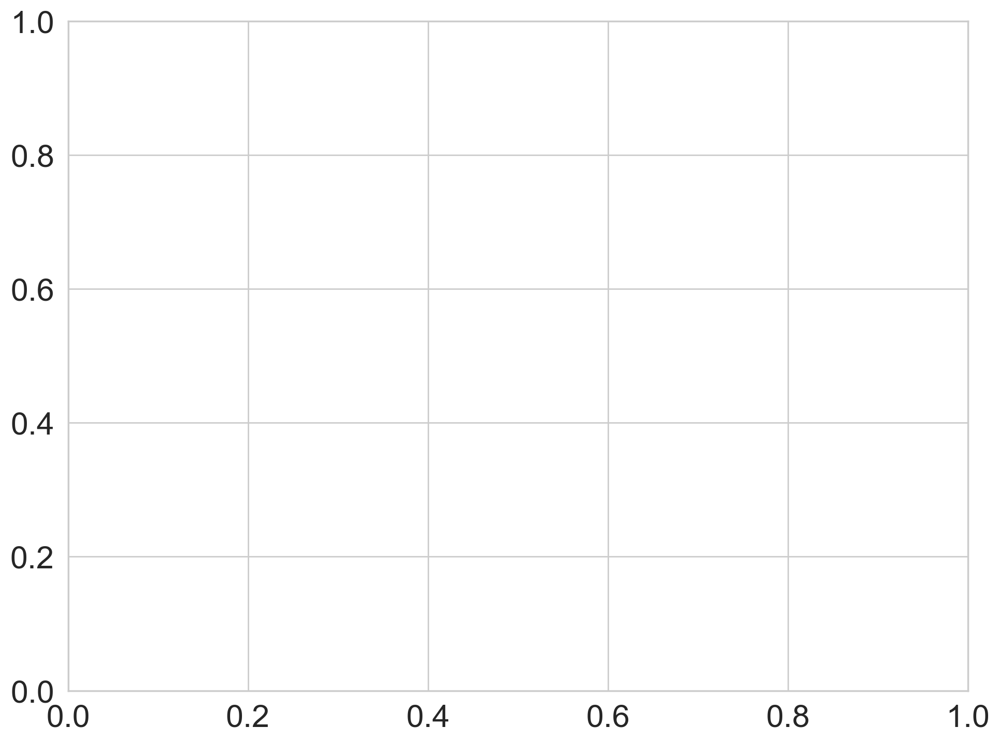

In [ ]:
sns.distplot(clean_df)

In [ ]:
clean_df.shape

(24237, 354)

In [ ]:
 # Now lets save the cleaned prescribers information to Csv for further work in notebook 1.3.
clean_df.to_csv('./inputs/prescribers_clean929.csv')

# Feature Selection and  Visualization

<Axes: xlabel='Specialty'>

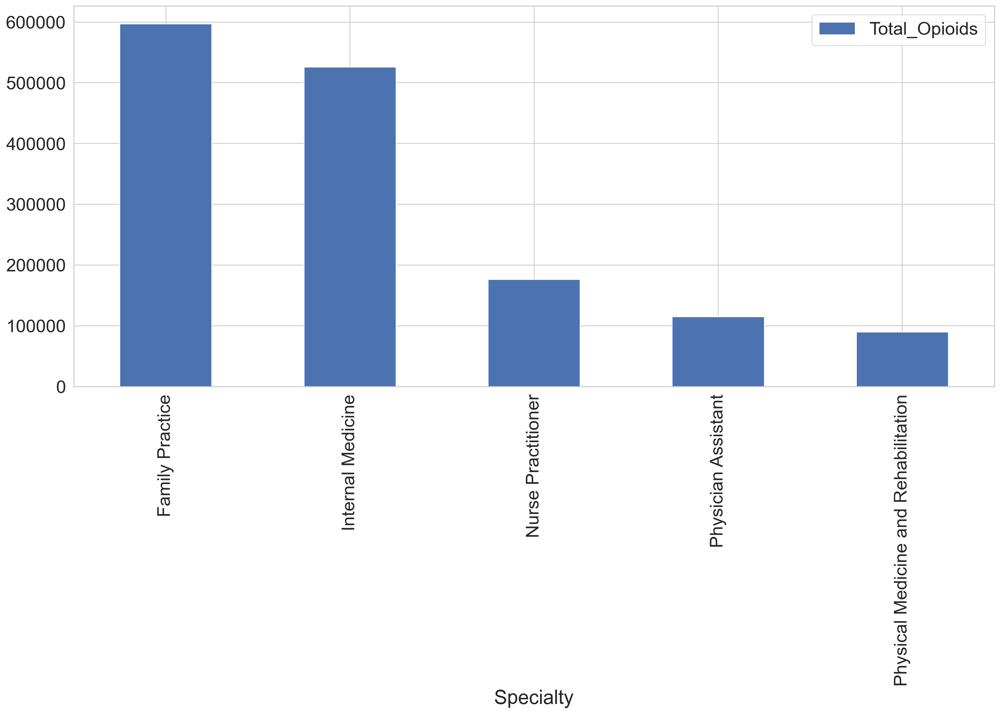

In [ ]:
import matplotlib.pyplot as plt
# here i am going to create sub dataframe from the main one through bradcasting and slicing
# that will help me to plot the  speciality verses the total opiods which is total or aggregate of all opiods
# prescribed by the same speciality horizontally no matter the type of medication he prescribed
# the sense here is i am using the official classification of opiods by FDA

OpioidsPerSpecialty = df[['Specialty','Total_Opioids']]
OpioidsPerSpecialty_group = OpioidsPerSpecialty.groupby('Specialty')
OpioidsPerSpecialty_totals = pd.DataFrame(OpioidsPerSpecialty_group.sum())

# previously in the data cleaning as well as pre processing i have created the total opiods
OpioidsPerSpecialty_totals=OpioidsPerSpecialty_totals.sort_values('Total_Opioids', ascending=False)

OpioidsPerSpecialty_totals.head()[:5].plot(kind='bar',figsize =(18,8))
#Plotting a bar plot of total opioids prescribed by those licensed and have AED vs
# the total Speciality of the prescriber those licensed and have AED

In [ ]:
Overdoses=pd.read_csv('./inputs/extra_overdoses.csv',index_col=0, parse_dates=True)

#Read the csv file that contains the overdose information, these are the

/var/folders/b7/cx8d0sxx3zqdm7j6rd9fl51c0000gn/T/ipykernel_906/65805493.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  Overdoses=pd.read_csv('./inputs/extra_overdoses.csv',index_col=0, parse_dates=True)


In [ ]:
OverdosesPerState=Overdoses[['Deaths']]
OverdosesPerState.sort_values('Deaths', ascending=False)

type(OverdosesPerState.iloc[2,0])

#sort the dataframe based on the number of deaths per State

str

In [ ]:
OverdosesPerState['Deaths']= OverdosesPerState['Deaths'].astype(str)   # removing punctuation
OverdosesPerState['Deaths']= OverdosesPerState['Deaths'].str.replace(',', '')    # converting to integer
OverdosesPerState['Deaths'] = OverdosesPerState['Deaths'].astype(int)
OverdosesPerState=OverdosesPerState.sort_values('Deaths', ascending=False)   # sorting
OverdosesPerState

#Removing the punctuation and converting the 'Deaths' column values from a string data type to integer
# sorting then  and

,Deaths
State,
California,4521
Ohio,2744
Pennsylvania,2732
Florida,2634
Texas,2601
New York,2300
Michigan,1762
Illinois,1705
North Carolina,1358


<Axes: xlabel='State'>

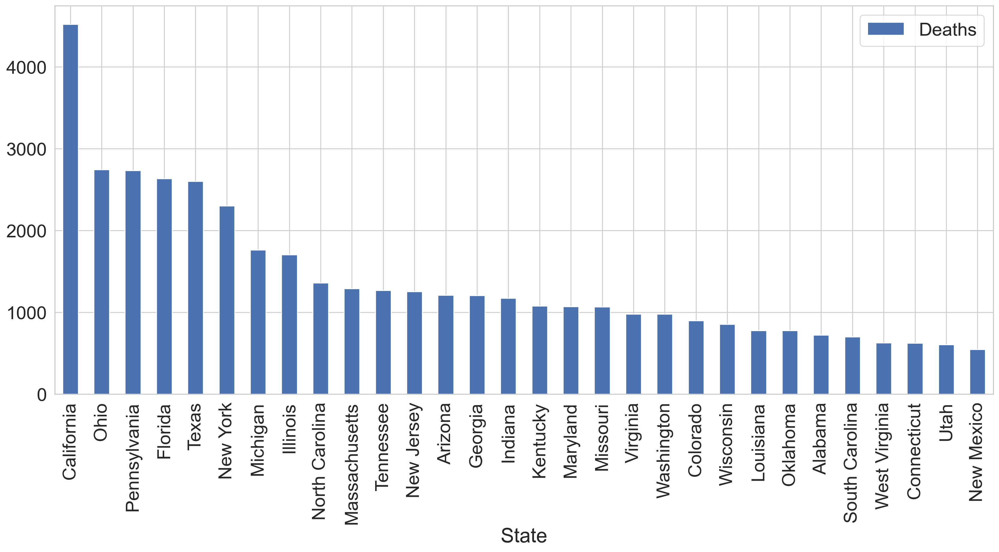

In [ ]:
OverdosesPerState.head(30).plot(kind='bar', figsize =(18,8))
#Plotting the number of deaths per State  the top  30 ones  based on the aggregated overdose data by speciality

<Axes: xlabel='State'>

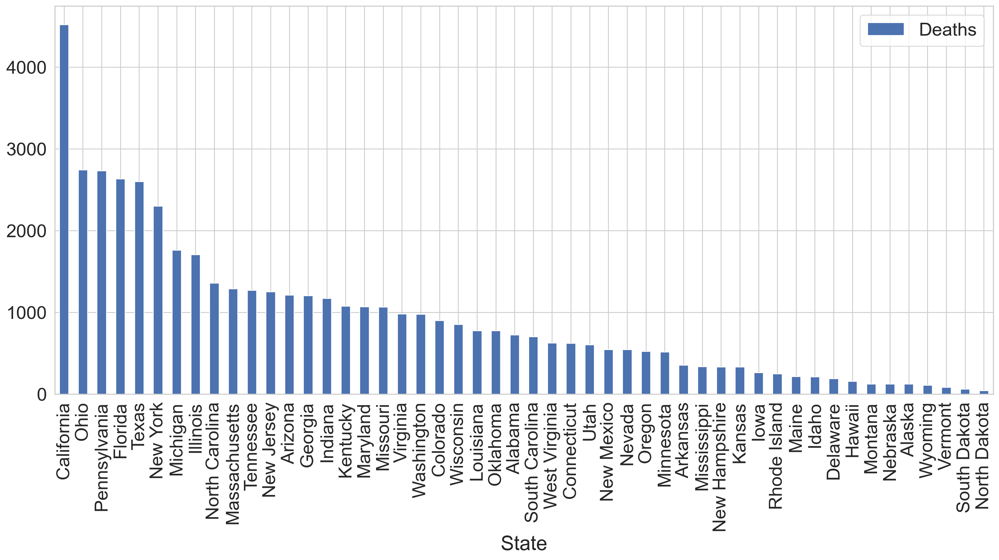

In [ ]:
OverdosesPerState.head(52).plot(kind='bar',figsize=(18,8))

#Plotting the number of deaths per State

<Axes: xlabel='State'>

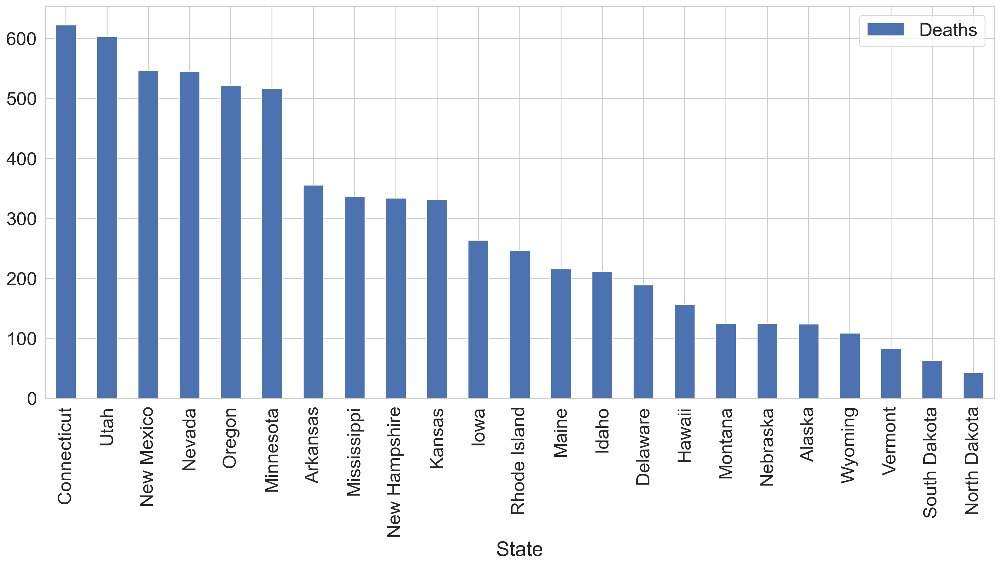

In [ ]:
OverdosesPerState.tail(23).plot(kind='bar', figsize =(18,8))

#Plotting the number of deaths per State

<Axes: ylabel='State'>

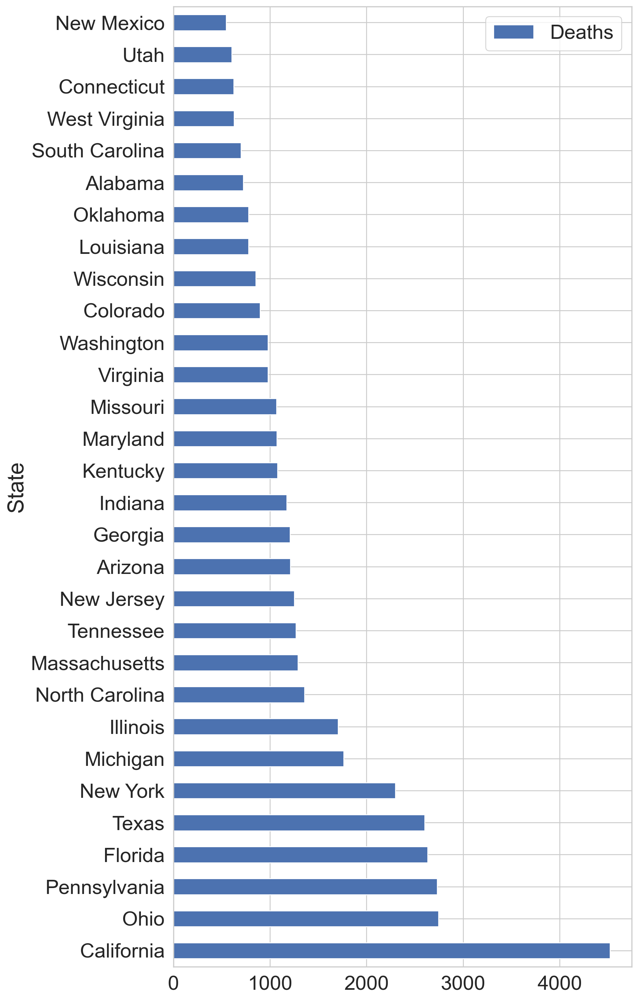

In [ ]:
OverdosesPerState.head(30).plot(kind='barh', figsize =(8,18))

#Plotting the number of deaths per State  the top  30 ones  based on the aggregated overdose data by speciality

<Axes: ylabel='State'>

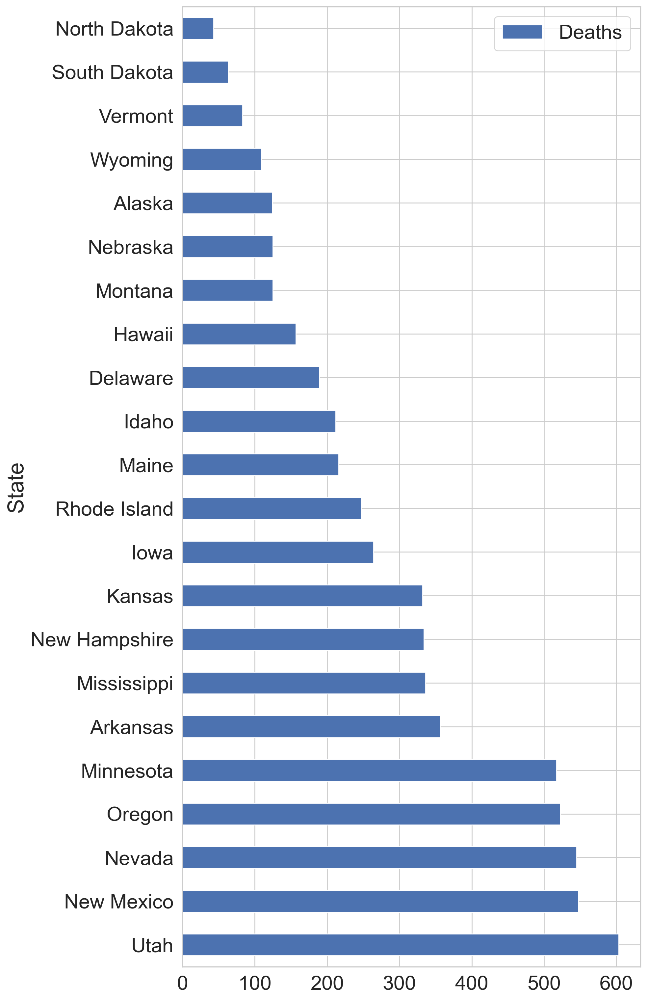

In [ ]:
OverdosesPerState.tail(n=22).plot(kind='barh', figsize =(8,18))

#Plotting the number of deaths per State

In [ ]:
prescriber_df= pd.read_csv('./inputs/cleaned_prescriber_info18.csv')

/var/folders/b7/cx8d0sxx3zqdm7j6rd9fl51c0000gn/T/ipykernel_906/666060097.py:1: DtypeWarning: Columns (5,6) have mixed types. Specify dtype option on import or set low_memory=False.
  prescriber_df= pd.read_csv('./inputs/cleaned_prescriber_info18.csv')


In [ ]:
# Step 1: Select only numeric columns from the DataFrame
numeric_prescriber_df = prescriber_df.select_dtypes(include='number')

# Step 2: Compute the correlation matrix
corr_matrix = numeric_prescriber_df.corr()

# Step 3: Print the correlation matrix
print(corr_matrix)


                              NPI  NPPES Provider ZIP Code  Totalclaimcount  \
NPI                      1.000000                 0.010386         0.000312   
NPPES Provider ZIP Code  0.010386                 1.000000        -0.029740   
Totalclaimcount          0.000312                -0.029740         1.000000   
OpioidClaimCount         0.003864                 0.018241         0.538760   
ACETAMINOPHEN.CODEINE   -0.003336                 0.025442         0.275923   
...                           ...                      ...              ...   
ZOLPIDEM.TARTRATE        0.001170                -0.022397         0.634844   
avg_op_supply            0.007485                -0.045951         0.275412   
op_longer               -0.001866                 0.057650         0.251118   
Opioid_Prescriber        0.004880                 0.057534        -0.028262   
op_prescriber           -0.002491                 0.057534         0.250961   

                         OpioidClaimCount  ACETAMIN

In [ ]:
# Let's look at how much each attribute correlates with the Specialty
corr_matrix['Opioid_Prescriber'].sort_values(ascending = False)[:5]

op_prescriber        1.000000
Opioid_Prescriber    1.000000
op_longer            0.999629
AMIODARONE.HCL       0.824392
CLONIDINE.HCL        0.688787
Name: Opioid_Prescriber, dtype: float64

In [ ]:
prescriber_df.columns

Index(['NPI', 'Gender', 'State', 'Credentials', 'Specialty',
       'NPPES Provider Last Name', 'NPPES Provider First Name',
       'NPPES Provider ZIP Code', 'NPPES Provider State', 'Totalclaimcount',
       ...
       'VYTORIN', 'WARFARIN.SODIUM', 'XARELTO', 'ZETIA', 'ZIPRASIDONE.HCL',
       'ZOLPIDEM.TARTRATE', 'avg_op_supply', 'op_longer', 'Opioid_Prescriber',
       'op_prescriber'],
      dtype='object', length=264)

In [ ]:
prescriber_df.head()[:2]

,NPI,Gender,State,Credentials,Specialty,NPPES Provider Last Name,NPPES Provider First Name,NPPES Provider ZIP Code,NPPES Provider State,Totalclaimcount,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
0,1003002320,M,MS,D.M.D. P.A.,Dentist,EKLUND,D.,39208.0,MS,129,...,0,0,0,0,0,0,4.5,1.0,1,1.0
1,1003004771,F,CO,M.D.,Pulmonary Disease,RIGGLE,ERIN,80120.0,CO,537,...,0,0,16,0,0,0,4.5,0.0,0,0.0


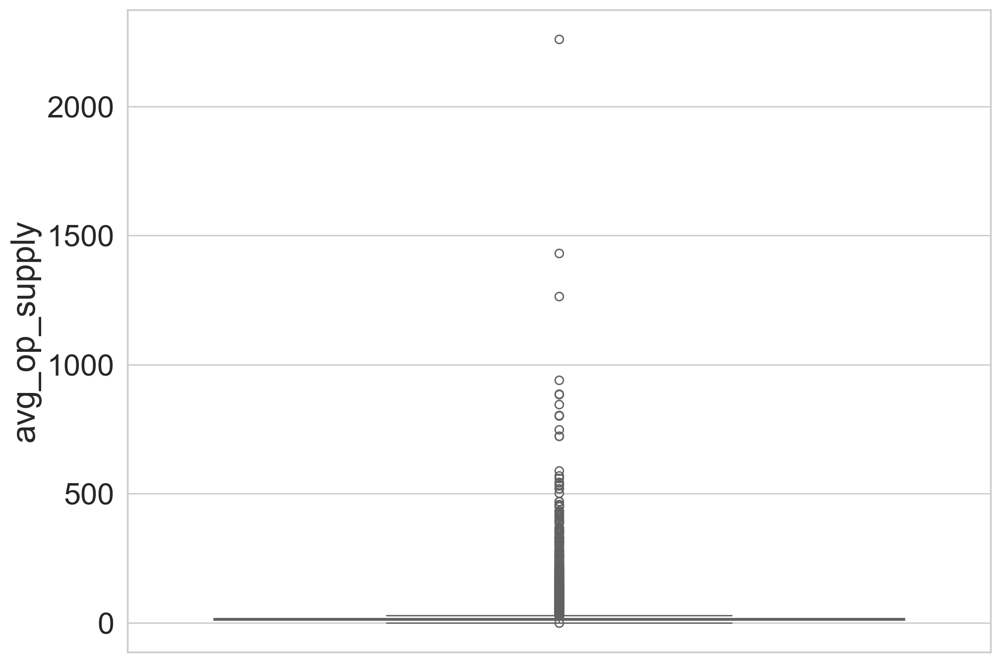

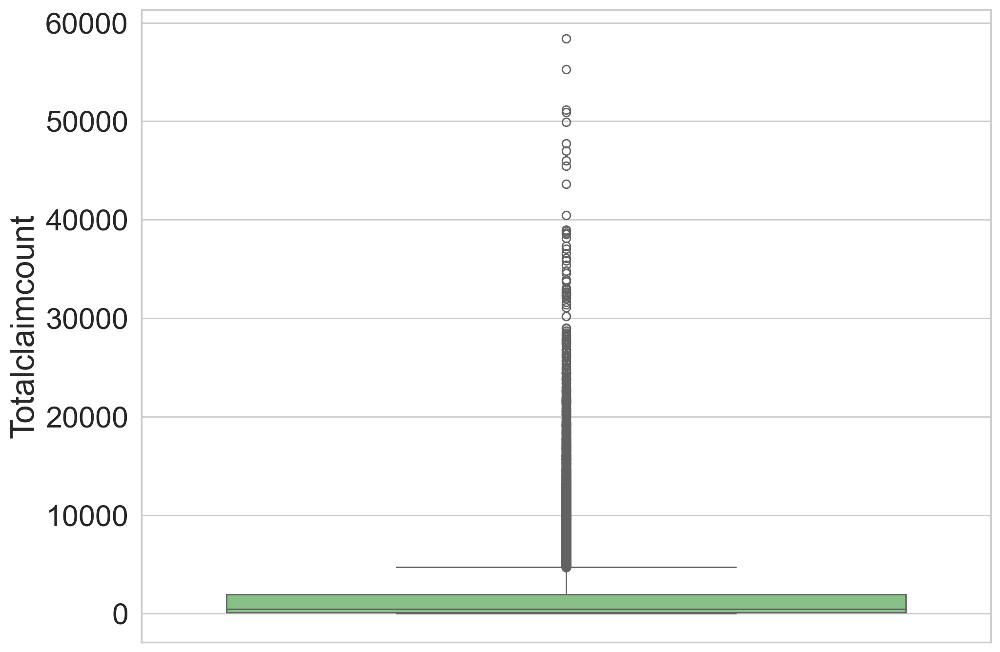

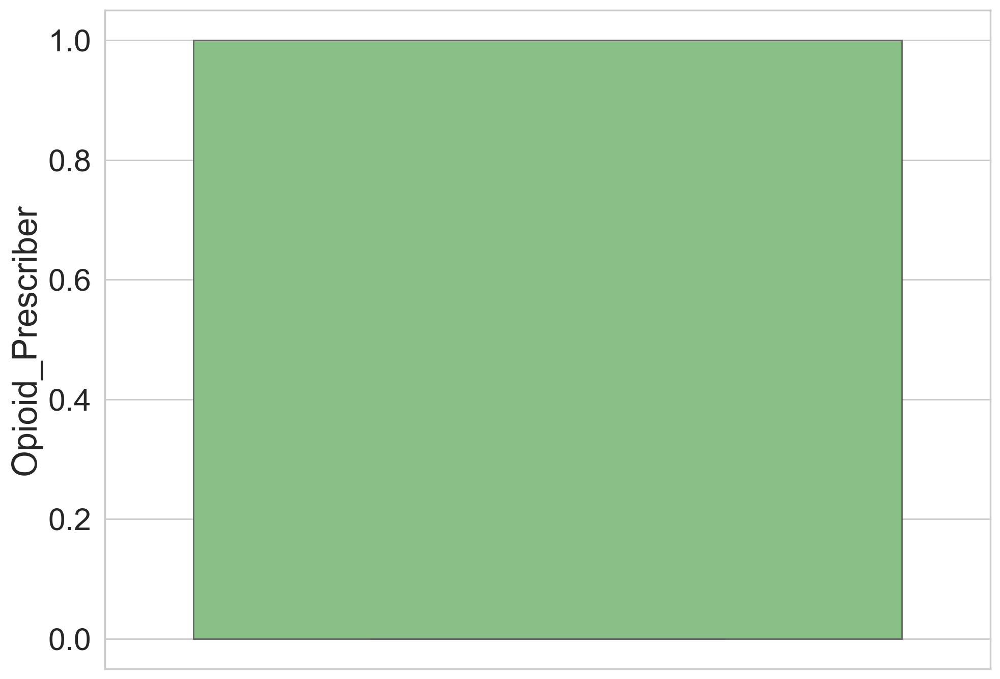

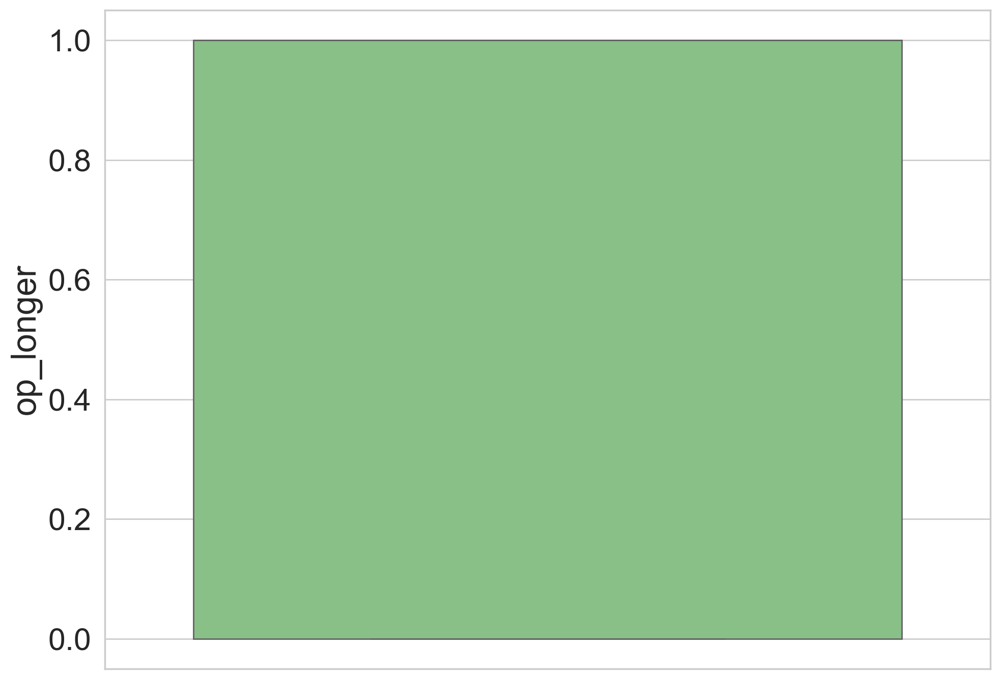

In [ ]:
sns.set_palette("Accent")

attrib_list = ['avg_op_supply','Totalclaimcount', 'Opioid_Prescriber', 'op_longer']

for attrib in attrib_list:
    plt.figure()
    sns.boxplot( y = attrib, data = prescriber_df.dropna())

In [ ]:
prescriber_df['Specialty'].value_counts(normalize=True)[:5]

Specialty
Internal Medicine      0.13524
Family Practice        0.12820
Dentist                0.11732
Nurse Practitioner     0.10372
Physician Assistant    0.07688
Name: proportion, dtype: float64

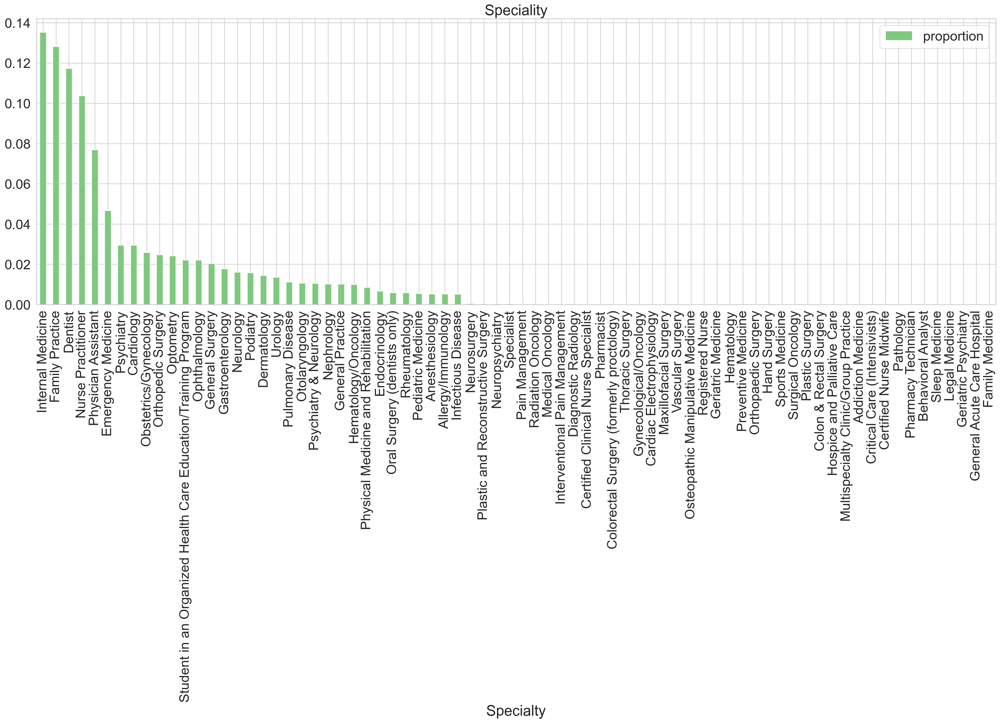

In [ ]:
# set fig size
fig,ax =plt.subplots(figsize=(25,8))
prescriber_df['Specialty'].value_counts(normalize=True).plot(kind ='bar',ax=ax)
plt.title('Speciality')
plt.legend(loc ='upper right')

In [ ]:
# Step 1: Select only numeric columns from prescriber_df
numeric_df = prescriber_df.select_dtypes(include='number')

# Step 2: Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# Step 3: Get correlation with 'Opioid_Prescriber', apply abs, and sort
correlation_with_target = corr_matrix[['Opioid_Prescriber']].apply(abs).sort_values('Opioid_Prescriber', ascending=False)

# Step 4: Display the result
print(correlation_with_target)


                       Opioid_Prescriber
op_prescriber                   1.000000
Opioid_Prescriber               1.000000
op_longer                       0.999629
AMIODARONE.HCL                  0.824392
CLONIDINE.HCL                   0.688787
...                                  ...
CIPROFLOXACIN.HCL               0.001523
DIOVAN                          0.001266
FENOFIBRATE                     0.001244
CELEBREX                        0.001056
CLOBETASOL.PROPIONATE           0.000018

[257 rows x 1 columns]


In [ ]:
prescriber_df.head()[:2]

,NPI,Gender,State,Credentials,Specialty,NPPES Provider Last Name,NPPES Provider First Name,NPPES Provider ZIP Code,NPPES Provider State,Totalclaimcount,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
0,1003002320,M,MS,D.M.D. P.A.,Dentist,EKLUND,D.,39208.0,MS,129,...,0,0,0,0,0,0,4.5,1.0,1,1.0
1,1003004771,F,CO,M.D.,Pulmonary Disease,RIGGLE,ERIN,80120.0,CO,537,...,0,0,16,0,0,0,4.5,0.0,0,0.0


In [ ]:
prescriber_df.head()[:2]   #  prints or gives the specified amount of rows here the first two rows.

,NPI,Gender,State,Credentials,Specialty,NPPES Provider Last Name,NPPES Provider First Name,NPPES Provider ZIP Code,NPPES Provider State,Totalclaimcount,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
0,1003002320,M,MS,D.M.D. P.A.,Dentist,EKLUND,D.,39208.0,MS,129,...,0,0,0,0,0,0,4.5,1.0,1,1.0
1,1003004771,F,CO,M.D.,Pulmonary Disease,RIGGLE,ERIN,80120.0,CO,537,...,0,0,16,0,0,0,4.5,0.0,0,0.0


In [ ]:
tmp =prescriber_df['Specialty'].value_counts()  # useful for categorical variables but also  used numerical variables
misc_spec =tmp[tmp<100].index   # here i am indexing to get the speciality who have prescriptions less than 100

In [ ]:
misc_spec

Index(['Neurosurgery', 'Plastic and Reconstructive Surgery', 'Neuropsychiatry',
       'Specialist', 'Pain Management', 'Radiation Oncology',
       'Medical Oncology', 'Interventional Pain Management',
       'Diagnostic Radiology', 'Certified Clinical Nurse Specialist',
       'Pharmacist', 'Colorectal Surgery (formerly proctology)',
       'Thoracic Surgery', 'Gynecological/Oncology',
       'Cardiac Electrophysiology', 'Maxillofacial Surgery',
       'Vascular Surgery', 'Osteopathic Manipulative Medicine',
       'Registered Nurse', 'Geriatric Medicine', 'Hematology',
       'Preventive Medicine', 'Orthopaedic Surgery', 'Hand Surgery',
       'Sports Medicine', 'Surgical Oncology', 'Plastic Surgery',
       'Colon & Rectal Surgery', 'Hospice and Palliative Care',
       'Multispecialty Clinic/Group Practice', 'Addiction Medicine',
       'Critical Care (Intensivists)', 'Certified Nurse Midwife', 'Pathology',
       'Pharmacy Technician', 'Behavioral Analyst', 'Sleep Medicine',
    

In [ ]:
prescriber_df.describe()[:5]  #  this gives the statistics summary of the numerical values of the DF

,NPI,NPPES Provider ZIP Code,Totalclaimcount,OpioidClaimCount,ACETAMINOPHEN.CODEINE,ACYCLOVIR,ADVAIR.DISKUS,AGGRENOX,ALENDRONATE.SODIUM,ALLOPURINOL,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
count,2.500000e+04,22390.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,...,25000.000000,25000.000000,25000.00000,25000.000000,25000.000000,25000.000000,22390.000000,22390.000000,25000.000000,22390.000000
mean,1.497815e+09,48156.120232,1698.879960,80.216440,2.539120,1.169320,6.938680,1.333360,8.763960,9.957560,...,1.030800,18.253280,4.92088,4.308920,1.428480,11.148480,23.306757,0.595400,1.721560,0.595578
std,2.879339e+08,30003.420351,3512.928148,264.465556,12.504745,6.805065,25.619397,9.105226,36.012932,30.567146,...,8.167705,81.237655,24.69952,19.147394,11.375485,36.323232,41.877051,0.490825,15.200218,0.490791
min,1.003002e+09,601.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.245430e+09,22031.500000,75.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,11.200000,0.000000,0.000000,0.000000


In [ ]:
prescriber_df.columns   # checking the column names and in pandas they are the indexs

Index(['NPI', 'Gender', 'State', 'Credentials', 'Specialty',
       'NPPES Provider Last Name', 'NPPES Provider First Name',
       'NPPES Provider ZIP Code', 'NPPES Provider State', 'Totalclaimcount',
       ...
       'VYTORIN', 'WARFARIN.SODIUM', 'XARELTO', 'ZETIA', 'ZIPRASIDONE.HCL',
       'ZOLPIDEM.TARTRATE', 'avg_op_supply', 'op_longer', 'Opioid_Prescriber',
       'op_prescriber'],
      dtype='object', length=264)

In [ ]:
prescriber_df.dtypes  #  this gives the data types of each column

NPI                    int64
Gender                object
State                 object
Credentials           object
Specialty             object
                      ...   
ZOLPIDEM.TARTRATE      int64
avg_op_supply        float64
op_longer            float64
Opioid_Prescriber      int64
op_prescriber        float64
Length: 264, dtype: object

In [ ]:
tmp = prescriber_df.Specialty.value_counts()  # here i am creating a temporary grouping by indexing the miscelaneous spec
misc_spec = tmp[ tmp < 100 ].index
prescriber_df = prescriber_df[ ~prescriber_df['Specialty'].isin(misc_spec) ]

In [ ]:
tmp = prescriber_df['avg_op_supply'].groupby(prescriber_df['Specialty']).describe().unstack()
prescriber_df = prescriber_df.loc[~prescriber_df['Specialty'].isin(tmp), :]
grouped_speciality = prescriber_df['avg_op_supply'].groupby(prescriber_df['Specialty'])
grouped_speciality_mean = grouped_speciality.mean().sort_values(ascending=False)
top20 = grouped_speciality_mean.index[:20]
top40 = grouped_speciality_mean.index[:40]
top60 = grouped_speciality_mean.index[:60]
top80 = grouped_speciality_mean.index[:80]
top119 = grouped_speciality_mean.index[:119]
top200 = grouped_speciality_mean.index[:200]
# the group by method is commonly used for aggregation in pandas, therefore the sequence of
# many inputs here the specaility i want to summarize them in a way that can be useful to conceptualize and
# see the generalized view by state, county or location as we can see latter on the tableau or 1.6 of the notebook.
# The pandas dataframe only allows the aggregation of values with string names will be passed to aggregate
# as scalar, just value to the aggregate method. The group by Method can be passed with multiple columns at once
# but for simplicity i choose to aggregate based on speciality that are top prescribers of opiods.
#  then i index them instead of taking the multi-indexing of pandas as it would be so much difficult to
# navigate with multiindexed column or row, why because  it will create additional columns
# which are confusing with the main features or attributes i need, as far as i know it.

In [ ]:
prescriber_df['avg_op_supply'].groupby(prescriber_df['Specialty']).describe()
# here grouping by speciality to get the average supply of opiods per speciality and then i use the
# `.describe` to describe all the numeric values and if interested to see the categorical non numeric values
# the .describe(include=['Objects']) which describes all object columns or
# .describe(include ="all"), which describes all columns can be applied, but here i am much more interested on the
# numeric values and i used .describe() after i group them and genarated the folloing results.

,count,mean,std,min,25%,50%,75%,max
Specialty,,,,,,,,
Allergy/Immunology,118.0,20.542373,16.718864,7.4,18.000,18.00,18.000,140.6
Anesthesiology,114.0,7.355263,8.772302,1.1,1.600,2.20,18.000,50.4
Cardiology,672.0,49.929018,123.737263,1.0,18.000,18.00,18.300,1432.3
Dentist,2619.0,13.196525,6.710951,1.0,5.300,18.00,18.000,72.9
Dermatology,337.0,19.124926,13.223006,3.2,18.000,18.00,18.000,165.3
Emergency Medicine,1045.0,10.003158,70.558005,0.0,3.700,4.60,7.500,2260.4
Endocrinology,152.0,44.183553,74.405053,1.9,18.000,18.00,18.300,431.4
Family Practice,2882.0,30.044656,32.800588,1.0,16.000,19.70,33.400,723.6
Gastroenterology,390.0,30.300000,35.700562,1.0,18.000,18.00,18.300,293.0


In [ ]:
prescriber_df['avg_op_supply'].groupby(prescriber_df['Specialty']).describe().T[:5]

Specialty,Allergy/Immunology,Anesthesiology,Cardiology,Dentist,Dermatology,Emergency Medicine,Endocrinology,Family Practice,Gastroenterology,General Practice,...,Pediatric Medicine,Physical Medicine and Rehabilitation,Physician Assistant,Podiatry,Psychiatry,Psychiatry & Neurology,Pulmonary Disease,Rheumatology,Student in an Organized Health Care Education/Training Program,Urology
count,118.000000,114.000000,672.000000,2619.000000,337.000000,1045.000000,152.000000,2882.000000,390.000000,230.000000,...,120.000000,189.000000,1739.000000,359.000000,651.000000,233.000000,255.000000,126.000000,489.000000,313.000000
mean,20.542373,7.355263,49.929018,13.196525,19.124926,10.003158,44.183553,30.044656,30.300000,36.403913,...,17.692500,6.917460,18.192352,13.322841,26.236406,19.627039,31.404314,19.403968,17.322699,32.984984
std,16.718864,8.772302,123.737263,6.710951,13.223006,70.558005,74.405053,32.800588,35.700562,42.012853,...,9.830164,7.989212,29.082014,10.921468,56.425299,14.527863,40.507512,19.235527,11.422598,31.721057
min,7.400000,1.100000,1.000000,1.000000,3.200000,0.000000,1.900000,1.000000,1.000000,1.000000,...,2.100000,1.300000,1.000000,1.200000,1.000000,3.400000,1.000000,3.500000,1.100000,1.800000
25%,18.000000,1.600000,18.000000,5.300000,18.000000,3.700000,18.000000,16.000000,18.000000,18.000000,...,18.000000,2.100000,4.500000,6.100000,18.000000,18.000000,18.000000,9.525000,12.100000,18.000000


In [ ]:
grouped_speciality = prescriber_df['avg_op_supply'].groupby(prescriber_df['Specialty'])
grouped_speciality.head()[:2]

0    4.5
1    4.5
Name: avg_op_supply, dtype: float64

In [ ]:
grouped_speciality_mean = grouped_speciality.mean().sort_values(ascending=False)
top20 = grouped_speciality_mean.index[:20]
top40 = grouped_speciality_mean.index[:40]
top80 = grouped_speciality_mean.index[:80]
top119 = grouped_speciality_mean.index[:119]
top200 = grouped_speciality_mean.index[:200]

In [ ]:
top20


Index(['Cardiology', 'Nephrology', 'Endocrinology', 'Neurology',
       'General Practice', 'Internal Medicine', 'Urology', 'Pulmonary Disease',
       'Gastroenterology', 'Family Practice', 'Infectious Disease',
       'Psychiatry', 'Nurse Practitioner', 'Ophthalmology',
       'Allergy/Immunology', 'Otolaryngology', 'Psychiatry & Neurology',
       'Rheumatology', 'Dermatology', 'Obstetrics/Gynecology'],
      dtype='object', name='Specialty')

In [ ]:
top40

Index(['Cardiology', 'Nephrology', 'Endocrinology', 'Neurology',
       'General Practice', 'Internal Medicine', 'Urology', 'Pulmonary Disease',
       'Gastroenterology', 'Family Practice', 'Infectious Disease',
       'Psychiatry', 'Nurse Practitioner', 'Ophthalmology',
       'Allergy/Immunology', 'Otolaryngology', 'Psychiatry & Neurology',
       'Rheumatology', 'Dermatology', 'Obstetrics/Gynecology',
       'Physician Assistant', 'Pediatric Medicine',
       'Student in an Organized Health Care Education/Training Program',
       'Optometry', 'Hematology/Oncology', 'Podiatry', 'Dentist',
       'Emergency Medicine', 'Anesthesiology', 'General Surgery',
       'Physical Medicine and Rehabilitation', 'Oral Surgery (dentists only)',
       'Orthopedic Surgery'],
      dtype='object', name='Specialty')

In [ ]:
top119

Index(['Cardiology', 'Nephrology', 'Endocrinology', 'Neurology',
       'General Practice', 'Internal Medicine', 'Urology', 'Pulmonary Disease',
       'Gastroenterology', 'Family Practice', 'Infectious Disease',
       'Psychiatry', 'Nurse Practitioner', 'Ophthalmology',
       'Allergy/Immunology', 'Otolaryngology', 'Psychiatry & Neurology',
       'Rheumatology', 'Dermatology', 'Obstetrics/Gynecology',
       'Physician Assistant', 'Pediatric Medicine',
       'Student in an Organized Health Care Education/Training Program',
       'Optometry', 'Hematology/Oncology', 'Podiatry', 'Dentist',
       'Emergency Medicine', 'Anesthesiology', 'General Surgery',
       'Physical Medicine and Rehabilitation', 'Oral Surgery (dentists only)',
       'Orthopedic Surgery'],
      dtype='object', name='Specialty')

Specialty
Allergy/Immunology                                                Axes(0.08,0.07;0.87x0.81)
Anesthesiology                                                    Axes(0.08,0.07;0.87x0.81)
Cardiology                                                        Axes(0.08,0.07;0.87x0.81)
Dentist                                                           Axes(0.08,0.07;0.87x0.81)
Dermatology                                                       Axes(0.08,0.07;0.87x0.81)
Emergency Medicine                                                Axes(0.08,0.07;0.87x0.81)
Endocrinology                                                     Axes(0.08,0.07;0.87x0.81)
Family Practice                                                   Axes(0.08,0.07;0.87x0.81)
Gastroenterology                                                  Axes(0.08,0.07;0.87x0.81)
General Practice                                                  Axes(0.08,0.07;0.87x0.81)
General Surgery                                                   Axes

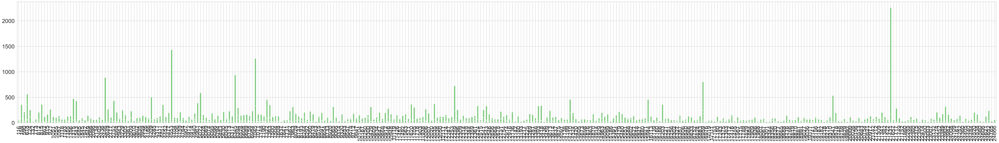

In [ ]:
tmp = prescriber_df['avg_op_supply'].groupby(prescriber_df['Specialty'])
tmp.plot(kind ='bar',figsize =(60,8))

/var/folders/b7/cx8d0sxx3zqdm7j6rd9fl51c0000gn/T/ipykernel_906/3887195363.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(prescriber_df['Totalclaimcount'])
/var/folders/b7/cx8d0sxx3zqdm7j6rd9fl51c0000gn/T/ipykernel_906/3887195363.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(prescriber

<Axes: xlabel='OpioidClaimCount', ylabel='Density'>

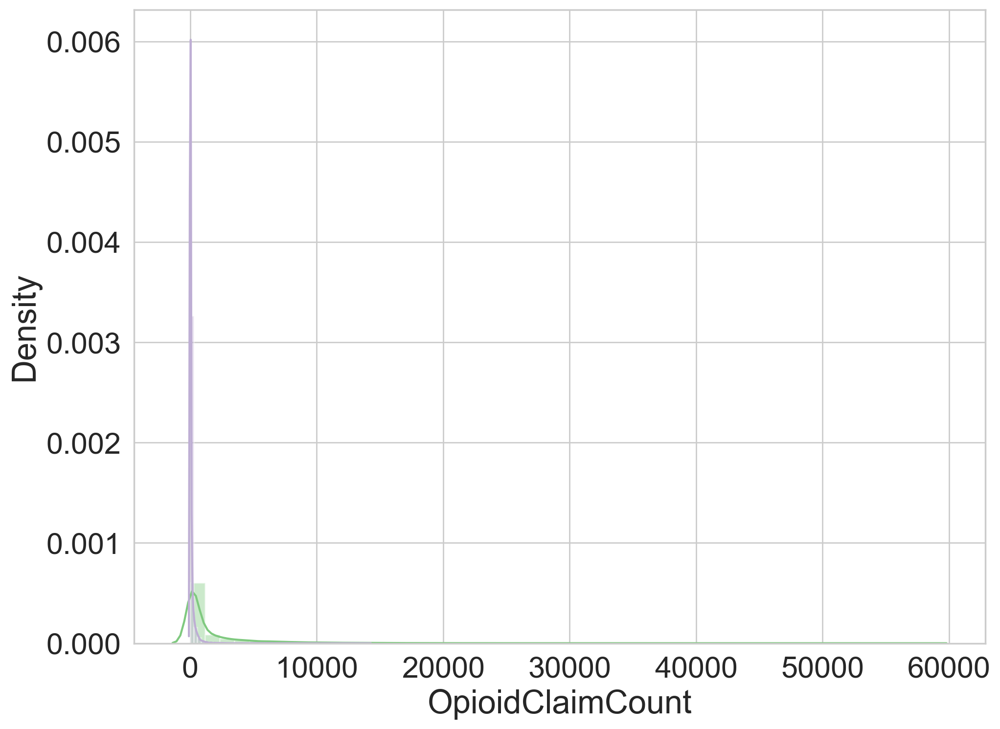

In [ ]:
import seaborn  as  sns
sns.distplot(prescriber_df['Totalclaimcount'])
sns.distplot(prescriber_df['OpioidClaimCount'])

In [ ]:
total_spec = prescriber_df['avg_op_supply'].groupby(prescriber_df['Specialty']).sum().sort_values(ascending=False)
#total_spec / total_spec.sum()

In [ ]:
total_spec.head()[:5]

Specialty
Internal Medicine     101824.1
Family Practice        86588.7
Nurse Practitioner     53721.7
Dentist                34561.7
Cardiology             33552.3
Name: avg_op_supply, dtype: float64

In [ ]:
prescriber_df.boxplot('avg_op_supply', by='Specialty',figsize= (180,18))
# Here the box plot is selected to show the average supply variability by speciality

<Axes: title={'center': 'avg_op_supply'}, xlabel='Specialty'>

#### Plotting interactive visual using plotly

The box plot was chosed to show the top prescriber-specialists of the opiod drugs absed on the professional category and it turns out that the $cardiology$ (`diseases and abnormalities of the heart.`) specialists have the highest variability, followed by $Endocrinology$(`the branch of physiology and medicine concerned with endocrine glands and hormones`),$psychiatry$(`the study and treatment of mental illness, emotional disturbance, and abnormal behavior.`), $Nephrology$(`the branch of medicine that deals with the physiology and diseases of the kidneys.`) and $pulmonary disease $(`chronic obstructive pulmonary disease. : pulmonary disease (such as emphysema or chronic bronchitis) that is characterized by chronic typically irreversible airway obstruction resulting in a slowed rate of exhalation —abbreviation COPD`).

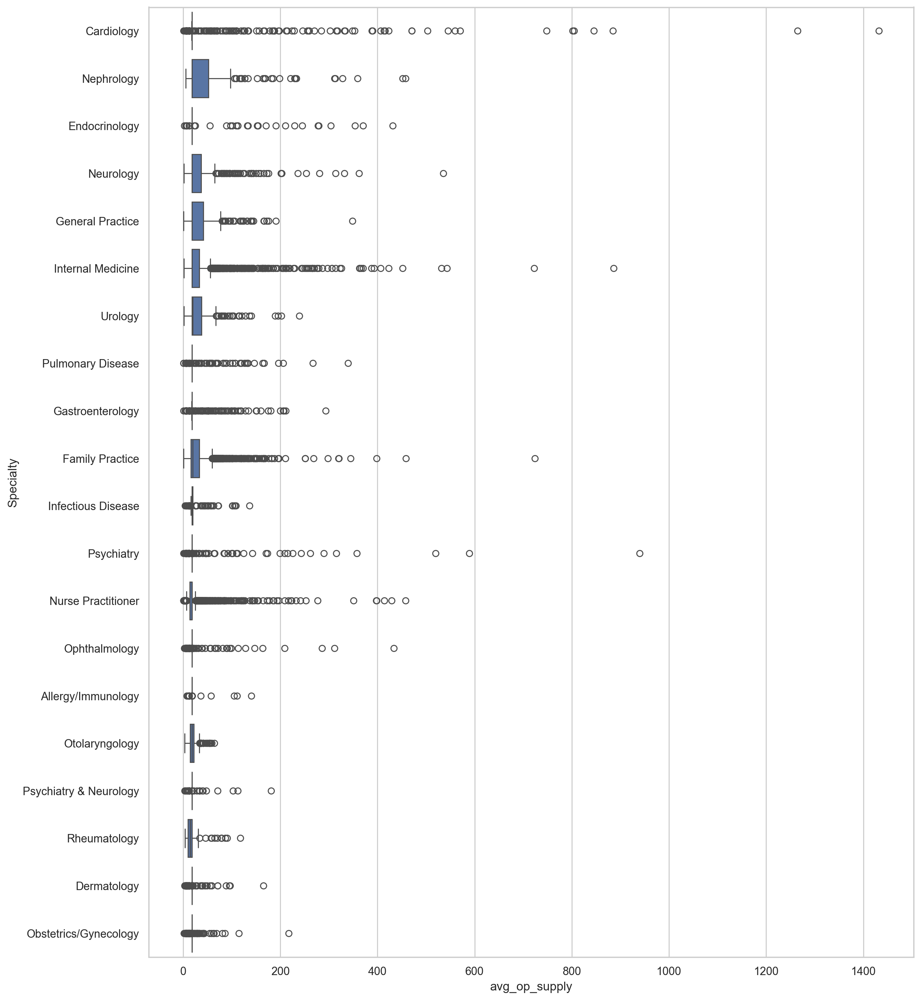

In [ ]:
sns.set(style='whitegrid', rc={"figure.figsize": (12, 16)})
df_short = prescriber_df.loc[:, ['Specialty', 'avg_op_supply']]
df_short = df_short.loc[prescriber_df['Specialty'].isin(top20), :]
sns.boxplot(data=df_short, y='Specialty', x='avg_op_supply', order=top20)
plt.show()

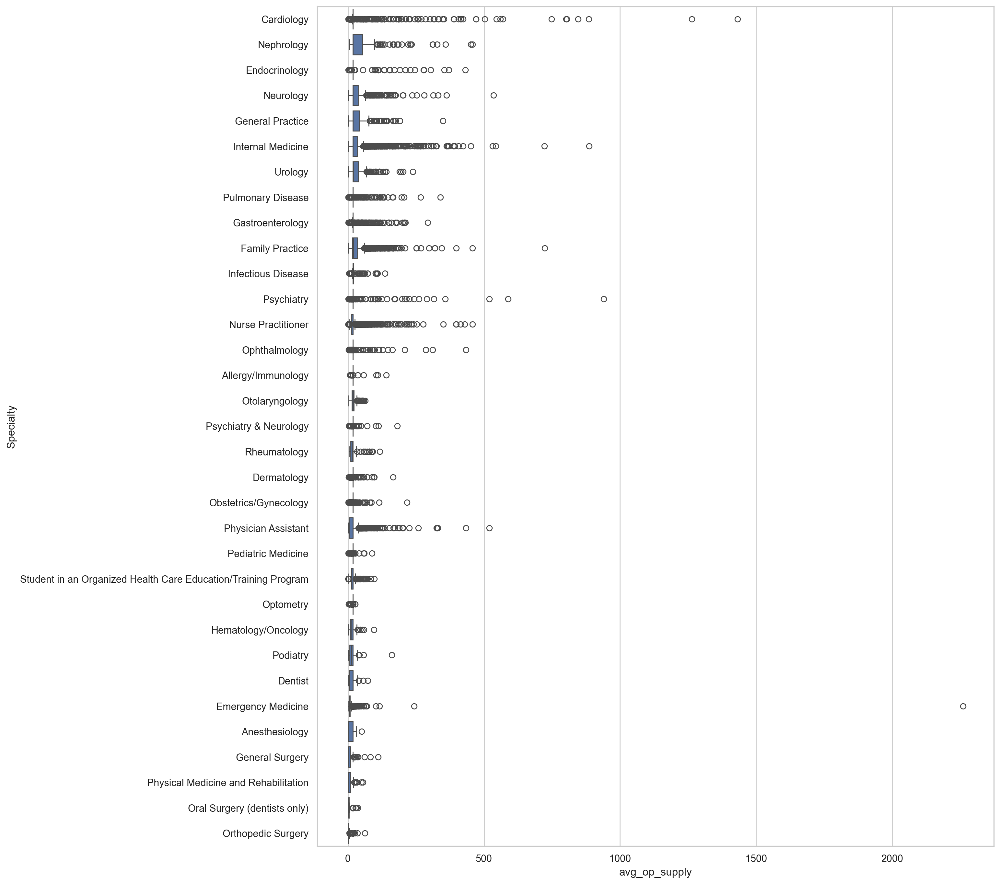

In [ ]:
sns.set(style='whitegrid', rc={"figure.figsize": (12, 16)})
df_short = prescriber_df.loc[:, ['Specialty', 'avg_op_supply']]
df_short = df_short.loc[prescriber_df['Specialty'].isin(top40), :]
sns.boxplot(data=df_short, y='Specialty', x='avg_op_supply', order=top40)
plt.show()

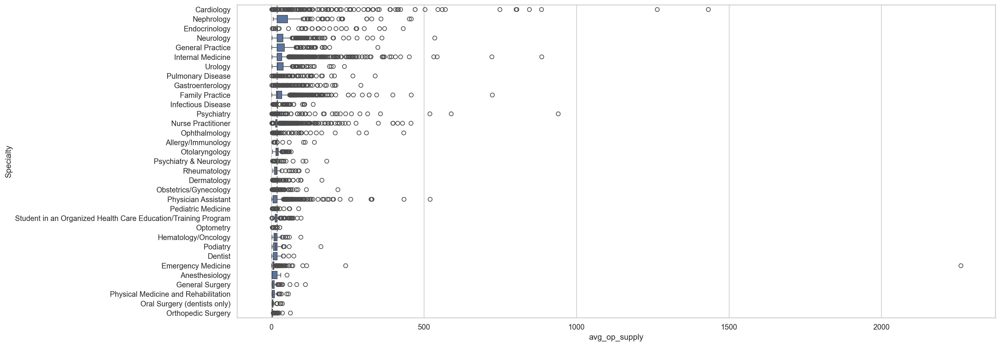

In [ ]:
sns.set(style='whitegrid', rc={"figure.figsize": (18, 8)})
df_short = prescriber_df.loc[:, ['Specialty', 'avg_op_supply']]
df_short = df_short.loc[prescriber_df['Specialty'].isin(top80), :]
sns.boxplot(data=df_short, y='Specialty', x='avg_op_supply', order=top80)
plt.show()

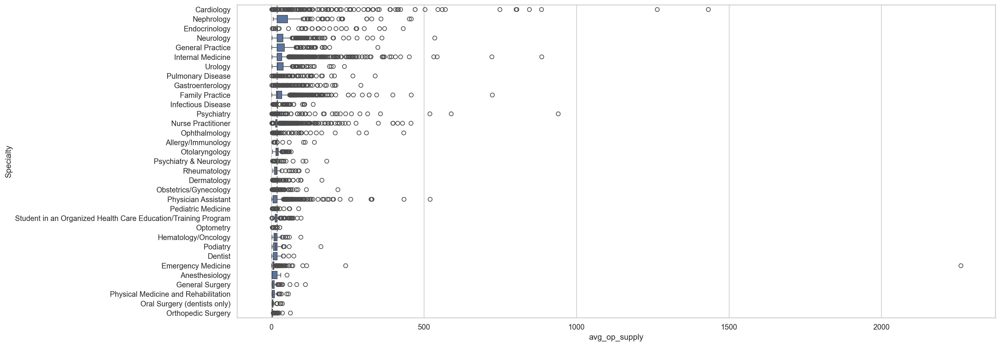

In [ ]:
sns.set(style='whitegrid', rc={"figure.figsize": (18, 8)})
df_short = prescriber_df.loc[:, ['Specialty', 'avg_op_supply']]
df_short = df_short.loc[prescriber_df['Specialty'].isin(top119), :]
sns.boxplot(data=df_short, y='Specialty', x='avg_op_supply', order=top119)
plt.show()

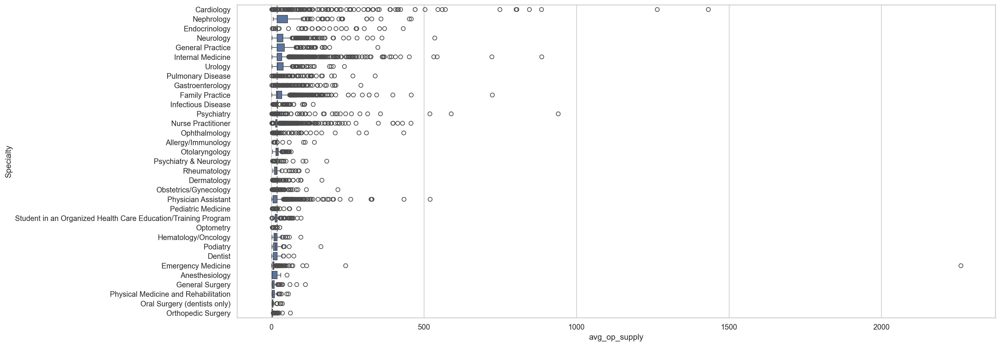

In [ ]:
sns.set(style='whitegrid', rc={"figure.figsize": (18, 8)})
df_short = prescriber_df.loc[:, ['Specialty', 'avg_op_supply']]
df_short = df_short.loc[prescriber_df['Specialty'].isin(top200), :]
sns.boxplot(data=df_short, y='Specialty', x='avg_op_supply', order=top200)
plt.show()

In [ ]:
# Fix: use xs (cross-section) to access 'avg_op_supply' statistics by specialty
tmp = df_short.groupby('Specialty').describe()

# Make sure 'top40' is a list of specialty names and exists in tmp.index
valid_specialties = [s for s in top40 if s in tmp.index]

# Select only those rows from tmp
tmp_top40 = tmp.loc[valid_specialties]

# Show the mean and std for those
tmp_top40_stats = tmp_top40['avg_op_supply'][['mean', 'std']]
print(tmp_top40_stats)


                                                         mean         std
Specialty                                                                
Cardiology                                          49.929018  123.737263
Nephrology                                          49.669658   68.899281
Endocrinology                                       44.183553   74.405053
Neurology                                           39.617549   56.030697
General Practice                                    36.403913   42.012853
Internal Medicine                                   33.189081   46.533000
Urology                                             32.984984   31.721057
Pulmonary Disease                                   31.404314   40.507512
Gastroenterology                                    30.300000   35.700562
Family Practice                                     30.044656   32.800588
Infectious Disease                                  26.955752   23.811353
Psychiatry                            

In [ ]:
# List of specialties you're interested in
specialties_to_keep = [
    'Cardiology', 'Endocrinology', 'Psychiatry', 'Nephrology','Pulmonary Disease', 'Allergy/Immunology',
    'Gastroenterology','Neurology', 'Psychiatry & Neurology', 'Ophthalmology','General Practice',
    'Infectious Disease', 'Internal Medicine','Urology', 'Family Practice', 'Dermatology',
    'Nurse Practitioner','Obstetrics/Gynecology', 'Otolaryngology', 'Pediatric Medicine','Rheumatology',
    'Physician Assistant','Student in an Organized Health Care Education/Training Program',
    'Hematology/Oncology', 'Podiatry', 'Emergency Medicine','Physical Medicine and Rehabilitation',
    'Dentist', 'General Surgery','Oral Surgery (dentists only)', 'Anesthesiology', 'Orthopedic Surgery'
]

# Select only relevant columns and filter rows where Specialty is in the list
cols_to_keep = ['Specialty', 'op_longer', 'avg_op_supply']
data = prescriber_df.loc[prescriber_df['Specialty'].isin(specialties_to_keep), cols_to_keep]

# Drop columns that are entirely zeros (if any)
data = data.loc[:, (data != 0).any(axis=0)]

# Show result
print(data.shape)
data.head()


(24252, 3)


,Specialty,op_longer,avg_op_supply
0,Dentist,1.0,4.5
1,Pulmonary Disease,0.0,4.5
2,Nurse Practitioner,0.0,4.5
3,Emergency Medicine,1.0,4.1
4,Family Practice,1.0,13.5


In [ ]:
# Get top 25 most frequent specialties
freq_specialty = list(prescriber_df['Specialty'].value_counts(ascending=False).index[:25])

# Filter data to keep only relevant specialties
data = data[data['Specialty'].isin(freq_specialty)]

# Group by specialty and compute correlation with avg_op_supply
grouped = data.groupby('Specialty').corrwith(data['avg_op_supply'])

# Drop the self-correlation column
grouped = grouped.drop('avg_op_supply', axis=1)

# Display result
grouped


,op_longer
Specialty,
Cardiology,0.423082
Dermatology,0.126011
Family Practice,0.068448
Gastroenterology,0.390639
General Practice,0.162206
Internal Medicine,0.150434
Nephrology,0.202366
Neurology,0.214684
Nurse Practitioner,0.093667


In [ ]:
# Step 1: Get the top 25 specialties
top_specialties = prescriber_df['Specialty'].value_counts().index[:25]
data = prescriber_df[prescriber_df['Specialty'].isin(top_specialties)]

# Step 2: Select only numeric columns
numeric_cols = data.select_dtypes(include='number').columns.tolist()

# Step 3: Build correlation table manually: each specialty column has correlation with avg_op_supply
correlation_results = {}

for specialty in top_specialties:
    sub_df = data[data['Specialty'] == specialty]
    if sub_df.shape[0] < 2:
        continue  # skip if not enough data for correlation
    corr = sub_df[numeric_cols].corrwith(sub_df['avg_op_supply'])
    correlation_results[specialty] = corr.drop(labels='avg_op_supply', errors='ignore')  # drop self-corr if present

# Step 4: Combine into DataFrame
corr_df = pd.DataFrame(correlation_results)

# Step 5: Show the result
print(corr_df.columns)
corr_df.head()



/Users/davidlivingston/.pyenv/versions/3.10.14/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/davidlivingston/.pyenv/versions/3.10.14/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/Users/davidlivingston/.pyenv/versions/3.10.14/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/davidlivingston/.pyenv/versions/3.10.14/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/Users/davidlivingston/.pyenv/versions/3.10.14/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/davidlivingston/.pyenv/versions/3.10.14/lib/python3.10/site-packages/nump

Index(['Internal Medicine', 'Family Practice', 'Dentist', 'Nurse Practitioner',
       'Physician Assistant', 'Emergency Medicine', 'Cardiology', 'Psychiatry',
       'Obstetrics/Gynecology', 'Orthopedic Surgery', 'Optometry',
       'Student in an Organized Health Care Education/Training Program',
       'Ophthalmology', 'General Surgery', 'Gastroenterology', 'Neurology',
       'Podiatry', 'Dermatology', 'Urology', 'Pulmonary Disease',
       'Otolaryngology', 'Psychiatry & Neurology', 'General Practice',
       'Nephrology', 'Hematology/Oncology'],
      dtype='object')


/Users/davidlivingston/.pyenv/versions/3.10.14/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/davidlivingston/.pyenv/versions/3.10.14/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/Users/davidlivingston/.pyenv/versions/3.10.14/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/davidlivingston/.pyenv/versions/3.10.14/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


,Internal Medicine,Family Practice,Dentist,Nurse Practitioner,Physician Assistant,Emergency Medicine,Cardiology,Psychiatry,Obstetrics/Gynecology,Orthopedic Surgery,...,Neurology,Podiatry,Dermatology,Urology,Pulmonary Disease,Otolaryngology,Psychiatry & Neurology,General Practice,Nephrology,Hematology/Oncology
NPI,-0.026416,0.001983,0.081432,0.051597,0.006668,-0.025301,-0.012358,-0.002814,0.051211,0.046212,...,0.011358,0.063965,0.108332,-0.026135,-0.010686,0.067796,0.041129,-0.023355,-0.040440,-0.083562
NPPES Provider ZIP Code,-0.136896,-0.098318,-0.101162,-0.030403,-0.017323,0.033951,-0.006258,0.050170,-0.101396,-0.117780,...,-0.007942,-0.057646,0.021957,-0.081468,-0.077014,-0.138584,-0.069537,-0.204848,0.006761,-0.114551
Totalclaimcount,0.219642,0.118872,-0.271402,0.236217,0.370585,0.422426,0.530561,0.344681,0.298340,0.232324,...,0.349874,0.351704,0.243408,0.401927,0.293316,0.446098,0.186386,0.214432,0.363526,0.032860
OpioidClaimCount,-0.096435,-0.173202,-0.634749,-0.114234,-0.096521,-0.015877,0.119100,0.077171,0.028626,-0.114751,...,-0.086664,-0.333299,-0.055314,-0.151126,0.029020,-0.056733,0.397287,-0.130090,-0.000043,-0.412366
ACETAMINOPHEN.CODEINE,-0.005708,-0.052350,-0.208822,-0.007082,0.002736,0.141978,0.031649,-0.007329,-0.032060,-0.024535,...,-0.039523,0.014795,-0.060711,-0.023900,0.090365,0.003315,NaN,-0.049879,-0.029167,-0.067627


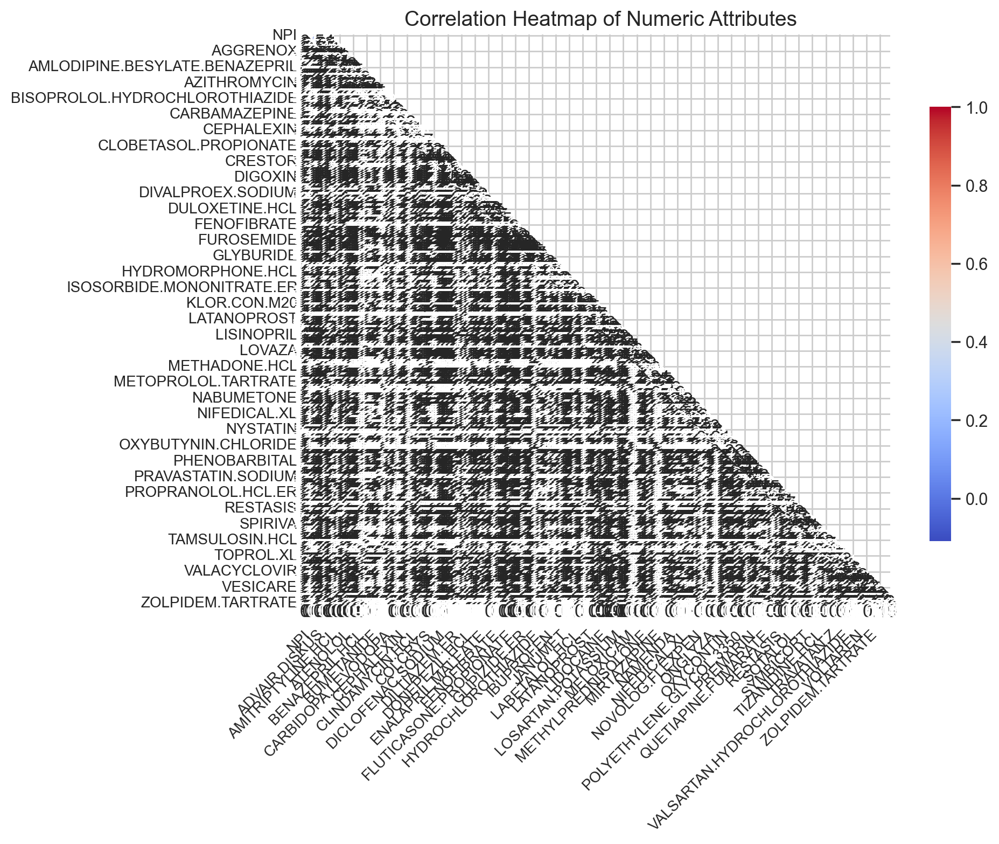

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Select only numeric columns
numeric_prescriber_df = prescriber_df.select_dtypes(include='number')

# Step 2: Compute correlation matrix
corr = numeric_prescriber_df.corr()

# Step 3: Create mask for upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Step 4: Plot heatmap
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr, mask=mask, cmap='coolwarm', annot=True, fmt=".2f", ax=ax,
            cbar_kws={"shrink": 0.75}, square=True)

# Step 5: Format tick labels
ax.set_xticklabels(ax.get_xticklabels(), fontsize=10, rotation=45, ha='right')
ax.set_yticklabels(ax.get_yticklabels(), fontsize=10, rotation=0)

plt.title("Correlation Heatmap of Numeric Attributes", fontsize=14)
plt.tight_layout()
plt.show()


## deaths by states related to overdose as reported by wonder CDC

In [ ]:
list(prescriber_df)

['NPI',
 'Gender',
 'State',
 'Credentials',
 'Specialty',
 'NPPES Provider Last Name',
 'NPPES Provider First Name',
 'NPPES Provider ZIP Code',
 'NPPES Provider State',
 'Totalclaimcount',
 'OpioidClaimCount',
 'ACETAMINOPHEN.CODEINE',
 'ACYCLOVIR',
 'ADVAIR.DISKUS',
 'AGGRENOX',
 'ALENDRONATE.SODIUM',
 'ALLOPURINOL',
 'ALPRAZOLAM',
 'AMIODARONE.HCL',
 'AMITRIPTYLINE.HCL',
 'AMLODIPINE.BESYLATE',
 'AMLODIPINE.BESYLATE.BENAZEPRIL',
 'AMOXICILLIN',
 'AMOX.TR.POTASSIUM.CLAVULANATE',
 'AMPHETAMINE.SALT.COMBO',
 'ATENOLOL',
 'ATORVASTATIN.CALCIUM',
 'AVODART',
 'AZITHROMYCIN',
 'BACLOFEN',
 'BD.ULTRA.FINE.PEN.NEEDLE',
 'BENAZEPRIL.HCL',
 'BENICAR',
 'BENICAR.HCT',
 'BENZTROPINE.MESYLATE',
 'BISOPROLOL.HYDROCHLOROTHIAZIDE',
 'BRIMONIDINE.TARTRATE',
 'BUMETANIDE',
 'BUPROPION.HCL.SR',
 'BUPROPION.XL',
 'BUSPIRONE.HCL',
 'BYSTOLIC',
 'CARBAMAZEPINE',
 'CARBIDOPA.LEVODOPA',
 'CARISOPRODOL',
 'CARTIA.XT',
 'CARVEDILOL',
 'CEFUROXIME',
 'CELEBREX',
 'CEPHALEXIN',
 'CHLORHEXIDINE.GLUCONATE',
 'C

In [ ]:
num_pres = prescriber_df.groupby('State').size()
num_longer = prescriber_df['op_longer'].groupby(prescriber_df['State']).sum()
ratio_pres_longer = (num_longer / num_pres).sort_values(ascending=False)
tmp = pd.concat([num_pres, num_longer, ratio_pres_longer], axis = 1)
tmp.columns = ['num_prescriber', 'num_longer', 'ratio_of_longer']
tmp['state'] = tmp.index
tmp = tmp.sort_values(by='ratio_of_longer', ascending=False)

In [ ]:
tmp.head()[:2]

,num_prescriber,num_longer,ratio_of_longer,state
State,,,,
AE,2,2.0,1.00,AE
VI,4,3.0,0.75,VI


In [ ]:
death_overdose = pd.read_csv("./inputs/overdosesd.csv", thousands = ",")
death_overdose = death_overdose.set_index('Abbrev')
death_overdose.Deaths = pd.to_numeric(death_overdose.Deaths)
death_overdose.Population = pd.to_numeric(death_overdose.Population)
death_overdose['death_per_cap'] = 100000 * death_overdose['Deaths'] / death_overdose['Population']

In [ ]:
death_overdose = pd.concat([death_overdose, tmp], axis = 1)

In [ ]:
death_overdose = death_overdose.sort_values(by='ratio_of_longer', ascending=False)
death_overdose.fillna(0,inplace =True)

In [ ]:
death_overdose

,State,Population,Deaths,death_per_cap,num_prescriber,num_longer,ratio_of_longer,state
AE,0,0.0,0.0,0.000000,2,2.0,1.000000,AE
VI,0,0.0,0.0,0.000000,4,3.0,0.750000,VI
AR,Arkansas,2959373.0,356.0,12.029575,209,143.0,0.684211,AR
OK,Oklahoma,3850568.0,777.0,20.178841,282,190.0,0.673759,OK
MT,Montana,1015165.0,125.0,12.313269,73,49.0,0.671233,MT
AL,Alabama,4833722.0,723.0,14.957418,339,219.0,0.646018,AL
AK,Alaska,735132.0,124.0,16.867719,39,25.0,0.641026,AK
NV,Nevada,2790136.0,545.0,19.533098,153,96.0,0.627451,NV
ID,Idaho,1612136.0,212.0,13.150255,128,79.0,0.617188,ID
OR,Oregon,3930065.0,522.0,13.282223,325,200.0,0.615385,OR


In [ ]:
death_overdose['ratio_of_longer'].mean()

0.5579624426062229

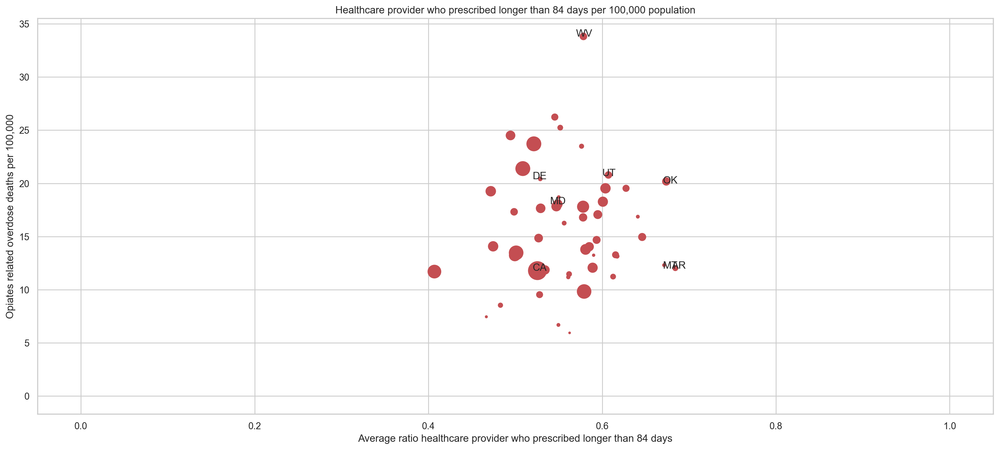

In [ ]:
# scatter plot showing the death percapita by state using the standard prescripition method for those
# prescribed above the  12 weeks medications and the mean overdose death for the nation based on my dataset
# was 0.55 and i am using scatter map to see for those states above the mean below:
plt.figure(figsize=(18, 8))
s = .1 * death_overdose['Deaths']
plt.scatter(y=death_overdose['death_per_cap'], x=death_overdose['ratio_of_longer'],
           s = s ,
            c = 'r')

plt.text(0.52, 20.4,'DE')
plt.text(0.52, 11.79,'CA')
plt.text(0.57, 33.8,'WV')
plt.text(0.54, 18.04,'MD')
plt.text(.68, 12.0, 'AR')
plt.text(0.67, 20.0, 'OK')
plt.text(0.60, 20.7, 'UT')
plt.text(0.67, 12.0, 'MT')
plt.xlabel('Average ratio healthcare provider who prescribed longer than 84 days')
plt.title('Healthcare provider who prescribed longer than 84 days per 100,000 population')
plt.ylabel('Opiates related overdose deaths per 100,000')
# plt.savefig('./inputs/overdose_vs_ratio.png')
plt.show()

In [ ]:
# using the pandas pd.concate to add the death_overdose with the prescriber/speciality and visualize
# in which states is significant for  what speciaity.
death_overdose = pd.concat([death_overdose, prescriber_df], axis = 1)

# Health professionals specialty  and the opiods they prescribe

In [ ]:
death_overdose.tail()[:2]

,State,Population,Deaths,death_per_cap,num_prescriber,num_longer,ratio_of_longer,state,NPI,Gender,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
24995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.619019e+09,F,...,0.0,0.0,39.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN
24996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.780694e+09,F,...,0.0,0.0,20.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN


In [ ]:
death_overdose.fillna(0)[:2]

,State,Population,Deaths,death_per_cap,num_prescriber,num_longer,ratio_of_longer,state,NPI,Gender,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
AE,0,0.0,0.0,0.0,2.0,2.0,1.00,AE,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
VI,0,0.0,0.0,0.0,4.0,3.0,0.75,VI,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
death_overdose.columns

Index(['State', 'Population', 'Deaths', 'death_per_cap', 'num_prescriber',
       'num_longer', 'ratio_of_longer', 'state', 'NPI', 'Gender',
       ...
       'VYTORIN', 'WARFARIN.SODIUM', 'XARELTO', 'ZETIA', 'ZIPRASIDONE.HCL',
       'ZOLPIDEM.TARTRATE', 'avg_op_supply', 'op_longer', 'Opioid_Prescriber',
       'op_prescriber'],
      dtype='object', length=272)

In [ ]:
death_overdose.shape

(24914, 272)

In [ ]:
list(death_overdose)

['State',
 'Population',
 'Deaths',
 'death_per_cap',
 'num_prescriber',
 'num_longer',
 'ratio_of_longer',
 'state',
 'NPI',
 'Gender',
 'State',
 'Credentials',
 'Specialty',
 'NPPES Provider Last Name',
 'NPPES Provider First Name',
 'NPPES Provider ZIP Code',
 'NPPES Provider State',
 'Totalclaimcount',
 'OpioidClaimCount',
 'ACETAMINOPHEN.CODEINE',
 'ACYCLOVIR',
 'ADVAIR.DISKUS',
 'AGGRENOX',
 'ALENDRONATE.SODIUM',
 'ALLOPURINOL',
 'ALPRAZOLAM',
 'AMIODARONE.HCL',
 'AMITRIPTYLINE.HCL',
 'AMLODIPINE.BESYLATE',
 'AMLODIPINE.BESYLATE.BENAZEPRIL',
 'AMOXICILLIN',
 'AMOX.TR.POTASSIUM.CLAVULANATE',
 'AMPHETAMINE.SALT.COMBO',
 'ATENOLOL',
 'ATORVASTATIN.CALCIUM',
 'AVODART',
 'AZITHROMYCIN',
 'BACLOFEN',
 'BD.ULTRA.FINE.PEN.NEEDLE',
 'BENAZEPRIL.HCL',
 'BENICAR',
 'BENICAR.HCT',
 'BENZTROPINE.MESYLATE',
 'BISOPROLOL.HYDROCHLOROTHIAZIDE',
 'BRIMONIDINE.TARTRATE',
 'BUMETANIDE',
 'BUPROPION.HCL.SR',
 'BUPROPION.XL',
 'BUSPIRONE.HCL',
 'BYSTOLIC',
 'CARBAMAZEPINE',
 'CARBIDOPA.LEVODOPA',
 '

In [ ]:
prescriber_df.head()[:2]  # showing the first two rows

,NPI,Gender,State,Credentials,Specialty,NPPES Provider Last Name,NPPES Provider First Name,NPPES Provider ZIP Code,NPPES Provider State,Totalclaimcount,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
0,1003002320,M,MS,D.M.D. P.A.,Dentist,EKLUND,D.,39208.0,MS,129,...,0,0,0,0,0,0,4.5,1.0,1,1.0
1,1003004771,F,CO,M.D.,Pulmonary Disease,RIGGLE,ERIN,80120.0,CO,537,...,0,0,16,0,0,0,4.5,0.0,0,0.0


In [ ]:
list(prescriber_df)   # listing all the prescribers

['NPI',
 'Gender',
 'State',
 'Credentials',
 'Specialty',
 'NPPES Provider Last Name',
 'NPPES Provider First Name',
 'NPPES Provider ZIP Code',
 'NPPES Provider State',
 'Totalclaimcount',
 'OpioidClaimCount',
 'ACETAMINOPHEN.CODEINE',
 'ACYCLOVIR',
 'ADVAIR.DISKUS',
 'AGGRENOX',
 'ALENDRONATE.SODIUM',
 'ALLOPURINOL',
 'ALPRAZOLAM',
 'AMIODARONE.HCL',
 'AMITRIPTYLINE.HCL',
 'AMLODIPINE.BESYLATE',
 'AMLODIPINE.BESYLATE.BENAZEPRIL',
 'AMOXICILLIN',
 'AMOX.TR.POTASSIUM.CLAVULANATE',
 'AMPHETAMINE.SALT.COMBO',
 'ATENOLOL',
 'ATORVASTATIN.CALCIUM',
 'AVODART',
 'AZITHROMYCIN',
 'BACLOFEN',
 'BD.ULTRA.FINE.PEN.NEEDLE',
 'BENAZEPRIL.HCL',
 'BENICAR',
 'BENICAR.HCT',
 'BENZTROPINE.MESYLATE',
 'BISOPROLOL.HYDROCHLOROTHIAZIDE',
 'BRIMONIDINE.TARTRATE',
 'BUMETANIDE',
 'BUPROPION.HCL.SR',
 'BUPROPION.XL',
 'BUSPIRONE.HCL',
 'BYSTOLIC',
 'CARBAMAZEPINE',
 'CARBIDOPA.LEVODOPA',
 'CARISOPRODOL',
 'CARTIA.XT',
 'CARVEDILOL',
 'CEFUROXIME',
 'CELEBREX',
 'CEPHALEXIN',
 'CHLORHEXIDINE.GLUCONATE',
 'C

In [ ]:
# The total number of  Speciality aggregated by the opiod prescriber,claim and count
group_prescribers = prescriber_df.groupby(['Specialty']).agg({'op_prescriber': 'sum',
                                                              'Totalclaimcount': 'sum',
                                                              'OpioidClaimCount': 'sum'})
group_prescribers

,op_prescriber,Totalclaimcount,OpioidClaimCount
Specialty,,,
Allergy/Immunology,8.0,102736,586
Anesthesiology,86.0,174672,96819
Cardiology,161.0,2322655,7450
Dentist,1009.0,230336,29811
Dermatology,61.0,234785,3300
Emergency Medicine,1006.0,564940,70406
Endocrinology,32.0,476522,2396
Family Practice,2581.0,12585462,576664
Gastroenterology,115.0,468059,4589


<Axes: ylabel='Specialty'>

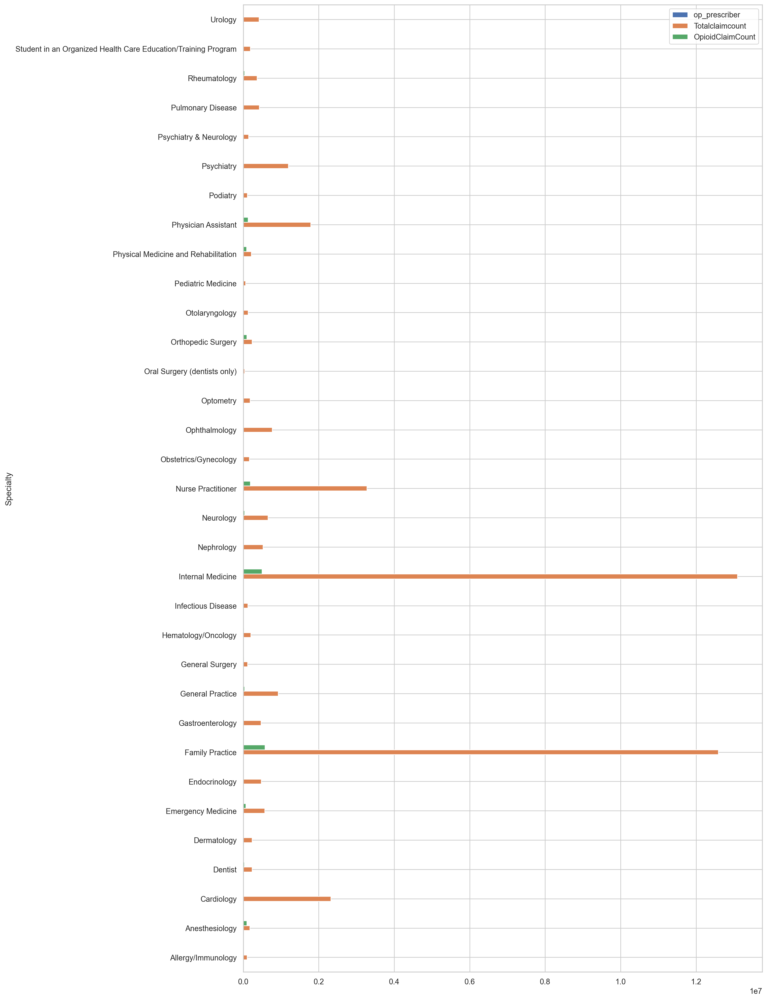

In [ ]:
group_prescribers.plot(kind = 'barh', figsize =(12,24))

In [ ]:
group_prescribers.corr()['op_prescriber']

op_prescriber       1.000000
Totalclaimcount     0.882238
OpioidClaimCount    0.926808
Name: op_prescriber, dtype: float64

## Using  pairplot to display the results

Text(0.5, 1.0, 'Health Specialits that prescribe opiods')

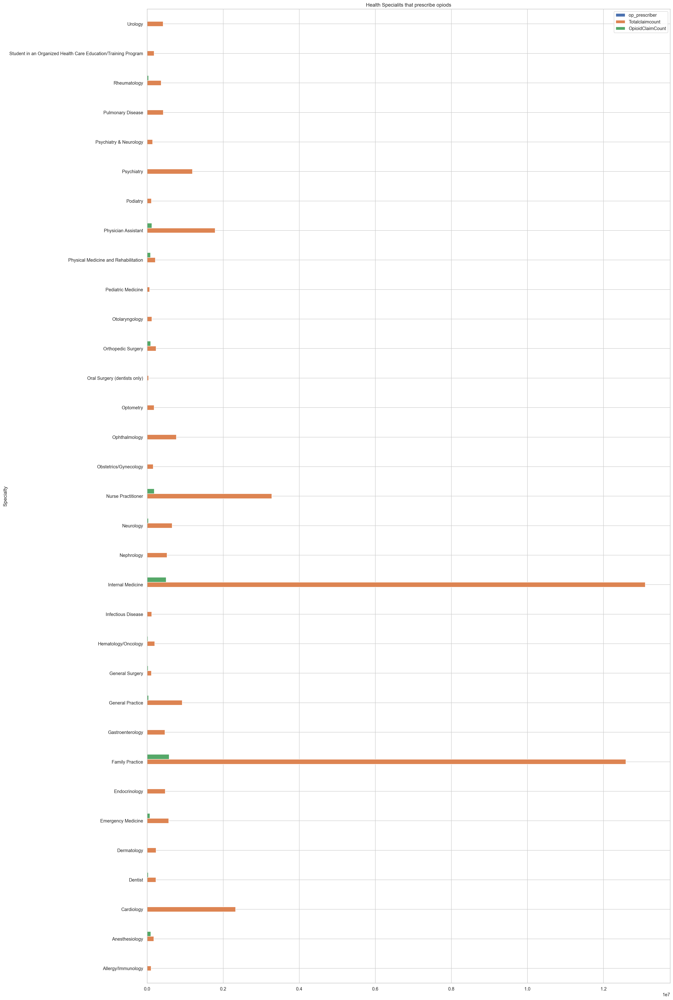

In [ ]:
# Set figure size
fig, ax = plt.subplots(figsize = (20,40))
group_prescribers.plot(kind = 'barh', ax = ax)
plt.title('Health Specialits that prescribe opiods')

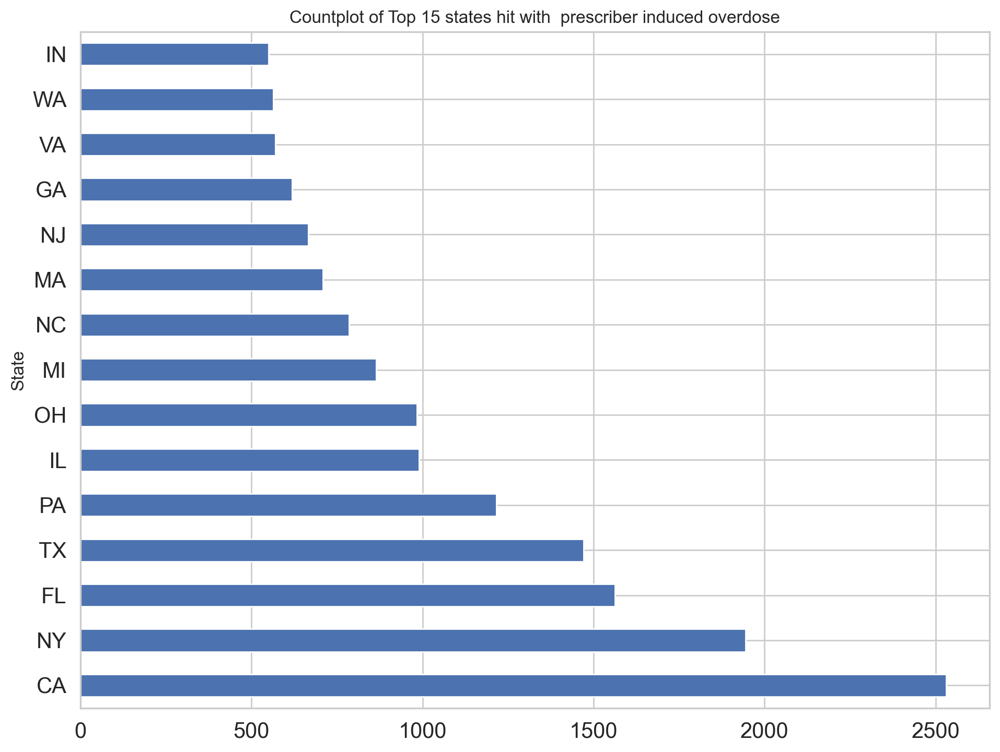

In [ ]:
# Set figure size
fig = plt.subplots(figsize = (10,8))
prescriber_df['State'].value_counts().head(15).plot(kind = 'barh', fontsize = 15)
plt.title('Countplot of Top 15 states hit with  prescriber induced overdose')
plt.show()

In [ ]:
list(prescriber_df)

['NPI',
 'Gender',
 'State',
 'Credentials',
 'Specialty',
 'NPPES Provider Last Name',
 'NPPES Provider First Name',
 'NPPES Provider ZIP Code',
 'NPPES Provider State',
 'Totalclaimcount',
 'OpioidClaimCount',
 'ACETAMINOPHEN.CODEINE',
 'ACYCLOVIR',
 'ADVAIR.DISKUS',
 'AGGRENOX',
 'ALENDRONATE.SODIUM',
 'ALLOPURINOL',
 'ALPRAZOLAM',
 'AMIODARONE.HCL',
 'AMITRIPTYLINE.HCL',
 'AMLODIPINE.BESYLATE',
 'AMLODIPINE.BESYLATE.BENAZEPRIL',
 'AMOXICILLIN',
 'AMOX.TR.POTASSIUM.CLAVULANATE',
 'AMPHETAMINE.SALT.COMBO',
 'ATENOLOL',
 'ATORVASTATIN.CALCIUM',
 'AVODART',
 'AZITHROMYCIN',
 'BACLOFEN',
 'BD.ULTRA.FINE.PEN.NEEDLE',
 'BENAZEPRIL.HCL',
 'BENICAR',
 'BENICAR.HCT',
 'BENZTROPINE.MESYLATE',
 'BISOPROLOL.HYDROCHLOROTHIAZIDE',
 'BRIMONIDINE.TARTRATE',
 'BUMETANIDE',
 'BUPROPION.HCL.SR',
 'BUPROPION.XL',
 'BUSPIRONE.HCL',
 'BYSTOLIC',
 'CARBAMAZEPINE',
 'CARBIDOPA.LEVODOPA',
 'CARISOPRODOL',
 'CARTIA.XT',
 'CARVEDILOL',
 'CEFUROXIME',
 'CELEBREX',
 'CEPHALEXIN',
 'CHLORHEXIDINE.GLUCONATE',
 'C

In [ ]:
Gender_group_prescribers = prescriber_df.groupby(['Gender']).agg({'op_prescriber': 'sum',
                                                              'Totalclaimcount': 'sum',
                                                              'OpioidClaimCount': 'sum'})
Gender_group_prescribers

,op_prescriber,Totalclaimcount,OpioidClaimCount
Gender,,,
F,4811.0,13028415,596888
M,8524.0,29443584,1408523


<Axes: ylabel='Gender'>

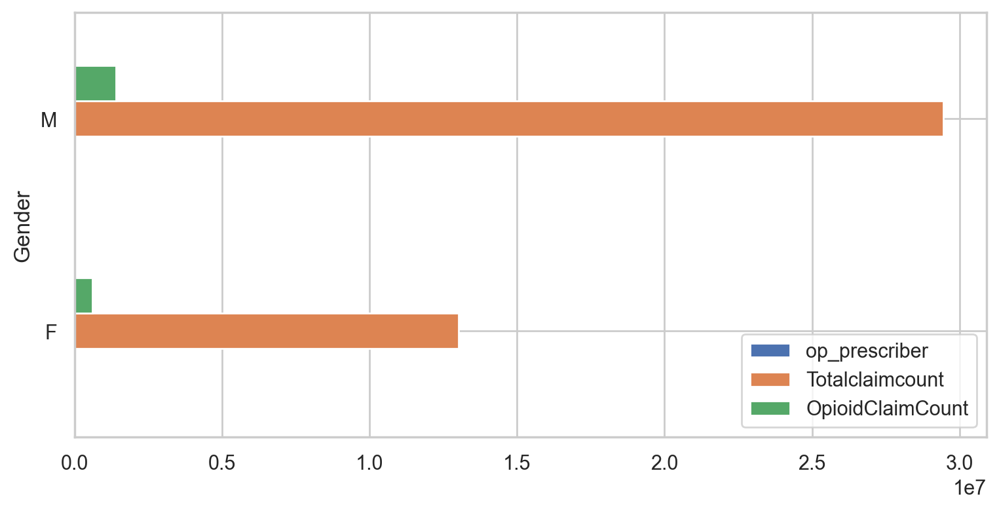

In [ ]:
Gender_group_prescribers.plot(kind = 'barh', figsize =(8,4))

In [ ]:
Gender_group_prescribers.corr()['op_prescriber']

op_prescriber       1.0
Totalclaimcount     1.0
OpioidClaimCount    1.0
Name: op_prescriber, dtype: float64

Text(0.5, 1.0, 'Health Specialits by Gender')

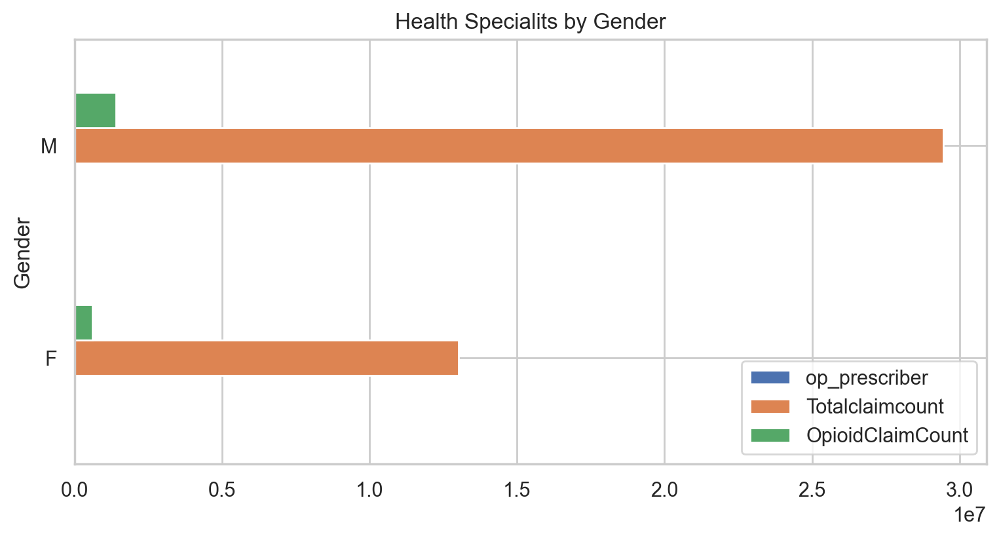

In [ ]:
# visulizing the if gender has any attribute to over prescription
# Set figure size
fig, ax = plt.subplots(figsize = (8,4))

Gender_group_prescribers.plot(kind = 'barh', ax = ax)
plt.title('Health Specialits by Gender')

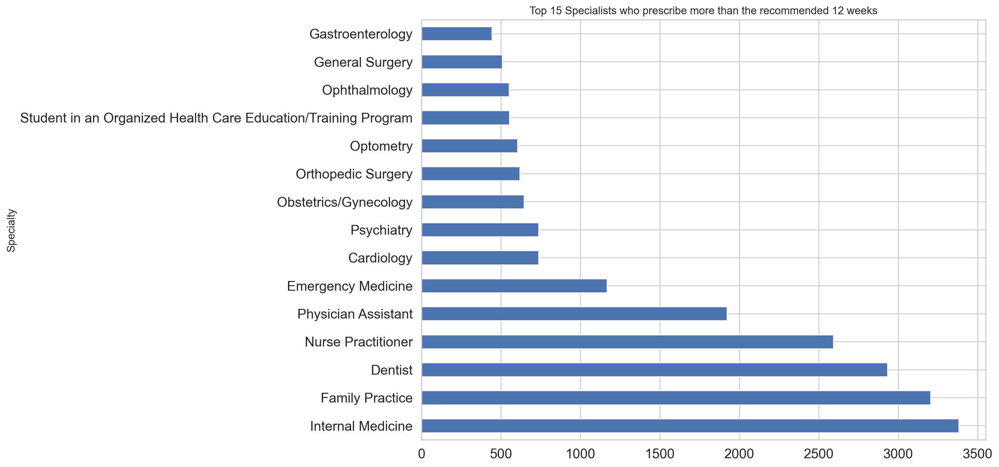

In [ ]:
# Set figure size
fig = plt.subplots(figsize = (10,8))

prescriber_df['Specialty'].value_counts().head(15).plot(kind = 'barh', fontsize = 15)
plt.title('Top 15 Specialists who prescribe more than the recommended 12 weeks')
plt.show()

###  National Health Expenditure

In [ ]:
# read NHE spending csv into DF
nhe = "./inputs/NHE2016.csv"
nhe_df = pd.read_csv(nhe, thousands=',',engine='python')

nhe_df.head()

,Expenditure Amount (Millions),1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Total National Health Expenditures,27214,29138,31842,34595,38394,41852,46081,51565,58402,...,2295307,2399121,2495414,2598823,2689349,2797260,2879008,3026157,3200815,3337248
1,Out of pocket,12949,13357,14255,15311,16928,18209,18594,18537,20500,...,290000,295184,293723,299742,309973,318330,325189,330068,339315,352537
2,Health Insurance,7497,8236,8999,9892,10971,12023,15673,21109,24379,...,1609250,1695968,1796424,1876922,1950187,2022904,2087804,2228136,2382770,2486842
3,Private Health Insurance,5812,6468,7178,7952,9052,10072,10296,10452,11830,...,776176,802857,832906,864344,898631,928211,946398,999940,1068778,1123372
4,Medicare,-,-,-,-,-,-,1842,4924,6218,...,432751,466971,498859,519787,544679,569634,590163,618889,648808,672093


In [ ]:
# extract Total NHE and Total CMS Program rows
# the NHE has more rows which are  Out of pocket(OOP) and private health insurance and i am only interested to see the
# Total CMS Programs (Medicaid, CHIP and medicare) section and the total health expenditure(THE) and
# including the population i will use the following formula to extract. The T
nhe_cms_df = nhe_df.loc[[0,35,36],]
nhe_cms_df = nhe_cms_df.set_index("Expenditure Amount (Millions)")

# set to numeric for plotting purposes
nhe_cms_df = nhe_cms_df.apply(pd.to_numeric, errors='ignore')


nhe_cms_df.head()

/var/folders/b7/cx8d0sxx3zqdm7j6rd9fl51c0000gn/T/ipykernel_906/219251680.py:9: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  nhe_cms_df = nhe_cms_df.apply(pd.to_numeric, errors='ignore')


,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Expenditure Amount (Millions),,,,,,,,,,,,,,,,,,,,,
Total National Health Expenditures,27214,29138,31842,34595,38394,41852,46081,51565,58402,65923,...,2295307,2399121,2495414,2598823,2689349,2797260,2879008,3026157,3200815,3337248
"Total CMS Programs (Medicaid, CHIP and Medicare)",-,-,-,-,-,-,3146,8065,9759,11220,...,767613,821394,884386,928553,963412,1004951,1049032,1128749,1207734,1254525
POPULATION,186,189,192,195,197,200,202,204,206,208,...,301,304,306,309,311,313,316,318,320,322


In [ ]:
# Extract series of spending data 1999 - 2016 to compare against opioid deaths
cms_spending = nhe_cms_df.loc['Total CMS Programs (Medicaid, CHIP and Medicare)','1999':'2016']
nhe_spending = nhe_cms_df.loc['Total National Health Expenditures','1999':'2016']
percentage = cms_spending / nhe_spending

percentage.max()

0.3773207761148333

In [ ]:
nhe_spending

1999    1277700
2000    1369125
2001    1486158
2002    1628624
2003    1767567
2004    1895724
2005    2023744
2006    2156158
2007    2295307
2008    2399121
2009    2495414
2010    2598823
2011    2689349
2012    2797260
2013    2879008
2014    3026157
2015    3200815
2016    3337248
Name: Total National Health Expenditures, dtype: object

In [ ]:
csv_file = "./inputs/DPDRate.csv"

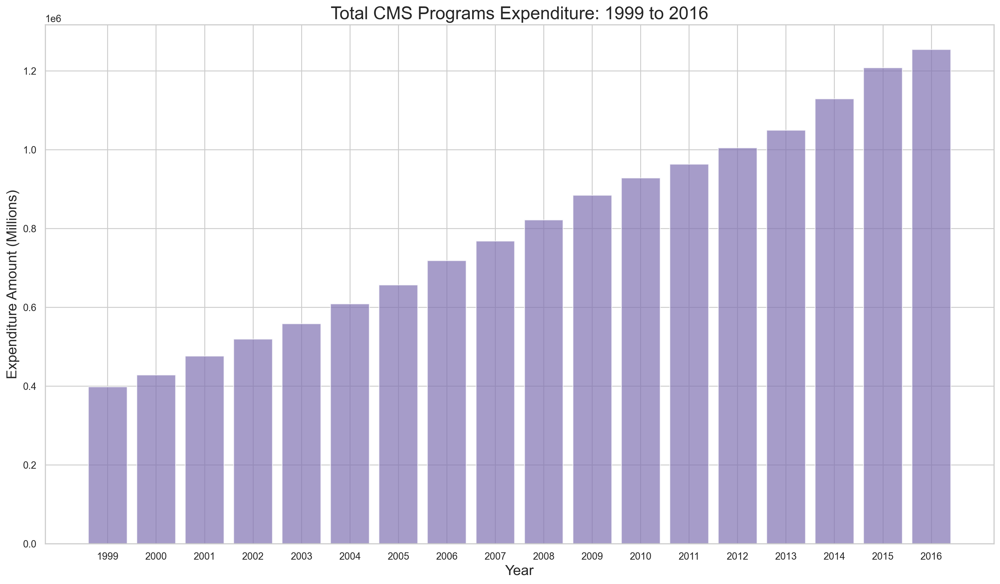

In [ ]:
DPDRate_df = pd.read_csv(csv_file, index_col="Year")                           # reads data from file
DPDRate_df.head()
year_min = DPDRate_df.index.min()                                              # finds min and max dates
year_max = DPDRate_df.index.max()
plt.figure(figsize = (17,10))                                                # sets bar chart parameters
plt.title('Total CMS Programs Expenditure: %s to %s' % (year_min, year_max), fontdict = {'fontsize': 20})
plt.xlabel('Year', fontdict = {'fontsize': 16})
plt.ylabel('Expenditure Amount (Millions)', fontdict = {'fontsize': 16})
xvals = np.arange(len(DPDRate_df))
tick_locations = [value+0.4 for value in xvals]
plt.bar(xvals, cms_spending, color='m', alpha=0.7, align="edge")
plt.xticks(tick_locations, DPDRate_df['Year Code'], rotation="horizontal")
plt.show()

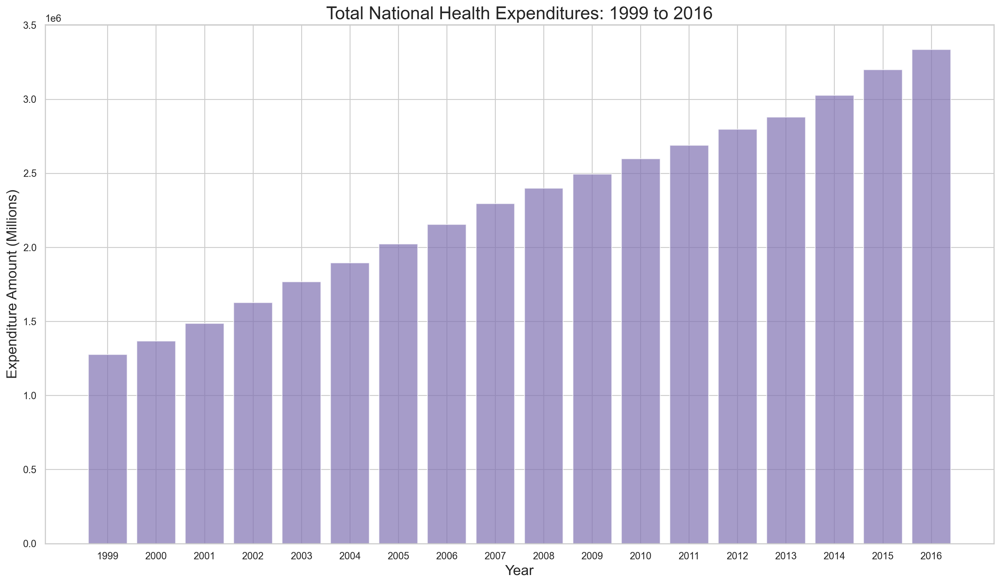

In [ ]:
plt.figure(figsize = (17,10))                                                # sets bar chart parameters
plt.title('Total National Health Expenditures: %s to %s' % (year_min, year_max), fontdict = {'fontsize': 20})
plt.xlabel('Year', fontdict = {'fontsize': 16})
plt.ylabel('Expenditure Amount (Millions)', fontdict = {'fontsize': 16})
xvals = np.arange(len(DPDRate_df))
tick_locations = [value+0.4 for value in xvals]
plt.bar(xvals, nhe_spending, color='m', alpha=0.7, align="edge")
plt.xticks(tick_locations, DPDRate_df['Year Code'], rotation="horizontal")
plt.show()

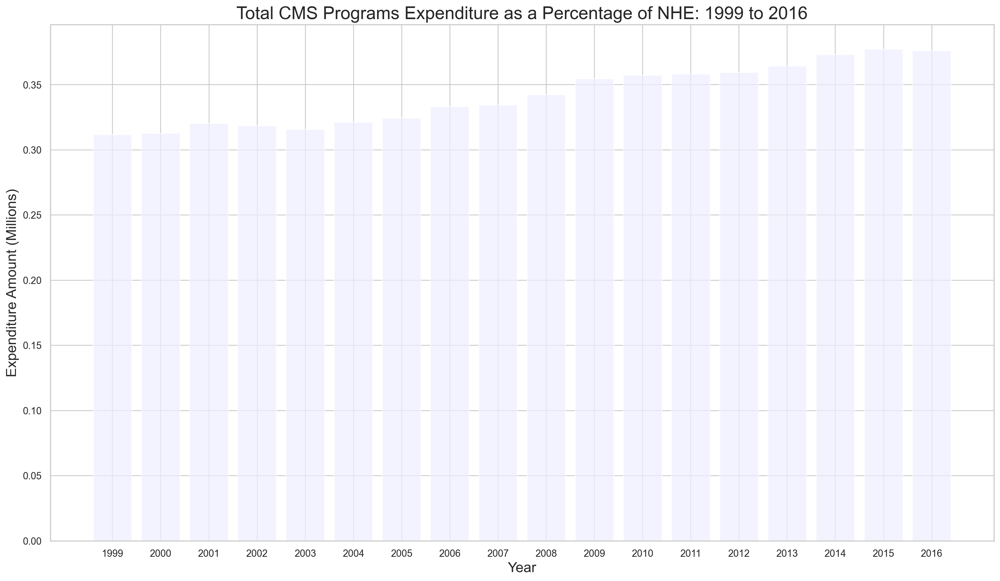

In [ ]:
# plot CMS spending as percentage of NHE
plt.figure(figsize = (17,10))                                                # sets bar chart parameters
plt.title('Total CMS Programs Expenditure as a Percentage of NHE: %s to %s' % (year_min, year_max), fontdict = {'fontsize': 20})
plt.xlabel('Year', fontdict = {'fontsize': 16})
plt.ylabel('Expenditure Amount (Millions)', fontdict = {'fontsize': 16})
xvals = np.arange(len(DPDRate_df))
tick_locations = [value+0.4 for value in xvals]
plt.bar(xvals, cms_spending / nhe_spending, color='#eeefff', alpha=0.7, align="edge")
plt.xticks(tick_locations, DPDRate_df['Year Code'], rotation="horizontal")

plt.show()

In [ ]:
psr_df= pd.read_csv('./inputs/prescriber_state_rate.csv')
pcr_df = pd.read_csv('./inputs/prescriber_county_rate.csv')
pzr_df= pd.read_csv('./inputs/prescriber_zip_rate.csv')

In [ ]:
psr_df.head()[:2]

,State_Name,State_Abbreviation,2013_Opioid_Prescribing_Rate,2013_Extended_Release_Opioid_Prescribing_Rate,2014_Opioid_Prescribing_Rate,2014_Extended_Release_Opioid_Prescribing_Rate,2015_Opioid_Prescribing_Rate,2015_Extended_Release_Opioid_Prescribing_ Rate,2016_Opioid_Prescribing_Rate,2016_Extended_Release_Opioid_Prescribing_ Rate,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,NaN,5.82,6.12,5.74,6.27,5.52,6.71,5.34,6.92,-0.47,0.80
1,Alabama,AL,7.75,5.24,7.86,5.24,7.54,5.55,7.47,5.59,-0.28,0.35


In [ ]:
psr_changeex_df = psr_df[['State_Name','2013_2016_Change in Opioid Prescribing Rate', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
psr_changeex_df .head()[:2]

,State_Name,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,-0.47,0.80
1,Alabama,-0.28,0.35


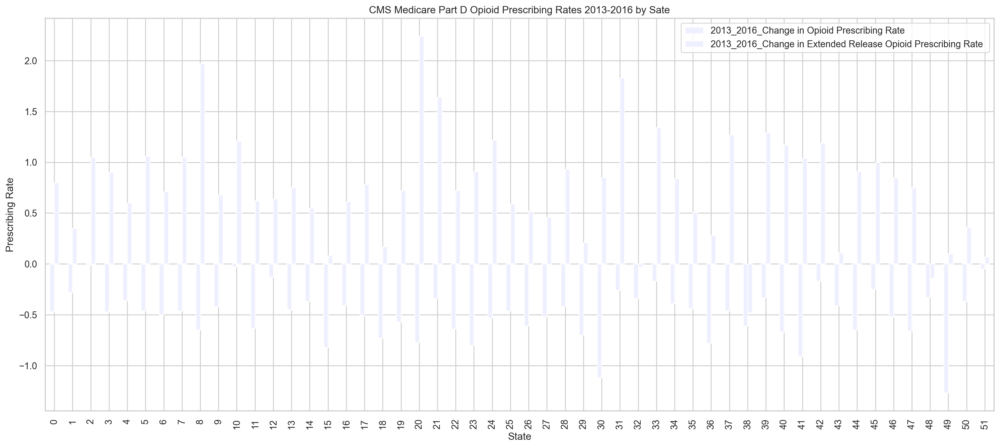

In [ ]:
# Configure plot and ticks
psr_changeex_df.plot(kind="bar", facecolor="#eeefff", figsize=(18,8))

#Set bar labels
bar_labels = psr_df['State_Name']

# Create the x position of the bars
x_pos = list(range(len(bar_labels)))


# Set textual properties
plt.title("CMS Medicare Part D Opioid Prescribing Rates 2013-2016 by Sate")
plt.ylabel("Prescribing Rate")
plt.xlabel("State")

# Show plot
plt.show()

In [ ]:
psr_changeex_df1 = psr_df[['State_Name', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
psr_changeex_df1

,State_Name,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,0.80
1,Alabama,0.35
2,Alaska,1.05
3,Arizona,0.90
4,Arkansas,0.60
5,California,1.06
6,Colorado,0.71
7,Connecticut,1.05
8,Delaware,1.97
9,District of Columbia,0.68


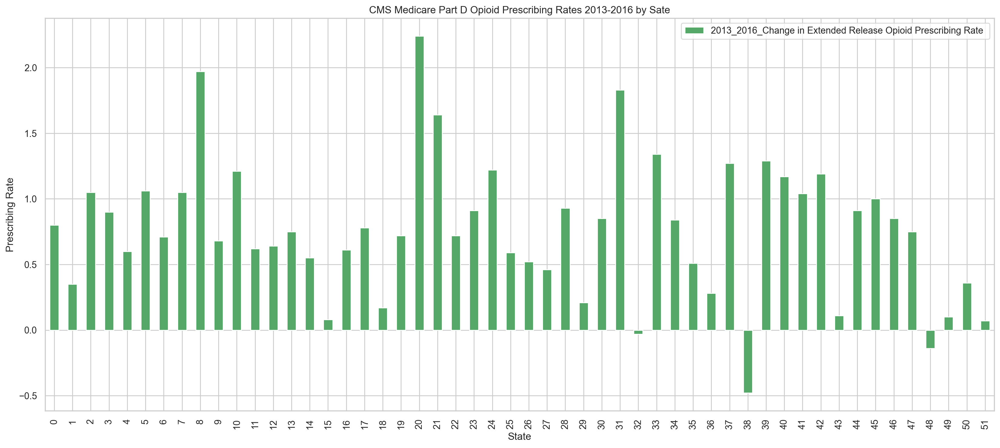

In [ ]:
# Configure plot and ticks
psr_changeex_df1.plot(kind="bar", facecolor="g", figsize=(18,8))

#Set bar labels
bar_labels = psr_df["State_Abbreviation"]

# Create the x position of the bars
x_pos = list(range(len(bar_labels)))


# Set textual properties
plt.title("CMS Medicare Part D Opioid Prescribing Rates 2013-2016 by Sate")
plt.ylabel("Prescribing Rate")
plt.xlabel("State")

# Show plot
plt.show()

In [ ]:
psr_changeex_df = psr_df[['State_Name','2013_2016_Change in Opioid Prescribing Rate', '2013_2016_Change in Extended Release Opioid Prescribing Rate ']]
psr_changeex_df

,State_Name,2013_2016_Change in Opioid Prescribing Rate,2013_2016_Change in Extended Release Opioid Prescribing Rate
0,National,-0.47,0.80
1,Alabama,-0.28,0.35
2,Alaska,-0.01,1.05
3,Arizona,-0.47,0.90
4,Arkansas,-0.36,0.60
5,California,-0.46,1.06
6,Colorado,-0.50,0.71
7,Connecticut,-0.46,1.05
8,Delaware,-0.65,1.97
9,District of Columbia,-0.42,0.68


In [ ]:
psr_changeex_df.columns

Index(['State_Name', '2013_2016_Change in Opioid Prescribing Rate',
       '2013_2016_Change in Extended Release Opioid Prescribing Rate '],
      dtype='object')

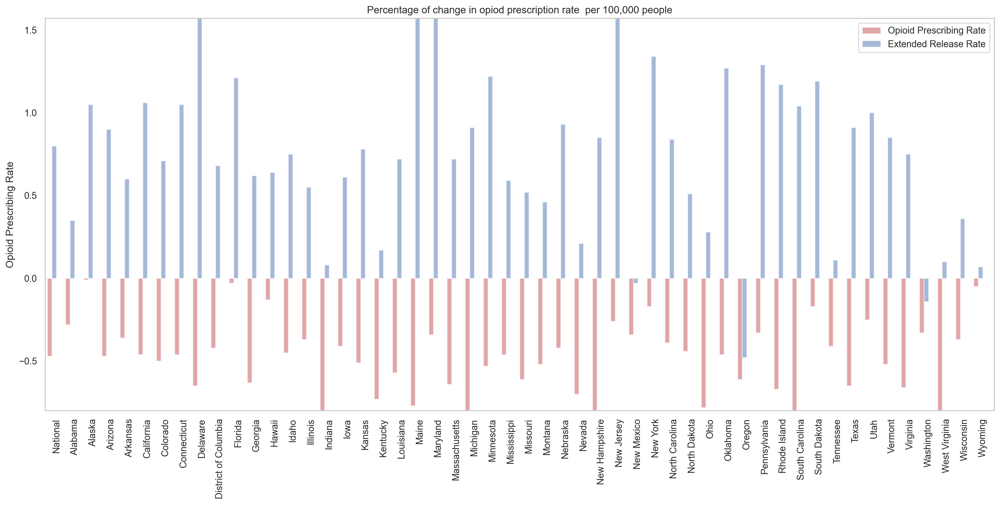

In [ ]:
# Setting the positions and width for the bars
pos = list(range(len(psr_changeex_df['State_Name'])))
width = 0.25

# Plotting the bars
fig, ax = plt.subplots(figsize=(18,8))

# Create a bar with pre_score data,
# in position pos,
plt.bar(pos,
        #using psr_changeex_df['2013_2016_Change in Opioid Prescribing Rate'] data,

        psr_changeex_df['2013_2016_Change in Opioid Prescribing Rate'],
        # of width
        width,
        # with alpha 0.5
        alpha=0.5,
        # with color
        color='r',
        # with label the first value in first_name
        label=psr_changeex_df['2013_2016_Change in Opioid Prescribing Rate'][0])

# Create a bar with mid_of length of data,
# in position pos + some width buffer,
plt.bar([p + width for p in pos],
        #using df['mid_score'] data,
        psr_changeex_df['2013_2016_Change in Extended Release Opioid Prescribing Rate '],
        # of width
        width,
        # with alpha 0.5
        alpha=0.5,
        # with color
        color='b',
        # with label the second value in first_name
        label= psr_changeex_df['2013_2016_Change in Extended Release Opioid Prescribing Rate '][1])

# Set the y axis label
ax.set_ylabel('Opioid Prescribing Rate')
#plt.ylabel("Prescribing Rate")

# Set the chart's title
ax.set_title('Percentage of change in opiod prescription rate  per 100,000 people')
#plt.title("CMS Medicare Part D Opioid Prescribing Rates 2013-2016 by Sate")

# Set the position of the x ticks
ax.set_xticks([p + 1.5 * width for p in pos])

# Set the labels for the x ticks
ax.set_xticklabels(psr_changeex_df['State_Name'], rotation = "vertical")
#plt.xlabel("State")

# Setting the x-axis and y-axis limits
plt.xlim(min(pos)-width, max(pos)+width*4)
plt.ylim([-0.8, max( psr_changeex_df['2013_2016_Change in Opioid Prescribing Rate'] + psr_changeex_df['2013_2016_Change in Extended Release Opioid Prescribing Rate '])] )

# Adding the legend and showing the plot
plt.legend(['Opioid Prescribing Rate', 'Extended Release Rate'], loc='upper right')
plt.grid()
plt.show()

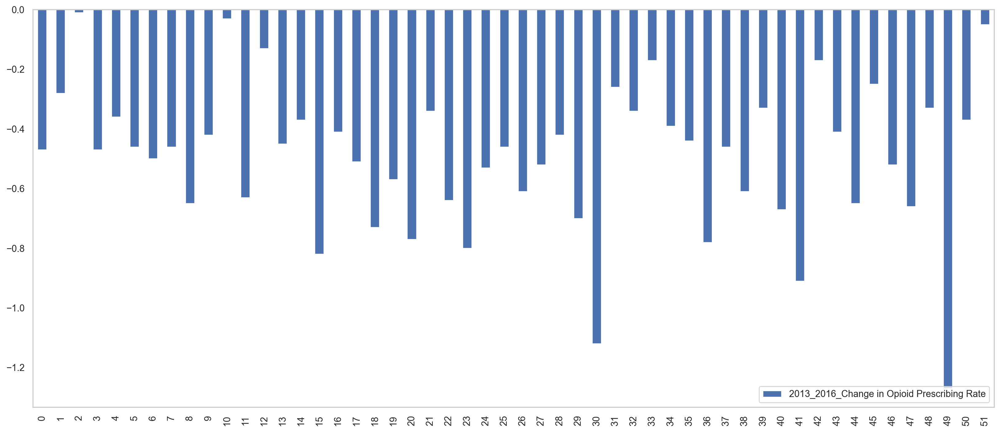

In [ ]:
psr_changeex_df['2013_2016_Change in Opioid Prescribing Rate'].plot.bar(x= psr_changeex_df['State_Name'],y='Opioid Prescribing Rate')
# pos = list(range(len(psr_changeex_df['State_Name'])))
# Adding the legend and showing the plot
plt.legend(['2013_2016_Change in Opioid Prescribing Rate', 'Extended Release Rate'], loc='lower right')
plt.grid()

(-0.8, 1.57)

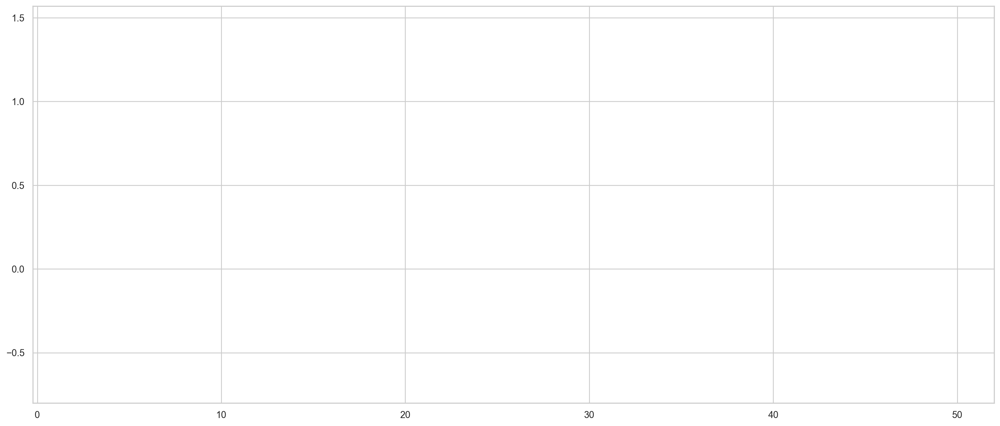

In [ ]:
# Setting the x-axis and y-axis limits
plt.xlim(min(pos)-width, max(pos)+width*4)
plt.ylim([-0.8, max( psr_changeex_df['2013_2016_Change in Opioid Prescribing Rate'] + psr_changeex_df['2013_2016_Change in Extended Release Opioid Prescribing Rate '])])


/var/folders/b7/cx8d0sxx3zqdm7j6rd9fl51c0000gn/T/ipykernel_906/2601136442.py:33: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


<function matplotlib.pyplot.show(close=None, block=None)>

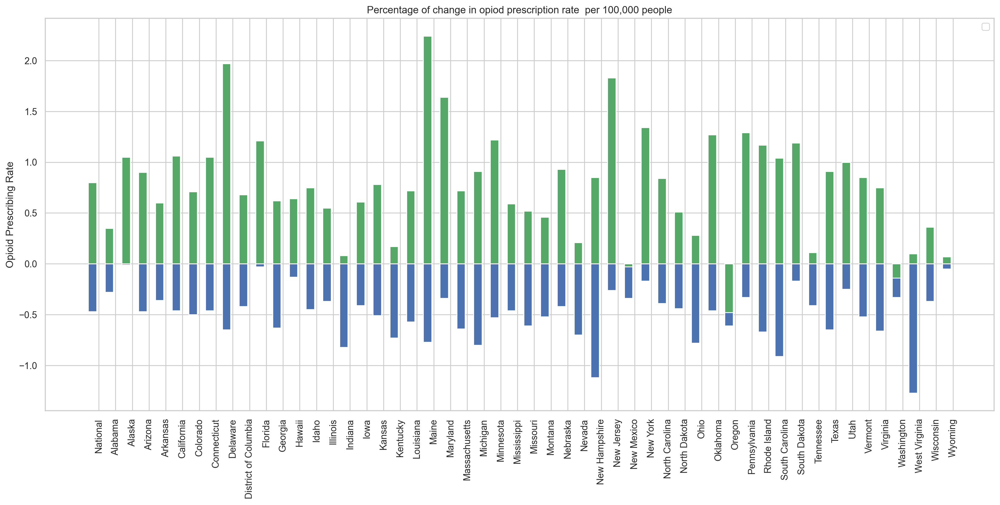

In [ ]:
# Setting the positions and width for the bars
pos = list(range(len(psr_changeex_df['State_Name'])))
width = 0.25
# Plotting the bars
fig, ax = plt.subplots(figsize=(18,8))
# Set the position of the x ticks
ax.set_xticks([p + 1.5 * width for p in pos])
# Set the y axis label
ax.set_ylabel('Opioid Prescribing Rate')
#plt.ylabel("Prescribing Rate")

# Set the chart's title
ax.set_title('Percentage of change in opiod prescription rate  per 100,000 people')
#plt.title("CMS Medicare Part D Opioid Prescribing Rates 2013-2016 by Sate")

# Set the position of the x ticks
ax.set_xticks([p + 1.5 * width for p in pos])

# Set the labels for the x ticks
ax.set_xticklabels(psr_changeex_df['State_Name'], rotation = "vertical")
#plt.xlabel("State")

# Set the labels for the x ticks
ax.set_xticklabels(psr_changeex_df['State_Name'], rotation = "vertical")
#plt.xlabel("State")
x = psr_changeex_df['State_Name']
ax.set_xticklabels(psr_changeex_df['State_Name'], rotation = "vertical")
y=psr_changeex_df['2013_2016_Change in Opioid Prescribing Rate']
z=psr_changeex_df['2013_2016_Change in Extended Release Opioid Prescribing Rate ']
plt.bar(x, y,width=0.5,color='b',align='center')
plt.bar(x, z,width=0.5,color='g',align='center')
plt.legend(['2013_2016_Change in Opioid Prescribing Rate', 'Extended Release Rate'], loc='upper right')
plt.legend()
plt.show

In [ ]:
mental_death = pd.read_csv('./inputs/opiodmentalhealthdeath.csv')

In [ ]:
mental_death.head()[:2]

,Unnamed: 0,Location,1999__Opioid Overdose Death Rate (Age-Adjusted),2000__Opioid Overdose Death Rate (Age-Adjusted),2001__Opioid Overdose Death Rate (Age-Adjusted),2002__Opioid Overdose Death Rate (Age-Adjusted),2003__Opioid Overdose Death Rate (Age-Adjusted),2004__Opioid Overdose Death Rate (Age-Adjusted),2005__Opioid Overdose Death Rate (Age-Adjusted),2006__Opioid Overdose Death Rate (Age-Adjusted),...,FY2005__SMHA Expenditures Per Capita,FY2006__SMHA Expenditures Per Capita,FY2007__SMHA Expenditures Per Capita,FY2008__SMHA Expenditures Per Capita,FY2009__SMHA Expenditures Per Capita,FY2010__SMHA Expenditures Per Capita,FY2011__SMHA Expenditures Per Capita,FY2012__SMHA Expenditures Per Capita,FY2013__SMHA Expenditures Per Capita,Footnotes
0,0,United States,2.9,3.0,3.3,4.1,4.5,4.7,5.1,5.9,...,99.55,103.53,113.27,121.13,122.90,120.56,123.93,124.99,119.62,NaN
1,1,Alabama,0.8,1.0,1.3,1.6,1.1,1.8,1.8,2.7,...,60.31,64.43,74.03,79.39,77.89,78.19,78.33,76.27,72.64,NaN


In [ ]:
mental_death.drop(['Unnamed: 0','Footnotes'], axis =1, inplace =True)

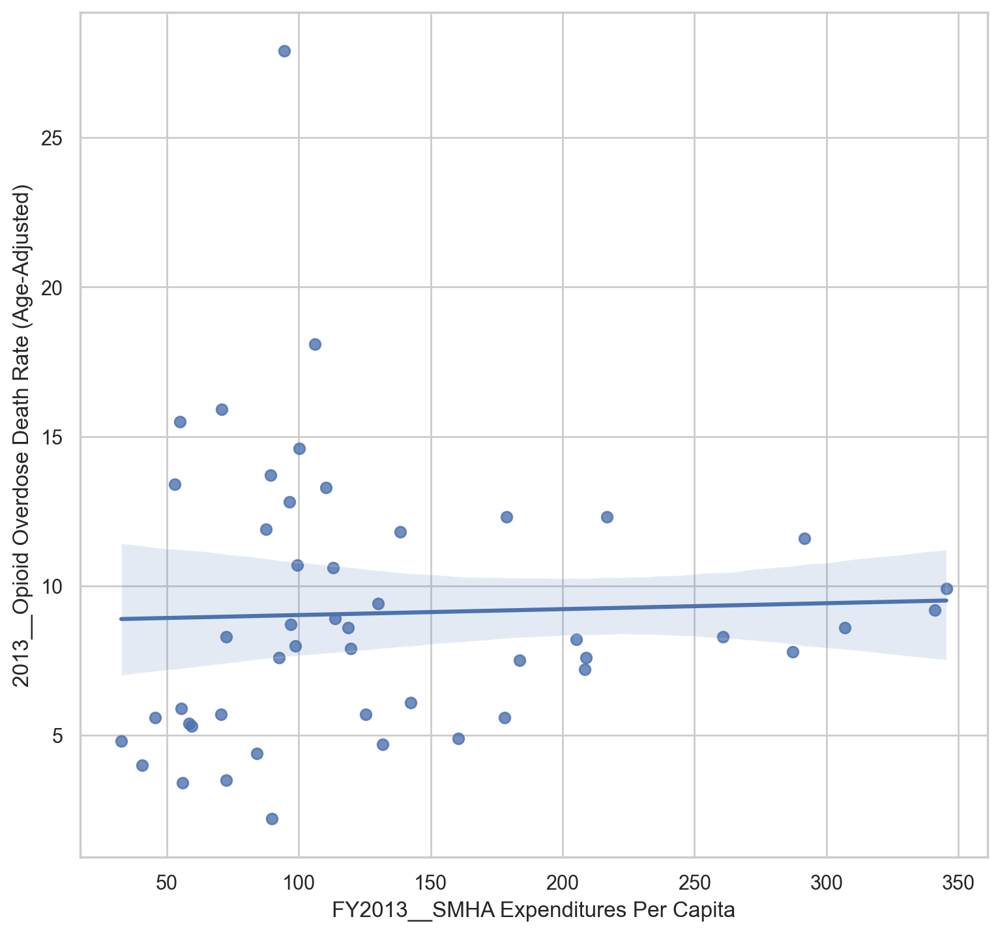

In [ ]:
plt.figure(figsize=(8,8))
sns.regplot(x=mental_death['FY2013__SMHA Expenditures Per Capita'],\
                           y=mental_death['2013__Opioid Overdose Death Rate (Age-Adjusted)'])
plt.show()

In [ ]:
# regression of 2013 opioid overdose deaths on 2013 state mental health agency expenditure per capita
# i am using this because the  data i got access was until 2013

y=mental_death['2013__Opioid Overdose Death Rate (Age-Adjusted)']
x=mental_death['FY2013__SMHA Expenditures Per Capita']
x = sm.add_constant(x)
results = sm.OLS(y, x).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                           OLS Regression Results                                          
===========================================================================================================
Dep. Variable:     2013__Opioid Overdose Death Rate (Age-Adjusted)   R-squared:                       0.001
Model:                                                         OLS   Adj. R-squared:                 -0.020
Method:                                              Least Squares   F-statistic:                   0.05751
Date:                                             Thu, 03 Apr 2025   Prob (F-statistic):              0.812
Time:                                                     21:58:47   Log-Likelihood:                -143.34
No. Observations:                                               49   AIC:                             290.7
Df Residuals:                                                   47   BIC:                             294.5
Df Model:                                                        1                                         
Covariance Type:                                         nonrobust                                         
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                    8.8255      1.276      6.915      0.000       6.258      11.393
FY2013__SMHA Expenditures Per Capita     0.0020      0.008      0.240      0.812      -0.015       0.019
==============================================================================
Omnibus:                       27.855   Durbin-Watson:                   1.933
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               59.157
Skew:                           1.622   Prob(JB):                     1.43e-13
Kurtosis:                       7.296   Cond. No.                         300.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

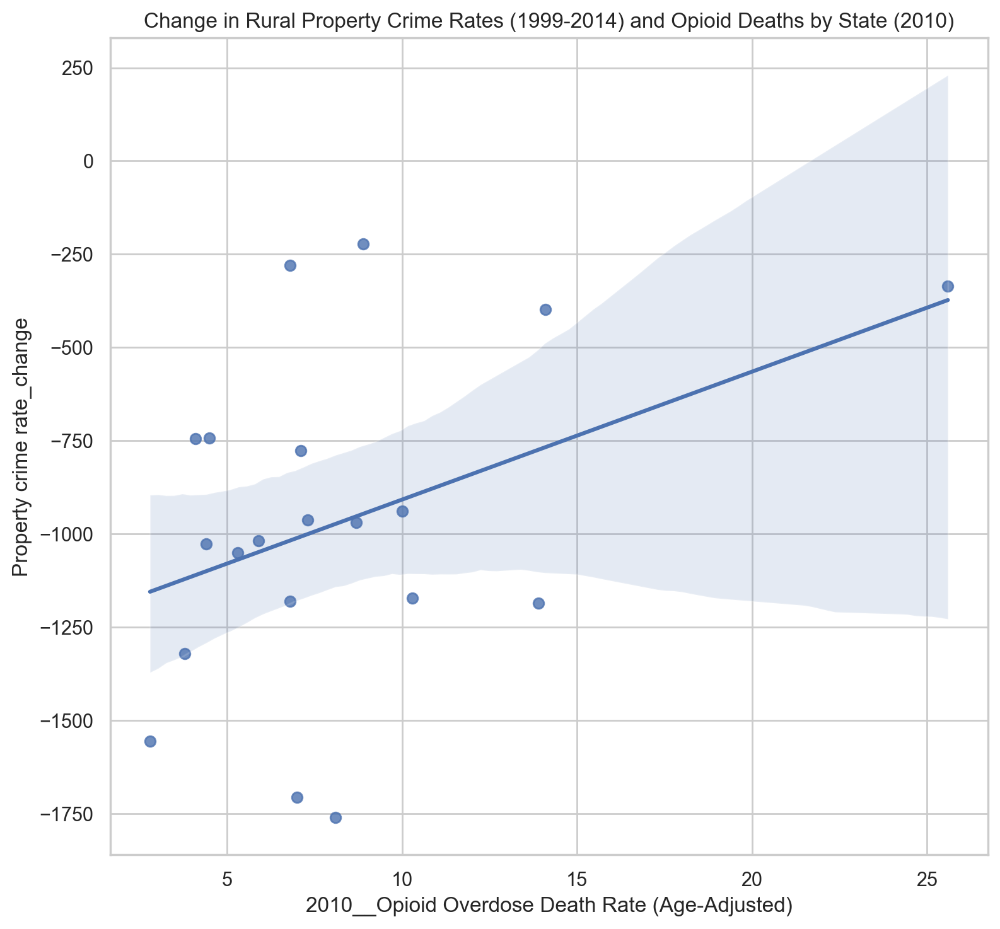

In [ ]:
# scatter plot of change in property crime rates and opioid deaths in 2014
#where urban == 0
UCrime_df= pd.read_csv('./inputs/mergedcrimeUcrimevisual.csv')
RCrime_df = UCrime_df[UCrime_df['urban'] == 0]

plt.figure(figsize=(8,8))
sns.regplot(x=RCrime_df['2010__Opioid Overdose Death Rate (Age-Adjusted)'],\
                   y=RCrime_df['Property crime rate_change'])

plt.title('Change in Rural Property Crime Rates (1999-2014) and Opioid Deaths by State (2010)')
plt.show()

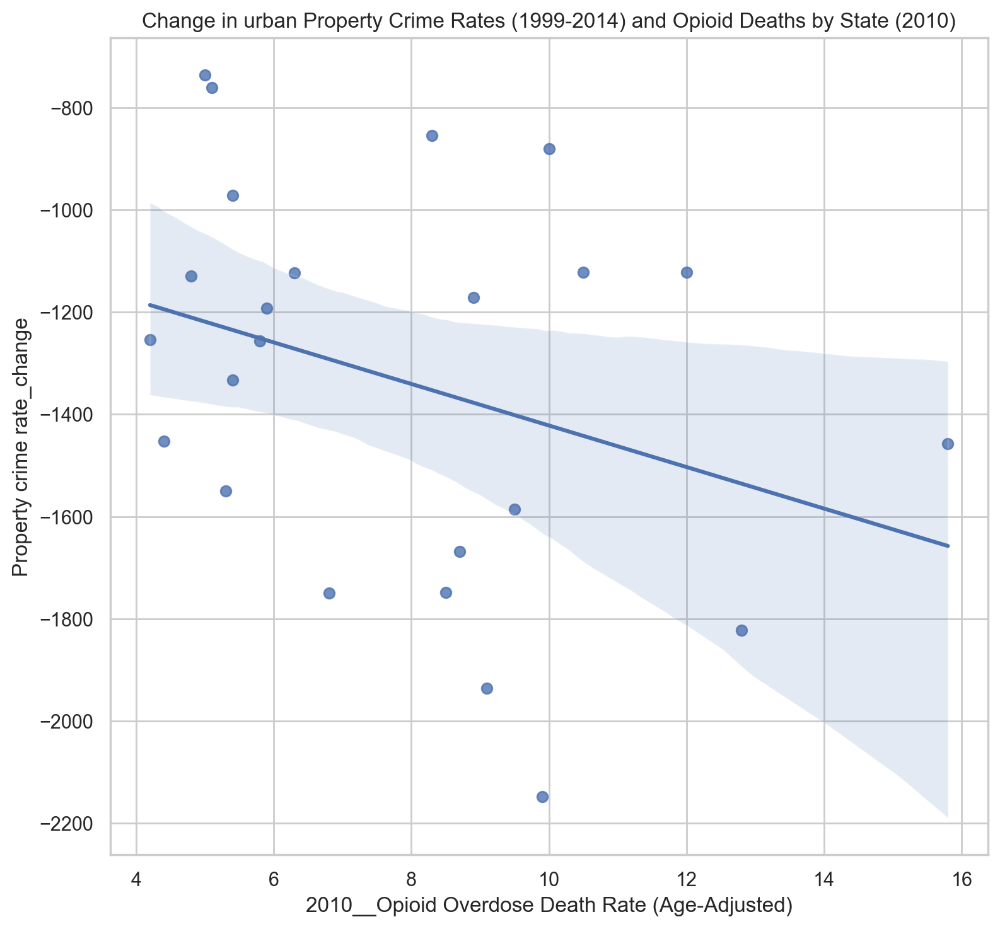

In [ ]:
# scatter plot of change in property crime rates and opioid deaths in 2014
    #where urban == 1
UCrime_df= pd.read_csv('./inputs/mergedcrimeUcrimevisual.csv')
UrbCrime_df = UCrime_df[UCrime_df['urban'] == 1]

plt.figure(figsize=(8,8))
sns.regplot(x=UrbCrime_df['2010__Opioid Overdose Death Rate (Age-Adjusted)'],\
                   y=UrbCrime_df['Property crime rate_change'])

plt.title('Change in urban Property Crime Rates (1999-2014) and Opioid Deaths by State (2010)')
plt.show()

In [ ]:
# multivar reg on 'Change in Rural Property Crime Rates (1999-2014) and Opioid Deaths by State (2010)'

y= UCrime_df['Property crime rate_change']
x= UCrime_df[['Change in Death', 'urban']]
x = sm.add_constant(x)
results = sm.OLS(y, x).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                OLS Regression Results                                
======================================================================================
Dep. Variable:     Property crime rate_change   R-squared:                       0.227
Model:                                    OLS   Adj. R-squared:                  0.189
Method:                         Least Squares   F-statistic:                     6.022
Date:                        Thu, 03 Apr 2025   Prob (F-statistic):            0.00509
Time:                                21:58:58   Log-Likelihood:                -324.54
No. Observations:                          44   AIC:                             655.1
Df Residuals:                              41   BIC:                             660.4
Df Model:                                   2                                         
Covariance Type:                    nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -1138.4056    135.378     -8.409      0.000   -1411.807    -865.005
Change in Death    28.1421     16.677      1.687      0.099      -5.539      61.823
urban            -287.2462    130.196     -2.206      0.033    -550.183     -24.309
==============================================================================
Omnibus:                        0.819   Durbin-Watson:                   2.537
Prob(Omnibus):                  0.664   Jarque-Bera (JB):                0.899
Skew:                          -0.272   Prob(JB):                        0.638
Kurtosis:                       2.558   Cond. No.                         17.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<Axes: xlabel='Specialty'>

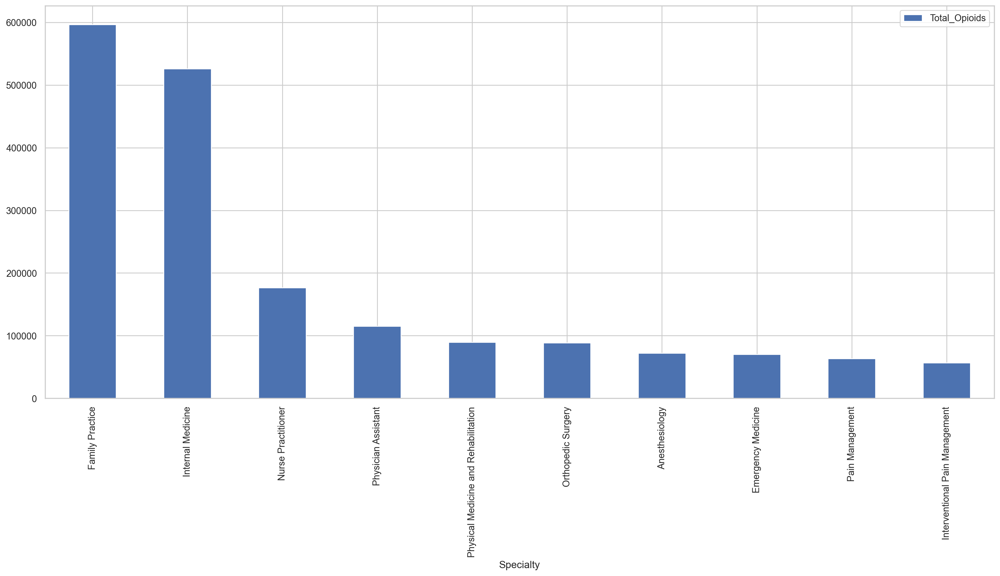

In [ ]:
import matplotlib.pyplot as plt
opstot =pd.read_csv('./inputs/TotalOpioidsvisualization.csv')
OpioidsPerSpecialty = opstot[['Specialty','Total_Opioids']]
OpioidsPerSpecialty_group = OpioidsPerSpecialty.groupby('Specialty')
OpioidsPerSpecialty_totals = pd.DataFrame(OpioidsPerSpecialty_group.sum())

OpioidsPerSpecialty_totals=OpioidsPerSpecialty_totals.sort_values('Total_Opioids', ascending=False)
OpioidsPerSpecialty_totals.head(10).plot(kind='bar')

#Plotting a bar plot of total opioids prescribed vs the Speciality of the prescriber

#Model

In [ ]:
## Read Data
df=pd.read_csv('./inputs/cleaned_prescriber_info18.csv')
df.head()[:2]

/var/folders/b7/cx8d0sxx3zqdm7j6rd9fl51c0000gn/T/ipykernel_906/3269066972.py:2: DtypeWarning: Columns (5,6) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('./inputs/cleaned_prescriber_info18.csv')


,NPI,Gender,State,Credentials,Specialty,NPPES Provider Last Name,NPPES Provider First Name,NPPES Provider ZIP Code,NPPES Provider State,Totalclaimcount,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
0,1003002320,M,MS,D.M.D. P.A.,Dentist,EKLUND,D.,39208.0,MS,129,...,0,0,0,0,0,0,4.5,1.0,1,1.0
1,1003004771,F,CO,M.D.,Pulmonary Disease,RIGGLE,ERIN,80120.0,CO,537,...,0,0,16,0,0,0,4.5,0.0,0,0.0


In [ ]:
print(df.shape)

(25000, 264)


In [ ]:
opioids=pd.read_csv('./inputs/list_opioids.csv')

In [ ]:
name=opioids['Drug Name']
import re
new_name=name.apply(lambda x:re.sub("\ |-",".",str(x)))
columns=df.columns
Abandoned_variables = set(columns).intersection(set(new_name))
Kept_variable=[]
for each in columns:
    if each in Abandoned_variables:
        pass
    else:
        Kept_variable.append(each)

In [ ]:
df=df[Kept_variable]
print(df.shape)

(25000, 253)


In [ ]:
df.head()[:2]

,NPI,Gender,State,Credentials,Specialty,NPPES Provider Last Name,NPPES Provider First Name,NPPES Provider ZIP Code,NPPES Provider State,Totalclaimcount,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
0,1003002320,M,MS,D.M.D. P.A.,Dentist,EKLUND,D.,39208.0,MS,129,...,0,0,0,0,0,0,4.5,1.0,1,1.0
1,1003004771,F,CO,M.D.,Pulmonary Disease,RIGGLE,ERIN,80120.0,CO,537,...,0,0,16,0,0,0,4.5,0.0,0,0.0


In [ ]:
# Clean and convert ZIP codes
# df['NPPES Provider ZIP Code'] = df['NPPES Provider ZIP Code'].str.replace(',', '')
# df['NPPES Provider ZIP Code'] = df['NPPES Provider ZIP Code'].str.replace(' ', '')
df['NPPES Provider ZIP Code'] = df['NPPES Provider ZIP Code'].astype(float)

In [ ]:
df.isnull().sum()

NPI                     0
Gender                  0
State                   0
Credentials            82
Specialty               0
                     ... 
ZOLPIDEM.TARTRATE       0
avg_op_supply        2610
op_longer            2610
Opioid_Prescriber       0
op_prescriber        2610
Length: 253, dtype: int64

In [ ]:
df.fillna(0,inplace = True)

In [ ]:
df.columns

Index(['NPI', 'Gender', 'State', 'Credentials', 'Specialty',
       'NPPES Provider Last Name', 'NPPES Provider First Name',
       'NPPES Provider ZIP Code', 'NPPES Provider State', 'Totalclaimcount',
       ...
       'VYTORIN', 'WARFARIN.SODIUM', 'XARELTO', 'ZETIA', 'ZIPRASIDONE.HCL',
       'ZOLPIDEM.TARTRATE', 'avg_op_supply', 'op_longer', 'Opioid_Prescriber',
       'op_prescriber'],
      dtype='object', length=253)

In [ ]:
df.drop(
    ['NPPES Provider Last Name', 'NPPES Provider First Name', 'NPPES Provider ZIP Code', 'NPPES Provider State'],
    axis=1,
    inplace=True,
    errors='ignore'
)


In [ ]:
df.head()[:2]

,NPI,Gender,State,Credentials,Specialty,Totalclaimcount,OpioidClaimCount,ACYCLOVIR,ADVAIR.DISKUS,AGGRENOX,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
0,1003002320,M,MS,D.M.D. P.A.,Dentist,129,29,0,0,0,...,0,0,0,0,0,0,4.5,1.0,1,1.0
1,1003004771,F,CO,M.D.,Pulmonary Disease,537,0,0,61,0,...,0,0,16,0,0,0,4.5,0.0,0,0.0


In [ ]:
from sklearn.model_selection import train_test_split
train,test = train_test_split(df,test_size=0.3,random_state=42)
print(train.shape)
print(test.shape)

(17500, 249)
(7500, 249)


In [ ]:
Categorical_columns=['Gender','State','Credentials','Specialty']
for col in Categorical_columns:
    train[col]=pd.factorize(train[col], sort=True)[0]
    test[col] =pd.factorize(test[col],sort=True)[0]

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor, AdaBoostRegressor
from sklearn.svm import SVR

y = train['Opioid_Prescriber']

X = train.iloc[:,1:245]
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [ ]:
train.iloc[:,1:245][:2]

,Gender,State,Credentials,Specialty,Totalclaimcount,OpioidClaimCount,ACYCLOVIR,ADVAIR.DISKUS,AGGRENOX,ALENDRONATE.SODIUM,...,VENTOLIN.HFA,VERAPAMIL.ER,VESICARE,VOLTAREN,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE
4913,0,18,517,48,153,36,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9338,0,6,284,25,229,0,0,0,0,0,...,0,0,0,0,0,0,0,14,0,0


In [ ]:
X =train.iloc[:,1:245]
y = train['Opioid_Prescriber']

In [ ]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

print("Linear Regrssion: ")
print("Five cross-val score means: {}".format(cross_val_score(lr_model, X_train, y_train, cv = 5).mean()))
print("Test score:", lr_model.score(X_test, y_test))
print("-----")

knn_reg = KNeighborsRegressor()
knn_reg_params = {
    'n_neighbors':[1,2,3,4,5,6,7,8,9,10]
}
gs_knn_reg = GridSearchCV(knn_reg, knn_reg_params)
gs_knn_reg.fit(X_train, y_train)

print("k-nearest:")
print("Five cross-val score means: {}".format(cross_val_score(gs_knn_reg, X_train, y_train, cv = 5).mean()))
print("Test score:", gs_knn_reg.score(X_test, y_test))
print("-----")

tree_reg = DecisionTreeRegressor()
tree_reg_params = {
#     'n_neighbors':[1,2,3,4,5,6,7,8,9,10]
}
gs_tree_reg = GridSearchCV(tree_reg, tree_reg_params)
gs_tree_reg.fit(X_train, y_train)

print("Decision Tree Regressor: ")
print("Five cross-val score means: {}".format(cross_val_score(gs_tree_reg, X_train, y_train, cv = 5).mean()))
print("Test score:", gs_tree_reg.score(X_test, y_test))
print("-----")

bag_reg = BaggingRegressor()
bag_reg_params = {}

gs_bag_reg = GridSearchCV(bag_reg, bag_reg_params)
gs_bag_reg.fit(X_train, y_train)

print("Bagging Regressor: ")
print("Five cross-val score means: {}".format(cross_val_score(gs_bag_reg, X_train, y_train, cv = 5).mean()))
print("Test score:", gs_bag_reg.score(X_test, y_test))
print("-----")

rf_reg = RandomForestRegressor()
rf_reg_params = {}

gs_rf_reg = GridSearchCV(rf_reg, rf_reg_params)
gs_rf_reg.fit(X_train, y_train)

print("Random Forest Regressor: ")
print("Five cross-val score means: {}".format(cross_val_score(gs_rf_reg, X_train, y_train, cv = 5).mean()))
print("Test score:", gs_rf_reg.score(X_test, y_test))
print("-----")

ada_reg = AdaBoostRegressor()
ada_reg_params = {}

gs_ada_reg = GridSearchCV(ada_reg, ada_reg_params)
gs_ada_reg.fit(X_train, y_train)

print("AdaBoost Regressor:")
print("Five cross-val score means: {}".format(cross_val_score(gs_ada_reg, X_train, y_train, cv = 5).mean()))
print("Test score:", gs_ada_reg.score(X_test, y_test))
print("-----")

svr = SVR()
svr_params = {
    'C':[.1,1,.1]
}

gs_svr = GridSearchCV(svr, svr_params)
gs_svr.fit(X_train, y_train)

print("Support Vector Regressor:")
print("five cross-val score means: {}".format(cross_val_score(gs_svr, X_train, y_train, cv = 5).mean()))
print("Test score:", gs_svr.score(X_test, y_test))
print("-----")

Linear Regrssion: 
Five cross-val score means: 0.6290884433016254
Test score: 0.5016603777717341
-----
k-nearest:
Five cross-val score means: 0.5805387233676053
Test score: 0.46425543934307745
-----
Decision Tree Regressor: 
Five cross-val score means: 0.26913524993029914
Test score: 0.1878724120497952
-----
Bagging Regressor: 
Five cross-val score means: 0.5765017584560133
Test score: 0.4448166347556922
-----
Random Forest Regressor: 
Five cross-val score means: 0.5983534777476484
Test score: 0.5154612943112364
-----
AdaBoost Regressor:
Five cross-val score means: -0.4480775629990613
Test score: -0.3312842494135888
-----
Support Vector Regressor:
five cross-val score means: 0.08132724730928782
Test score: 0.07713374234246184
-----


In [ ]:
from sklearn.pipeline import Pipeline

from sklearn.preprocessing import StandardScaler

from sklearn.svm import SVR

from sklearn.neighbors import KNeighborsRegressor

from sklearn.model_selection import cross_val_score

from sklearn.ensemble import RandomForestRegressor

from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import cross_val_score
from sklearn import svm
from sklearn.datasets import make_regression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np
print("RMSE scores")
print("\n")
print("LR:\n------")
print("Train score:", np.sqrt(mean_squared_error(lr_model.predict(X_train), y_train)))
print("Test score:", np.sqrt(mean_squared_error(lr_model.predict(X_test), y_test)))

print("\n")
print("KNN:\n------")
print("Train score:", np.sqrt(mean_squared_error(gs_knn_reg.predict(X_train), y_train)))
print("Test score:", np.sqrt(mean_squared_error(gs_knn_reg.predict(X_test), y_test)))

print("\n")
print("Tree:\n------")
print("Train score:", np.sqrt(mean_squared_error(gs_tree_reg.predict(X_train), y_train)))
print("Test score:", np.sqrt(mean_squared_error(gs_tree_reg.predict(X_test), y_test)))

print("\n")
print("Bag:\n------")
print("Train score:", np.sqrt(mean_squared_error(gs_bag_reg.predict(X_train), y_train)))
print("Test score:", np.sqrt(mean_squared_error(gs_bag_reg.predict(X_test), y_test)))

print("\n")
print("Random Forest:\n------")
print("Train score:", np.sqrt(mean_squared_error(gs_rf_reg.predict(X_train), y_train)))
print("Test score:", np.sqrt(mean_squared_error(gs_rf_reg.predict(X_test), y_test)))

print("\n")
print("AdaBoost:\n------")
print("Train score:", np.sqrt(mean_squared_error(gs_ada_reg.predict(X_train), y_train)))
print("Test score:", np.sqrt(mean_squared_error(gs_ada_reg.predict(X_test), y_test)))

print("\n")
print("SVR:\n------")
print("Train score:", np.sqrt(mean_squared_error(gs_svr.predict(X_train), y_train)))
print("Test score:", np.sqrt(mean_squared_error(gs_svr.predict(X_test), y_test)))

RMSE scores


LR:
------
Train score: 5.160982221763839
Test score: 6.938934015403676


KNN:
------
Train score: 6.2110352381997265
Test score: 7.194637773954482


Tree:
------
Train score: 0.0
Test score: 8.858132663587416


Bag:
------
Train score: 2.6020835607533543
Test score: 7.323998907700628


Random Forest:
------
Train score: 2.5376702866624585
Test score: 6.842176701271939


AdaBoost:
------
Train score: 10.140081165662334
Test score: 11.341368072777751


SVR:
------
Train score: 10.86015104092895
Test score: 9.442770444246209


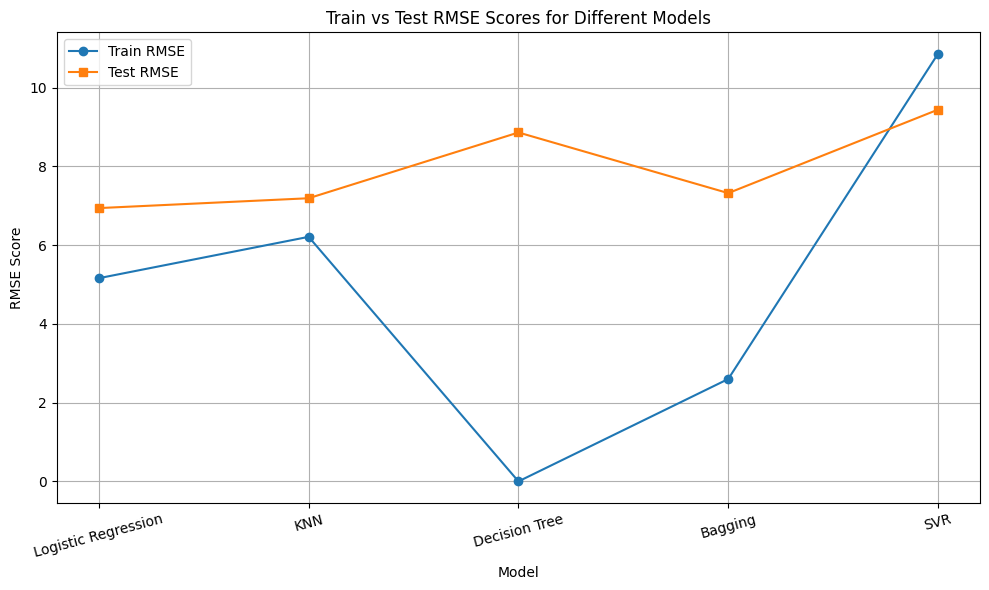

In [1]:
import matplotlib.pyplot as plt

# Model names
models = ['Logistic Regression', 'KNN', 'Decision Tree', 'Bagging', 'SVR']

# RMSE scores
train_scores = [5.16, 6.21, 0.00, 2.60, 10.86]
test_scores = [6.94, 7.19, 8.86, 7.32, 9.44]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(models, train_scores, marker='o', label='Train RMSE')
plt.plot(models, test_scores, marker='s', label='Test RMSE')
plt.title('Train vs Test RMSE Scores for Different Models')
plt.xlabel('Model')
plt.ylabel('RMSE Score')
plt.legend()
plt.grid(True)
plt.xticks(rotation=15)
plt.tight_layout()

# Show plot
plt.show()

In [ ]:
df.columns

Index(['NPI', 'Gender', 'State', 'Credentials', 'Specialty', 'Totalclaimcount',
       'OpioidClaimCount', 'ACYCLOVIR', 'ADVAIR.DISKUS', 'AGGRENOX',
       ...
       'VYTORIN', 'WARFARIN.SODIUM', 'XARELTO', 'ZETIA', 'ZIPRASIDONE.HCL',
       'ZOLPIDEM.TARTRATE', 'avg_op_supply', 'op_longer', 'Opioid_Prescriber',
       'op_prescriber'],
      dtype='object', length=249)

# Evaluation

In [ ]:
ineligible_noOpioidsPrescriber = (df['Opioid_Prescriber'] == 0) & (df['op_longer'] == 0)
ineligible_yesOpioid_Prescriber = (df['Opioid_Prescriber'] == 0) & (df['op_longer'] == 1)
eligible_noOpioid_Prescriber = (df['Opioid_Prescriber'] == 1) & (df['op_longer'] == 0)
eligible_yesOpioid_Prescriber = (df['Opioid_Prescriber'] == 1) & (df['op_longer'] == 1)
print(
"Ineligible and not Opioid_Prescriber:\t\t", df[ineligible_noOpioidsPrescriber].shape[0],
"\nIneligible and has a Opioid_Prescriber:\t", df[ineligible_yesOpioid_Prescriber].shape[0],
"\nEligible and noOpioid_Prescriber:\t\t", df[eligible_noOpioid_Prescriber].shape[0],
"\nEligible and has prescribed opiods:\t", df[eligible_yesOpioid_Prescriber].shape[0])

Ineligible and not Opioid_Prescriber:		 11123 
Ineligible and has a Opioid_Prescriber:	 0 
Eligible and noOpioid_Prescriber:		 4 
Eligible and has prescribed opiods:	 13331


In [ ]:
df.head()[:2]

,NPI,Gender,State,Credentials,Specialty,Totalclaimcount,OpioidClaimCount,ACYCLOVIR,ADVAIR.DISKUS,AGGRENOX,...,VYTORIN,WARFARIN.SODIUM,XARELTO,ZETIA,ZIPRASIDONE.HCL,ZOLPIDEM.TARTRATE,avg_op_supply,op_longer,Opioid_Prescriber,op_prescriber
0,1003002320,M,MS,D.M.D. P.A.,Dentist,129,29,0,0,0,...,0,0,0,0,0,0,4.5,1.0,1,1.0
1,1003004771,F,CO,M.D.,Pulmonary Disease,537,0,0,61,0,...,0,0,16,0,0,0,4.5,0.0,0,0.0
